# Exercises on clustering

Here you can find a program to read a data file in csv format. 
The data file has the following heading:
    number of samples, number of features
    list of the names of the features (separated by comma)
The remaining lines contain an example per row.
For each row there is a list of real numbers (commas separated) which are the feature values.   

In [1]:
import csv
import sys
import os
from os.path import join

import numpy as np
 
# this function reads the data file, loads the configuration attributes specifiefd in the heading
# (numer of examples and features), the list of feature names
# and loads the data in a matrix named data    
def load_data(file_path, file_name):
   with open(join(file_path, file_name)) as csv_file:
       data_file = csv.reader(csv_file,delimiter=',')
       temp1 = next(data_file)
       n_samples = int(temp1[0])
       print("n_samples=")
       print(n_samples)
       n_features = int(temp1[1])
       temp2 = next(data_file)
       feature_names = np.array(temp2[:n_features])

       data_list = [iter for iter in data_file]
               
       data = np.asarray(data_list, dtype=np.float64)                  
       
   return(data,feature_names,n_samples,n_features)

# The main program reads the input file containing the dataset
# file_path is the file path where the file with the data to be read are located
# we assume the file contains an example per line
# each example is a list of real values separated by a comma (csv format)
# The first line of the file contains the heading with:
# N_samples,n_features,
# The second line contains the feature names separated by a comma     

#file_path="content/"
file_path="Datasets/"
# all the three datasets contain data points on (x,y) 
file_name1="3-clusters.csv"
file_name2="dataset-DBSCAN.csv"     
file_name3="CURE-complete.csv"    
data1,feature_names1,n_samples1,n_features1 = load_data(file_path, file_name1)
data2,feature_names2,n_samples2,n_features2 = load_data(file_path, file_name2)
data3,feature_names3,n_samples3,n_features3 = load_data(file_path, file_name3)
print("dataset n. 1: n samples, n features")
print(n_samples1, n_features1)
print("dataset n. 2: n samples, n features")
print(n_samples2, n_features2)
print("dataset n. 3: n samples, n features")
print(n_samples3, n_features3)

n_samples=
150
n_samples=
6118
n_samples=
86558
dataset n. 1: n samples, n features
150 2
dataset n. 2: n samples, n features
6118 2
dataset n. 3: n samples, n features
86558 2


The following program plots the dataset n.1

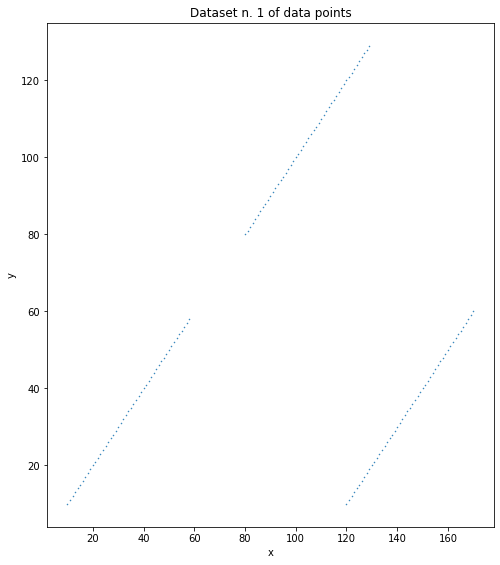

In [2]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Dataset n. 1 of data points')

ax.set_xlabel(feature_names1[0])
ax.set_ylabel(feature_names1[1])

#plot the dataset
plt.plot(data1[:,0], data1[:,1], '.',markersize=1)

plt.show()

The following is the program for plotting the dataset n.2

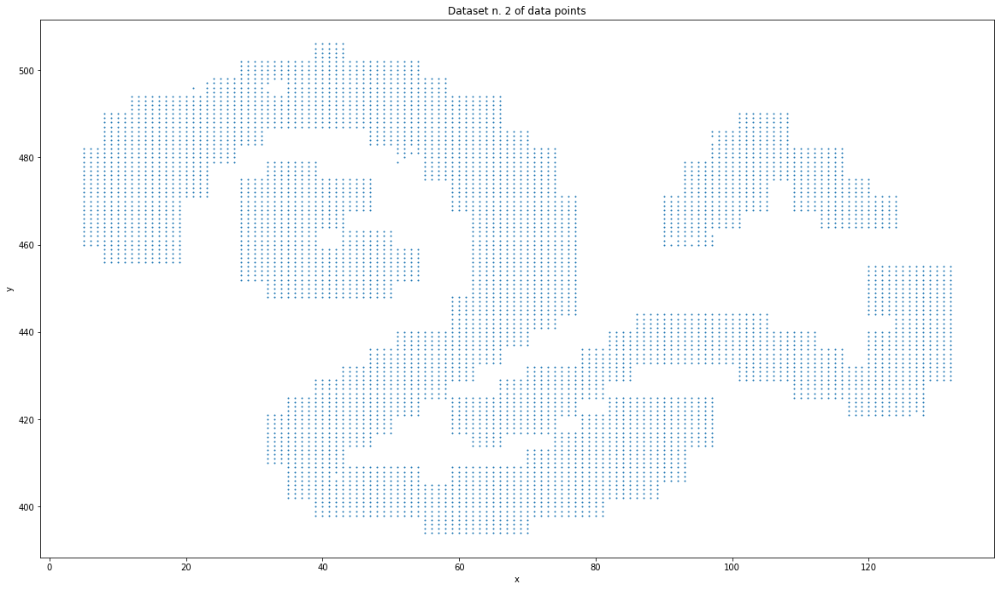

In [3]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Dataset n. 2 of data points')

ax.set_xlabel(feature_names2[0])
ax.set_ylabel(feature_names2[1])

#plot the dataset
plt.plot(data2[:,0], data2[:,1], '.', markersize=2)

plt.show()

The following is the program for plotting the dataset n.3

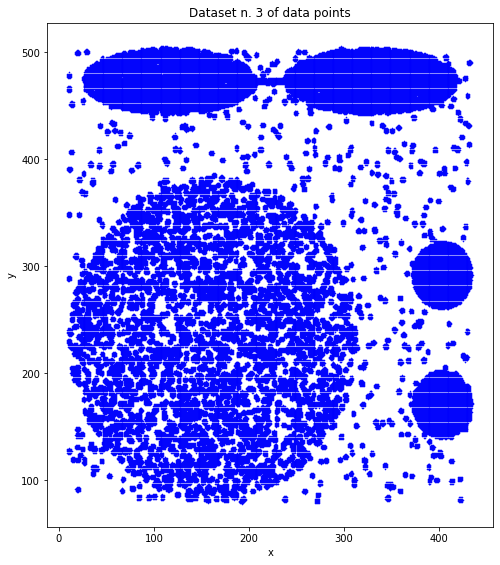

In [4]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Dataset n. 3 of data points')

ax.set_xlabel(feature_names3[0])
ax.set_ylabel(feature_names3[1])

#plot the dataset
plt.plot(data3[:,0], data3[:,1], '.', markersize=1.2, markeredgecolor = 'blue')

plt.show()

## In the following program we cluster the dataset n.1 with K-means. 
From the plot of dataset n.1 we see 3 separated clusters. Thus k=3. 

In [5]:
import csv
import sys
from os.path import join
from kneed import DataGenerator, KneeLocator

import numpy as np
 
def load_data(file_path, file_name):
   with open(join(file_path, file_name)) as csv_file:
       data_file = csv.reader(csv_file,delimiter=',')
       temp1 = next(data_file)
       n_samples = int(temp1[0])
       n_features = int(temp1[1])
       temp2 = next(data_file)
       feature_names = np.array(temp2[:n_features])

       data_list = [iter for iter in data_file]
               
       data = np.asarray(data_list, dtype=np.float64)                  
       
   return(data,feature_names,n_samples,n_features)

# The main program reads the input file containing the dataset
# file_path is the file path where the file with the data to be read are located
# we assume the file contains an example per line
# each example is a list of real values separated by a comma (csv format)
# The first line of the file contains the heading with:
# N_samples,n_features,
# The second line contains the feature names separated by a comma     

file_path="Datasets/"
# all the three datasets contain data points on (x,y) 
file_name1="3-clusters.csv"

data1,feature_names1,n_samples1,n_features1 = load_data(file_path, file_name1)

from sklearn.cluster import KMeans

np.random.seed(5)

k=3
kmeans1 = KMeans(n_clusters=k, random_state=0).fit(data1)

i=0
for i in range(n_samples1):
    print("Example n."+str(i)+"=("+str(data1[i,0])+","+str(data1[i,1])+")")
    print("in cluster n."+str(kmeans1.labels_[i]))

Example n.0=(10.0,10.0)
in cluster n.0
Example n.1=(11.0,11.0)
in cluster n.0
Example n.2=(12.0,12.0)
in cluster n.0
Example n.3=(13.0,13.0)
in cluster n.0
Example n.4=(14.0,14.0)
in cluster n.0
Example n.5=(15.0,15.0)
in cluster n.0
Example n.6=(16.0,16.0)
in cluster n.0
Example n.7=(17.0,17.0)
in cluster n.0
Example n.8=(18.0,18.0)
in cluster n.0
Example n.9=(19.0,19.0)
in cluster n.0
Example n.10=(20.0,20.0)
in cluster n.0
Example n.11=(21.0,21.0)
in cluster n.0
Example n.12=(22.0,22.0)
in cluster n.0
Example n.13=(23.0,23.0)
in cluster n.0
Example n.14=(24.0,24.0)
in cluster n.0
Example n.15=(25.0,25.0)
in cluster n.0
Example n.16=(26.0,26.0)
in cluster n.0
Example n.17=(27.0,27.0)
in cluster n.0
Example n.18=(28.0,28.0)
in cluster n.0
Example n.19=(29.0,29.0)
in cluster n.0
Example n.20=(30.0,30.0)
in cluster n.0
Example n.21=(31.0,31.0)
in cluster n.0
Example n.22=(32.0,32.0)
in cluster n.0
Example n.23=(33.0,33.0)
in cluster n.0
Example n.24=(34.0,34.0)
in cluster n.0
Example n.

In the following program we plot the clusters

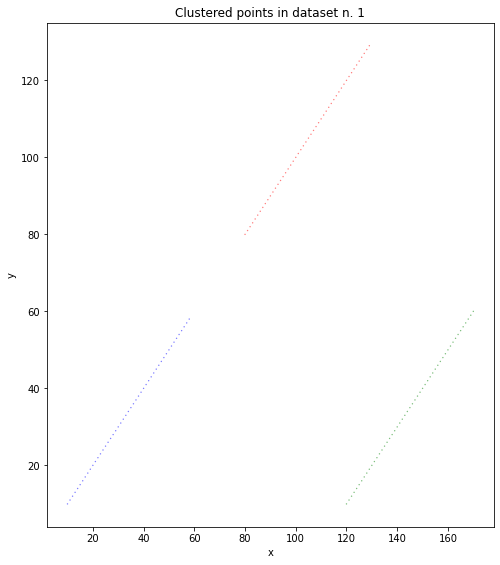

In [6]:
import matplotlib.pyplot as plt
import PyPDF2
from PyPDF2 import PdfFileMerger, PdfFileReader

fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Clustered points in dataset n. 1')

ax.set_xlabel('x')
ax.set_ylabel('y')

# set the list of colors to be selected when plotting the different clusters
color=['b','g','r','c','m','y','k','w']
    
#plot the dataset
for clu in range(k):
    # collect the sequence of cooordinates of the points in each given cluster (determined by clu)
    data_list_x = [data1[i,0] for i in range(n_samples1) if kmeans1.labels_[i]==clu]
    data_list_y = [data1[i,1] for i in range(n_samples1) if kmeans1.labels_[i]==clu]
    plt.scatter(data_list_x, data_list_y, s=2, edgecolors='none', c=color[clu], alpha=0.5)

plt.show()

In the following cell I propose you to perform clustering with K-means on dataset2.

In [7]:
np.random.seed(5)

k=3
kmeans2 = KMeans(n_clusters=k, random_state=0).fit(data2)

i=0
for i in range(n_samples2):
    print("Example n."+str(i)+"=("+str(data2[i,0])+","+str(data2[i,1])+")")
    print("in cluster n."+str(kmeans2.labels_[i]))

Example n.0=(5.0,482.0)
in cluster n.1
Example n.1=(5.0,481.0)
in cluster n.1
Example n.2=(5.0,480.0)
in cluster n.1
Example n.3=(5.0,479.0)
in cluster n.1
Example n.4=(5.0,478.0)
in cluster n.1
Example n.5=(5.0,477.0)
in cluster n.1
Example n.6=(5.0,476.0)
in cluster n.1
Example n.7=(5.0,475.0)
in cluster n.1
Example n.8=(5.0,474.0)
in cluster n.1
Example n.9=(5.0,473.0)
in cluster n.1
Example n.10=(5.0,472.0)
in cluster n.1
Example n.11=(5.0,471.0)
in cluster n.1
Example n.12=(5.0,470.0)
in cluster n.1
Example n.13=(5.0,469.0)
in cluster n.1
Example n.14=(5.0,468.0)
in cluster n.1
Example n.15=(5.0,467.0)
in cluster n.1
Example n.16=(5.0,466.0)
in cluster n.1
Example n.17=(5.0,465.0)
in cluster n.1
Example n.18=(5.0,464.0)
in cluster n.1
Example n.19=(5.0,463.0)
in cluster n.1
Example n.20=(5.0,462.0)
in cluster n.1
Example n.21=(5.0,461.0)
in cluster n.1
Example n.22=(5.0,460.0)
in cluster n.1
Example n.23=(6.0,482.0)
in cluster n.1
Example n.24=(6.0,481.0)
in cluster n.1
Example n.

in cluster n.1
Example n.815=(30.0,469.0)
in cluster n.1
Example n.816=(30.0,468.0)
in cluster n.1
Example n.817=(30.0,467.0)
in cluster n.1
Example n.818=(30.0,466.0)
in cluster n.1
Example n.819=(30.0,465.0)
in cluster n.1
Example n.820=(30.0,464.0)
in cluster n.1
Example n.821=(30.0,463.0)
in cluster n.1
Example n.822=(30.0,462.0)
in cluster n.1
Example n.823=(30.0,461.0)
in cluster n.1
Example n.824=(30.0,460.0)
in cluster n.1
Example n.825=(30.0,459.0)
in cluster n.1
Example n.826=(30.0,458.0)
in cluster n.1
Example n.827=(30.0,457.0)
in cluster n.1
Example n.828=(30.0,456.0)
in cluster n.1
Example n.829=(30.0,455.0)
in cluster n.1
Example n.830=(30.0,454.0)
in cluster n.1
Example n.831=(30.0,453.0)
in cluster n.1
Example n.832=(30.0,452.0)
in cluster n.1
Example n.833=(31.0,502.0)
in cluster n.1
Example n.834=(31.0,501.0)
in cluster n.1
Example n.835=(31.0,500.0)
in cluster n.1
Example n.836=(31.0,499.0)
in cluster n.1
Example n.837=(31.0,498.0)
in cluster n.1
Example n.838=(31.0

in cluster n.1
Example n.1434=(40.0,494.0)
in cluster n.1
Example n.1435=(40.0,493.0)
in cluster n.1
Example n.1436=(40.0,492.0)
in cluster n.1
Example n.1437=(40.0,491.0)
in cluster n.1
Example n.1438=(40.0,490.0)
in cluster n.1
Example n.1439=(40.0,489.0)
in cluster n.1
Example n.1440=(40.0,488.0)
in cluster n.1
Example n.1441=(40.0,487.0)
in cluster n.1
Example n.1442=(40.0,475.0)
in cluster n.1
Example n.1443=(40.0,474.0)
in cluster n.1
Example n.1444=(40.0,473.0)
in cluster n.1
Example n.1445=(40.0,472.0)
in cluster n.1
Example n.1446=(40.0,471.0)
in cluster n.1
Example n.1447=(40.0,470.0)
in cluster n.1
Example n.1448=(40.0,469.0)
in cluster n.1
Example n.1449=(40.0,468.0)
in cluster n.1
Example n.1450=(40.0,467.0)
in cluster n.1
Example n.1451=(40.0,466.0)
in cluster n.1
Example n.1452=(40.0,465.0)
in cluster n.1
Example n.1453=(40.0,464.0)
in cluster n.1
Example n.1454=(40.0,459.0)
in cluster n.1
Example n.1455=(40.0,458.0)
in cluster n.1
Example n.1456=(40.0,457.0)
in cluster 

in cluster n.0
Example n.1873=(45.0,398.0)
in cluster n.0
Example n.1874=(46.0,502.0)
in cluster n.1
Example n.1875=(46.0,501.0)
in cluster n.1
Example n.1876=(46.0,500.0)
in cluster n.1
Example n.1877=(46.0,499.0)
in cluster n.1
Example n.1878=(46.0,498.0)
in cluster n.1
Example n.1879=(46.0,497.0)
in cluster n.1
Example n.1880=(46.0,496.0)
in cluster n.1
Example n.1881=(46.0,495.0)
in cluster n.1
Example n.1882=(46.0,494.0)
in cluster n.1
Example n.1883=(46.0,493.0)
in cluster n.1
Example n.1884=(46.0,492.0)
in cluster n.1
Example n.1885=(46.0,491.0)
in cluster n.1
Example n.1886=(46.0,490.0)
in cluster n.1
Example n.1887=(46.0,489.0)
in cluster n.1
Example n.1888=(46.0,488.0)
in cluster n.1
Example n.1889=(46.0,487.0)
in cluster n.1
Example n.1890=(46.0,475.0)
in cluster n.1
Example n.1891=(46.0,474.0)
in cluster n.1
Example n.1892=(46.0,473.0)
in cluster n.1
Example n.1893=(46.0,472.0)
in cluster n.1
Example n.1894=(46.0,471.0)
in cluster n.1
Example n.1895=(46.0,470.0)
in cluster 

Example n.2564=(56.0,429.0)
in cluster n.0
Example n.2565=(56.0,428.0)
in cluster n.0
Example n.2566=(56.0,427.0)
in cluster n.0
Example n.2567=(56.0,426.0)
in cluster n.0
Example n.2568=(56.0,425.0)
in cluster n.0
Example n.2569=(56.0,405.0)
in cluster n.0
Example n.2570=(56.0,404.0)
in cluster n.0
Example n.2571=(56.0,403.0)
in cluster n.0
Example n.2572=(56.0,402.0)
in cluster n.0
Example n.2573=(56.0,401.0)
in cluster n.0
Example n.2574=(56.0,400.0)
in cluster n.0
Example n.2575=(56.0,399.0)
in cluster n.0
Example n.2576=(56.0,398.0)
in cluster n.0
Example n.2577=(56.0,397.0)
in cluster n.0
Example n.2578=(56.0,396.0)
in cluster n.0
Example n.2579=(56.0,395.0)
in cluster n.0
Example n.2580=(56.0,394.0)
in cluster n.0
Example n.2581=(57.0,498.0)
in cluster n.1
Example n.2582=(57.0,497.0)
in cluster n.1
Example n.2583=(57.0,496.0)
in cluster n.1
Example n.2584=(57.0,495.0)
in cluster n.1
Example n.2585=(57.0,494.0)
in cluster n.1
Example n.2586=(57.0,493.0)
in cluster n.1
Example n.2

in cluster n.0
Example n.3564=(69.0,439.0)
in cluster n.0
Example n.3565=(69.0,438.0)
in cluster n.0
Example n.3566=(69.0,437.0)
in cluster n.0
Example n.3567=(69.0,429.0)
in cluster n.0
Example n.3568=(69.0,428.0)
in cluster n.0
Example n.3569=(69.0,427.0)
in cluster n.0
Example n.3570=(69.0,426.0)
in cluster n.0
Example n.3571=(69.0,425.0)
in cluster n.0
Example n.3572=(69.0,424.0)
in cluster n.0
Example n.3573=(69.0,423.0)
in cluster n.0
Example n.3574=(69.0,422.0)
in cluster n.0
Example n.3575=(69.0,421.0)
in cluster n.0
Example n.3576=(69.0,420.0)
in cluster n.0
Example n.3577=(69.0,419.0)
in cluster n.0
Example n.3578=(69.0,418.0)
in cluster n.0
Example n.3579=(69.0,417.0)
in cluster n.0
Example n.3580=(69.0,409.0)
in cluster n.0
Example n.3581=(69.0,408.0)
in cluster n.0
Example n.3582=(69.0,407.0)
in cluster n.0
Example n.3583=(69.0,406.0)
in cluster n.0
Example n.3584=(69.0,405.0)
in cluster n.0
Example n.3585=(69.0,404.0)
in cluster n.0
Example n.3586=(69.0,403.0)
in cluster 

Example n.4460=(86.0,433.0)
in cluster n.0
Example n.4461=(86.0,425.0)
in cluster n.0
Example n.4462=(86.0,424.0)
in cluster n.0
Example n.4463=(86.0,423.0)
in cluster n.0
Example n.4464=(86.0,422.0)
in cluster n.0
Example n.4465=(86.0,421.0)
in cluster n.0
Example n.4466=(86.0,420.0)
in cluster n.0
Example n.4467=(86.0,419.0)
in cluster n.0
Example n.4468=(86.0,418.0)
in cluster n.0
Example n.4469=(86.0,417.0)
in cluster n.0
Example n.4470=(86.0,416.0)
in cluster n.0
Example n.4471=(86.0,415.0)
in cluster n.0
Example n.4472=(86.0,414.0)
in cluster n.0
Example n.4473=(86.0,413.0)
in cluster n.0
Example n.4474=(86.0,412.0)
in cluster n.0
Example n.4475=(86.0,411.0)
in cluster n.0
Example n.4476=(86.0,410.0)
in cluster n.0
Example n.4477=(86.0,409.0)
in cluster n.0
Example n.4478=(86.0,408.0)
in cluster n.0
Example n.4479=(86.0,407.0)
in cluster n.0
Example n.4480=(86.0,406.0)
in cluster n.0
Example n.4481=(86.0,405.0)
in cluster n.0
Example n.4482=(86.0,404.0)
in cluster n.0
Example n.4

Example n.5117=(102.0,477.0)
in cluster n.2
Example n.5118=(102.0,476.0)
in cluster n.2
Example n.5119=(102.0,475.0)
in cluster n.2
Example n.5120=(102.0,474.0)
in cluster n.2
Example n.5121=(102.0,473.0)
in cluster n.2
Example n.5122=(102.0,472.0)
in cluster n.2
Example n.5123=(102.0,471.0)
in cluster n.2
Example n.5124=(102.0,470.0)
in cluster n.2
Example n.5125=(102.0,469.0)
in cluster n.2
Example n.5126=(102.0,468.0)
in cluster n.2
Example n.5127=(102.0,444.0)
in cluster n.2
Example n.5128=(102.0,443.0)
in cluster n.2
Example n.5129=(102.0,442.0)
in cluster n.2
Example n.5130=(102.0,441.0)
in cluster n.2
Example n.5131=(102.0,440.0)
in cluster n.2
Example n.5132=(102.0,439.0)
in cluster n.2
Example n.5133=(102.0,438.0)
in cluster n.2
Example n.5134=(102.0,437.0)
in cluster n.2
Example n.5135=(102.0,436.0)
in cluster n.2
Example n.5136=(102.0,435.0)
in cluster n.2
Example n.5137=(102.0,434.0)
in cluster n.2
Example n.5138=(102.0,433.0)
in cluster n.2
Example n.5139=(102.0,432.0)
in 

in cluster n.2
Example n.5690=(120.0,438.0)
in cluster n.2
Example n.5691=(120.0,437.0)
in cluster n.2
Example n.5692=(120.0,436.0)
in cluster n.2
Example n.5693=(120.0,435.0)
in cluster n.2
Example n.5694=(120.0,434.0)
in cluster n.2
Example n.5695=(120.0,433.0)
in cluster n.2
Example n.5696=(120.0,432.0)
in cluster n.2
Example n.5697=(120.0,431.0)
in cluster n.2
Example n.5698=(120.0,430.0)
in cluster n.2
Example n.5699=(120.0,429.0)
in cluster n.2
Example n.5700=(120.0,428.0)
in cluster n.2
Example n.5701=(120.0,427.0)
in cluster n.2
Example n.5702=(120.0,426.0)
in cluster n.2
Example n.5703=(120.0,425.0)
in cluster n.2
Example n.5704=(120.0,424.0)
in cluster n.2
Example n.5705=(120.0,423.0)
in cluster n.2
Example n.5706=(120.0,422.0)
in cluster n.2
Example n.5707=(120.0,421.0)
in cluster n.2
Example n.5708=(121.0,471.0)
in cluster n.2
Example n.5709=(121.0,470.0)
in cluster n.2
Example n.5710=(121.0,469.0)
in cluster n.2
Example n.5711=(121.0,468.0)
in cluster n.2
Example n.5712=(1

In the following you have to plot clustering results on dataset2.

**Answer:** 
how do you explain what it happens?

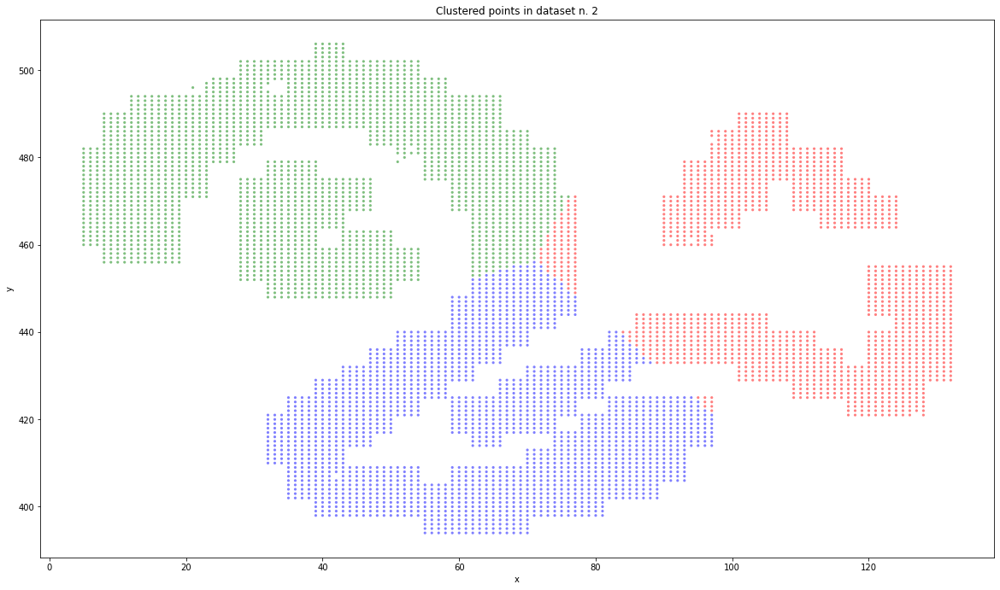

In [8]:
fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Clustered points in dataset n. 2')

ax.set_xlabel('x')
ax.set_ylabel('y')

# set the list of colors to be selected when plotting the different clusters
color=['b','g','r','c','m','y','k','w']
    
#plot the dataset
for clu in range(k):
    # collect the sequence of cooordinates of the points in each given cluster (determined by clu)
    data_list_x = [data2[i,0] for i in range(n_samples2) if kmeans2.labels_[i]==clu]
    data_list_y = [data2[i,1] for i in range(n_samples2) if kmeans2.labels_[i]==clu]
    plt.scatter(data_list_x, data_list_y, s=10, edgecolors='none', c=color[clu], alpha=0.5)

plt.show()

In the following cell I propose you to perform clustering with K-means on the dataset3.

In [9]:
np.random.seed(5)

k=4
kmeans3 = KMeans(n_clusters=k, random_state=0).fit(data3)

i=0
for i in range(n_samples3):
    print("Example n."+str(i)+"=("+str(data3[i,0])+","+str(data3[i,1])+")")
    print("in cluster n."+str(kmeans3.labels_[i]))

Example n.0=(9.0,480.0)
in cluster n.2
Example n.1=(9.0,479.0)
in cluster n.2
Example n.2=(9.0,478.0)
in cluster n.2
Example n.3=(9.0,477.0)
in cluster n.2
Example n.4=(9.0,467.0)
in cluster n.2
Example n.5=(9.0,466.0)
in cluster n.2
Example n.6=(9.0,465.0)
in cluster n.2
Example n.7=(9.0,464.0)
in cluster n.2
Example n.8=(9.0,392.0)
in cluster n.2
Example n.9=(9.0,391.0)
in cluster n.2
Example n.10=(9.0,390.0)
in cluster n.2
Example n.11=(9.0,350.0)
in cluster n.2
Example n.12=(9.0,349.0)
in cluster n.2
Example n.13=(9.0,348.0)
in cluster n.2
Example n.14=(9.0,347.0)
in cluster n.2
Example n.15=(9.0,290.0)
in cluster n.3
Example n.16=(9.0,289.0)
in cluster n.3
Example n.17=(9.0,288.0)
in cluster n.3
Example n.18=(9.0,287.0)
in cluster n.3
Example n.19=(9.0,240.0)
in cluster n.3
Example n.20=(9.0,239.0)
in cluster n.3
Example n.21=(9.0,238.0)
in cluster n.3
Example n.22=(9.0,231.0)
in cluster n.3
Example n.23=(9.0,230.0)
in cluster n.3
Example n.24=(9.0,229.0)
in cluster n.3
Example n.

in cluster n.3
Example n.938=(20.0,92.0)
in cluster n.3
Example n.939=(20.0,91.0)
in cluster n.3
Example n.940=(20.0,90.0)
in cluster n.3
Example n.941=(20.0,89.0)
in cluster n.3
Example n.942=(21.0,501.0)
in cluster n.2
Example n.943=(21.0,500.0)
in cluster n.2
Example n.944=(21.0,499.0)
in cluster n.2
Example n.945=(21.0,498.0)
in cluster n.2
Example n.946=(21.0,497.0)
in cluster n.2
Example n.947=(21.0,383.0)
in cluster n.2
Example n.948=(21.0,382.0)
in cluster n.2
Example n.949=(21.0,381.0)
in cluster n.2
Example n.950=(21.0,380.0)
in cluster n.2
Example n.951=(21.0,379.0)
in cluster n.2
Example n.952=(21.0,369.0)
in cluster n.2
Example n.953=(21.0,351.0)
in cluster n.2
Example n.954=(21.0,350.0)
in cluster n.2
Example n.955=(21.0,349.0)
in cluster n.2
Example n.956=(21.0,348.0)
in cluster n.2
Example n.957=(21.0,347.0)
in cluster n.2
Example n.958=(21.0,346.0)
in cluster n.2
Example n.959=(21.0,307.0)
in cluster n.2
Example n.960=(21.0,306.0)
in cluster n.2
Example n.961=(21.0,305

in cluster n.3
Example n.1688=(26.0,250.0)
in cluster n.3
Example n.1689=(26.0,249.0)
in cluster n.3
Example n.1690=(26.0,248.0)
in cluster n.3
Example n.1691=(26.0,247.0)
in cluster n.3
Example n.1692=(26.0,246.0)
in cluster n.3
Example n.1693=(26.0,245.0)
in cluster n.3
Example n.1694=(26.0,244.0)
in cluster n.3
Example n.1695=(26.0,243.0)
in cluster n.3
Example n.1696=(26.0,242.0)
in cluster n.3
Example n.1697=(26.0,241.0)
in cluster n.3
Example n.1698=(26.0,240.0)
in cluster n.3
Example n.1699=(26.0,239.0)
in cluster n.3
Example n.1700=(26.0,238.0)
in cluster n.3
Example n.1701=(26.0,237.0)
in cluster n.3
Example n.1702=(26.0,236.0)
in cluster n.3
Example n.1703=(26.0,234.0)
in cluster n.3
Example n.1704=(26.0,233.0)
in cluster n.3
Example n.1705=(26.0,232.0)
in cluster n.3
Example n.1706=(26.0,231.0)
in cluster n.3
Example n.1707=(26.0,230.0)
in cluster n.3
Example n.1708=(26.0,229.0)
in cluster n.3
Example n.1709=(26.0,228.0)
in cluster n.3
Example n.1710=(26.0,227.0)
in cluster 

Example n.2437=(31.0,280.0)
in cluster n.3
Example n.2438=(31.0,279.0)
in cluster n.3
Example n.2439=(31.0,278.0)
in cluster n.3
Example n.2440=(31.0,277.0)
in cluster n.3
Example n.2441=(31.0,276.0)
in cluster n.3
Example n.2442=(31.0,275.0)
in cluster n.3
Example n.2443=(31.0,271.0)
in cluster n.3
Example n.2444=(31.0,270.0)
in cluster n.3
Example n.2445=(31.0,269.0)
in cluster n.3
Example n.2446=(31.0,268.0)
in cluster n.3
Example n.2447=(31.0,267.0)
in cluster n.3
Example n.2448=(31.0,266.0)
in cluster n.3
Example n.2449=(31.0,265.0)
in cluster n.3
Example n.2450=(31.0,264.0)
in cluster n.3
Example n.2451=(31.0,263.0)
in cluster n.3
Example n.2452=(31.0,262.0)
in cluster n.3
Example n.2453=(31.0,261.0)
in cluster n.3
Example n.2454=(31.0,260.0)
in cluster n.3
Example n.2455=(31.0,259.0)
in cluster n.3
Example n.2456=(31.0,258.0)
in cluster n.3
Example n.2457=(31.0,257.0)
in cluster n.3
Example n.2458=(31.0,256.0)
in cluster n.3
Example n.2459=(31.0,255.0)
in cluster n.3
Example n.2

Example n.3437=(37.0,378.0)
in cluster n.2
Example n.3438=(37.0,377.0)
in cluster n.2
Example n.3439=(37.0,376.0)
in cluster n.2
Example n.3440=(37.0,312.0)
in cluster n.2
Example n.3441=(37.0,311.0)
in cluster n.2
Example n.3442=(37.0,310.0)
in cluster n.2
Example n.3443=(37.0,309.0)
in cluster n.2
Example n.3444=(37.0,308.0)
in cluster n.2
Example n.3445=(37.0,307.0)
in cluster n.2
Example n.3446=(37.0,306.0)
in cluster n.2
Example n.3447=(37.0,305.0)
in cluster n.2
Example n.3448=(37.0,304.0)
in cluster n.2
Example n.3449=(37.0,303.0)
in cluster n.2
Example n.3450=(37.0,302.0)
in cluster n.2
Example n.3451=(37.0,301.0)
in cluster n.3
Example n.3452=(37.0,300.0)
in cluster n.3
Example n.3453=(37.0,299.0)
in cluster n.3
Example n.3454=(37.0,298.0)
in cluster n.3
Example n.3455=(37.0,297.0)
in cluster n.3
Example n.3456=(37.0,293.0)
in cluster n.3
Example n.3457=(37.0,292.0)
in cluster n.3
Example n.3458=(37.0,291.0)
in cluster n.3
Example n.3459=(37.0,290.0)
in cluster n.3
Example n.3

in cluster n.3
Example n.3937=(39.0,130.0)
in cluster n.3
Example n.3938=(39.0,129.0)
in cluster n.3
Example n.3939=(39.0,128.0)
in cluster n.3
Example n.3940=(39.0,127.0)
in cluster n.3
Example n.3941=(39.0,126.0)
in cluster n.3
Example n.3942=(39.0,114.0)
in cluster n.3
Example n.3943=(39.0,113.0)
in cluster n.3
Example n.3944=(39.0,112.0)
in cluster n.3
Example n.3945=(39.0,111.0)
in cluster n.3
Example n.3946=(39.0,110.0)
in cluster n.3
Example n.3947=(39.0,109.0)
in cluster n.3
Example n.3948=(40.0,492.0)
in cluster n.2
Example n.3949=(40.0,491.0)
in cluster n.2
Example n.3950=(40.0,490.0)
in cluster n.2
Example n.3951=(40.0,489.0)
in cluster n.2
Example n.3952=(40.0,488.0)
in cluster n.2
Example n.3953=(40.0,487.0)
in cluster n.2
Example n.3954=(40.0,486.0)
in cluster n.2
Example n.3955=(40.0,485.0)
in cluster n.2
Example n.3956=(40.0,484.0)
in cluster n.2
Example n.3957=(40.0,483.0)
in cluster n.2
Example n.3958=(40.0,482.0)
in cluster n.2
Example n.3959=(40.0,481.0)
in cluster 

in cluster n.3
Example n.4937=(44.0,161.0)
in cluster n.3
Example n.4938=(44.0,160.0)
in cluster n.3
Example n.4939=(44.0,159.0)
in cluster n.3
Example n.4940=(44.0,158.0)
in cluster n.3
Example n.4941=(44.0,157.0)
in cluster n.3
Example n.4942=(44.0,156.0)
in cluster n.3
Example n.4943=(44.0,155.0)
in cluster n.3
Example n.4944=(44.0,154.0)
in cluster n.3
Example n.4945=(44.0,153.0)
in cluster n.3
Example n.4946=(44.0,152.0)
in cluster n.3
Example n.4947=(44.0,151.0)
in cluster n.3
Example n.4948=(44.0,150.0)
in cluster n.3
Example n.4949=(44.0,149.0)
in cluster n.3
Example n.4950=(44.0,148.0)
in cluster n.3
Example n.4951=(44.0,145.0)
in cluster n.3
Example n.4952=(44.0,144.0)
in cluster n.3
Example n.4953=(44.0,143.0)
in cluster n.3
Example n.4954=(44.0,142.0)
in cluster n.3
Example n.4955=(44.0,131.0)
in cluster n.3
Example n.4956=(44.0,130.0)
in cluster n.3
Example n.4957=(44.0,129.0)
in cluster n.3
Example n.4958=(44.0,128.0)
in cluster n.3
Example n.4959=(44.0,127.0)
in cluster 

Example n.5686=(48.0,249.0)
in cluster n.3
Example n.5687=(48.0,248.0)
in cluster n.3
Example n.5688=(48.0,247.0)
in cluster n.3
Example n.5689=(48.0,246.0)
in cluster n.3
Example n.5690=(48.0,245.0)
in cluster n.3
Example n.5691=(48.0,244.0)
in cluster n.3
Example n.5692=(48.0,243.0)
in cluster n.3
Example n.5693=(48.0,242.0)
in cluster n.3
Example n.5694=(48.0,241.0)
in cluster n.3
Example n.5695=(48.0,240.0)
in cluster n.3
Example n.5696=(48.0,239.0)
in cluster n.3
Example n.5697=(48.0,238.0)
in cluster n.3
Example n.5698=(48.0,237.0)
in cluster n.3
Example n.5699=(48.0,236.0)
in cluster n.3
Example n.5700=(48.0,229.0)
in cluster n.3
Example n.5701=(48.0,228.0)
in cluster n.3
Example n.5702=(48.0,227.0)
in cluster n.3
Example n.5703=(48.0,226.0)
in cluster n.3
Example n.5704=(48.0,225.0)
in cluster n.3
Example n.5705=(48.0,224.0)
in cluster n.3
Example n.5706=(48.0,223.0)
in cluster n.3
Example n.5707=(48.0,219.0)
in cluster n.3
Example n.5708=(48.0,218.0)
in cluster n.3
Example n.5

Example n.6686=(53.0,243.0)
in cluster n.3
Example n.6687=(53.0,242.0)
in cluster n.3
Example n.6688=(53.0,241.0)
in cluster n.3
Example n.6689=(53.0,240.0)
in cluster n.3
Example n.6690=(53.0,239.0)
in cluster n.3
Example n.6691=(53.0,238.0)
in cluster n.3
Example n.6692=(53.0,237.0)
in cluster n.3
Example n.6693=(53.0,236.0)
in cluster n.3
Example n.6694=(53.0,235.0)
in cluster n.3
Example n.6695=(53.0,234.0)
in cluster n.3
Example n.6696=(53.0,233.0)
in cluster n.3
Example n.6697=(53.0,232.0)
in cluster n.3
Example n.6698=(53.0,231.0)
in cluster n.3
Example n.6699=(53.0,230.0)
in cluster n.3
Example n.6700=(53.0,229.0)
in cluster n.3
Example n.6701=(53.0,228.0)
in cluster n.3
Example n.6702=(53.0,227.0)
in cluster n.3
Example n.6703=(53.0,226.0)
in cluster n.3
Example n.6704=(53.0,225.0)
in cluster n.3
Example n.6705=(53.0,224.0)
in cluster n.3
Example n.6706=(53.0,213.0)
in cluster n.3
Example n.6707=(53.0,212.0)
in cluster n.3
Example n.6708=(53.0,211.0)
in cluster n.3
Example n.6

in cluster n.3
Example n.7627=(57.0,255.0)
in cluster n.3
Example n.7628=(57.0,253.0)
in cluster n.3
Example n.7629=(57.0,252.0)
in cluster n.3
Example n.7630=(57.0,251.0)
in cluster n.3
Example n.7631=(57.0,250.0)
in cluster n.3
Example n.7632=(57.0,249.0)
in cluster n.3
Example n.7633=(57.0,241.0)
in cluster n.3
Example n.7634=(57.0,240.0)
in cluster n.3
Example n.7635=(57.0,239.0)
in cluster n.3
Example n.7636=(57.0,238.0)
in cluster n.3
Example n.7637=(57.0,237.0)
in cluster n.3
Example n.7638=(57.0,236.0)
in cluster n.3
Example n.7639=(57.0,235.0)
in cluster n.3
Example n.7640=(57.0,234.0)
in cluster n.3
Example n.7641=(57.0,233.0)
in cluster n.3
Example n.7642=(57.0,231.0)
in cluster n.3
Example n.7643=(57.0,230.0)
in cluster n.3
Example n.7644=(57.0,229.0)
in cluster n.3
Example n.7645=(57.0,228.0)
in cluster n.3
Example n.7646=(57.0,227.0)
in cluster n.3
Example n.7647=(57.0,220.0)
in cluster n.3
Example n.7648=(57.0,219.0)
in cluster n.3
Example n.7649=(57.0,218.0)
in cluster 

in cluster n.3
Example n.7936=(58.0,142.0)
in cluster n.3
Example n.7937=(58.0,141.0)
in cluster n.3
Example n.7938=(58.0,140.0)
in cluster n.3
Example n.7939=(58.0,139.0)
in cluster n.3
Example n.7940=(58.0,138.0)
in cluster n.3
Example n.7941=(58.0,132.0)
in cluster n.3
Example n.7942=(58.0,131.0)
in cluster n.3
Example n.7943=(58.0,130.0)
in cluster n.3
Example n.7944=(58.0,129.0)
in cluster n.3
Example n.7945=(58.0,128.0)
in cluster n.3
Example n.7946=(58.0,127.0)
in cluster n.3
Example n.7947=(58.0,126.0)
in cluster n.3
Example n.7948=(58.0,125.0)
in cluster n.3
Example n.7949=(58.0,124.0)
in cluster n.3
Example n.7950=(59.0,498.0)
in cluster n.2
Example n.7951=(59.0,497.0)
in cluster n.2
Example n.7952=(59.0,496.0)
in cluster n.2
Example n.7953=(59.0,495.0)
in cluster n.2
Example n.7954=(59.0,494.0)
in cluster n.2
Example n.7955=(59.0,493.0)
in cluster n.2
Example n.7956=(59.0,492.0)
in cluster n.2
Example n.7957=(59.0,491.0)
in cluster n.2
Example n.7958=(59.0,490.0)
in cluster 

Example n.8935=(63.0,270.0)
in cluster n.3
Example n.8936=(63.0,269.0)
in cluster n.3
Example n.8937=(63.0,268.0)
in cluster n.3
Example n.8938=(63.0,264.0)
in cluster n.3
Example n.8939=(63.0,263.0)
in cluster n.3
Example n.8940=(63.0,262.0)
in cluster n.3
Example n.8941=(63.0,261.0)
in cluster n.3
Example n.8942=(63.0,260.0)
in cluster n.3
Example n.8943=(63.0,259.0)
in cluster n.3
Example n.8944=(63.0,258.0)
in cluster n.3
Example n.8945=(63.0,257.0)
in cluster n.3
Example n.8946=(63.0,256.0)
in cluster n.3
Example n.8947=(63.0,255.0)
in cluster n.3
Example n.8948=(63.0,254.0)
in cluster n.3
Example n.8949=(63.0,252.0)
in cluster n.3
Example n.8950=(63.0,251.0)
in cluster n.3
Example n.8951=(63.0,250.0)
in cluster n.3
Example n.8952=(63.0,249.0)
in cluster n.3
Example n.8953=(63.0,248.0)
in cluster n.3
Example n.8954=(63.0,247.0)
in cluster n.3
Example n.8955=(63.0,245.0)
in cluster n.3
Example n.8956=(63.0,244.0)
in cluster n.3
Example n.8957=(63.0,243.0)
in cluster n.3
Example n.8

Example n.9685=(66.0,207.0)
in cluster n.3
Example n.9686=(66.0,206.0)
in cluster n.3
Example n.9687=(66.0,205.0)
in cluster n.3
Example n.9688=(66.0,204.0)
in cluster n.3
Example n.9689=(66.0,203.0)
in cluster n.3
Example n.9690=(66.0,202.0)
in cluster n.3
Example n.9691=(66.0,201.0)
in cluster n.3
Example n.9692=(66.0,193.0)
in cluster n.3
Example n.9693=(66.0,192.0)
in cluster n.3
Example n.9694=(66.0,191.0)
in cluster n.3
Example n.9695=(66.0,190.0)
in cluster n.3
Example n.9696=(66.0,189.0)
in cluster n.3
Example n.9697=(66.0,185.0)
in cluster n.3
Example n.9698=(66.0,184.0)
in cluster n.3
Example n.9699=(66.0,183.0)
in cluster n.3
Example n.9700=(66.0,182.0)
in cluster n.3
Example n.9701=(66.0,181.0)
in cluster n.3
Example n.9702=(66.0,180.0)
in cluster n.3
Example n.9703=(66.0,179.0)
in cluster n.3
Example n.9704=(66.0,173.0)
in cluster n.3
Example n.9705=(66.0,172.0)
in cluster n.3
Example n.9706=(66.0,171.0)
in cluster n.3
Example n.9707=(66.0,170.0)
in cluster n.3
Example n.9

in cluster n.3
Example n.10435=(69.0,121.0)
in cluster n.3
Example n.10436=(69.0,120.0)
in cluster n.3
Example n.10437=(69.0,119.0)
in cluster n.3
Example n.10438=(69.0,118.0)
in cluster n.3
Example n.10439=(69.0,103.0)
in cluster n.3
Example n.10440=(69.0,102.0)
in cluster n.3
Example n.10441=(69.0,101.0)
in cluster n.3
Example n.10442=(69.0,100.0)
in cluster n.3
Example n.10443=(69.0,99.0)
in cluster n.3
Example n.10444=(69.0,91.0)
in cluster n.3
Example n.10445=(69.0,90.0)
in cluster n.3
Example n.10446=(69.0,89.0)
in cluster n.3
Example n.10447=(70.0,501.0)
in cluster n.2
Example n.10448=(70.0,500.0)
in cluster n.2
Example n.10449=(70.0,499.0)
in cluster n.2
Example n.10450=(70.0,498.0)
in cluster n.2
Example n.10451=(70.0,497.0)
in cluster n.2
Example n.10452=(70.0,496.0)
in cluster n.2
Example n.10453=(70.0,495.0)
in cluster n.2
Example n.10454=(70.0,494.0)
in cluster n.2
Example n.10455=(70.0,493.0)
in cluster n.2
Example n.10456=(70.0,492.0)
in cluster n.2
Example n.10457=(70.0

Example n.11405=(74.0,421.0)
in cluster n.2
Example n.11406=(74.0,420.0)
in cluster n.2
Example n.11407=(74.0,391.0)
in cluster n.2
Example n.11408=(74.0,390.0)
in cluster n.2
Example n.11409=(74.0,389.0)
in cluster n.2
Example n.11410=(74.0,358.0)
in cluster n.2
Example n.11411=(74.0,357.0)
in cluster n.2
Example n.11412=(74.0,353.0)
in cluster n.2
Example n.11413=(74.0,352.0)
in cluster n.2
Example n.11414=(74.0,351.0)
in cluster n.2
Example n.11415=(74.0,350.0)
in cluster n.2
Example n.11416=(74.0,349.0)
in cluster n.2
Example n.11417=(74.0,348.0)
in cluster n.2
Example n.11418=(74.0,347.0)
in cluster n.2
Example n.11419=(74.0,346.0)
in cluster n.2
Example n.11420=(74.0,345.0)
in cluster n.2
Example n.11421=(74.0,344.0)
in cluster n.2
Example n.11422=(74.0,343.0)
in cluster n.2
Example n.11423=(74.0,342.0)
in cluster n.2
Example n.11424=(74.0,341.0)
in cluster n.2
Example n.11425=(74.0,337.0)
in cluster n.2
Example n.11426=(74.0,336.0)
in cluster n.2
Example n.11427=(74.0,335.0)
in 

Example n.12184=(77.0,350.0)
in cluster n.2
Example n.12185=(77.0,349.0)
in cluster n.2
Example n.12186=(77.0,348.0)
in cluster n.2
Example n.12187=(77.0,347.0)
in cluster n.2
Example n.12188=(77.0,346.0)
in cluster n.2
Example n.12189=(77.0,345.0)
in cluster n.2
Example n.12190=(77.0,344.0)
in cluster n.2
Example n.12191=(77.0,343.0)
in cluster n.2
Example n.12192=(77.0,342.0)
in cluster n.2
Example n.12193=(77.0,341.0)
in cluster n.2
Example n.12194=(77.0,340.0)
in cluster n.2
Example n.12195=(77.0,339.0)
in cluster n.2
Example n.12196=(77.0,338.0)
in cluster n.2
Example n.12197=(77.0,337.0)
in cluster n.2
Example n.12198=(77.0,309.0)
in cluster n.2
Example n.12199=(77.0,308.0)
in cluster n.2
Example n.12200=(77.0,307.0)
in cluster n.2
Example n.12201=(77.0,306.0)
in cluster n.2
Example n.12202=(77.0,305.0)
in cluster n.2
Example n.12203=(77.0,304.0)
in cluster n.2
Example n.12204=(77.0,303.0)
in cluster n.2
Example n.12205=(77.0,302.0)
in cluster n.2
Example n.12206=(77.0,298.0)
in 

Example n.13180=(81.0,344.0)
in cluster n.2
Example n.13181=(81.0,343.0)
in cluster n.2
Example n.13182=(81.0,342.0)
in cluster n.2
Example n.13183=(81.0,341.0)
in cluster n.2
Example n.13184=(81.0,340.0)
in cluster n.2
Example n.13185=(81.0,339.0)
in cluster n.2
Example n.13186=(81.0,338.0)
in cluster n.2
Example n.13187=(81.0,337.0)
in cluster n.2
Example n.13188=(81.0,336.0)
in cluster n.2
Example n.13189=(81.0,335.0)
in cluster n.2
Example n.13190=(81.0,334.0)
in cluster n.2
Example n.13191=(81.0,333.0)
in cluster n.2
Example n.13192=(81.0,332.0)
in cluster n.2
Example n.13193=(81.0,331.0)
in cluster n.2
Example n.13194=(81.0,330.0)
in cluster n.2
Example n.13195=(81.0,329.0)
in cluster n.2
Example n.13196=(81.0,328.0)
in cluster n.2
Example n.13197=(81.0,327.0)
in cluster n.2
Example n.13198=(81.0,326.0)
in cluster n.2
Example n.13199=(81.0,325.0)
in cluster n.2
Example n.13200=(81.0,324.0)
in cluster n.2
Example n.13201=(81.0,323.0)
in cluster n.2
Example n.13202=(81.0,322.0)
in 

in cluster n.2
Example n.13755=(83.0,316.0)
in cluster n.2
Example n.13756=(83.0,315.0)
in cluster n.2
Example n.13757=(83.0,314.0)
in cluster n.2
Example n.13758=(83.0,313.0)
in cluster n.2
Example n.13759=(83.0,312.0)
in cluster n.2
Example n.13760=(83.0,311.0)
in cluster n.2
Example n.13761=(83.0,310.0)
in cluster n.2
Example n.13762=(83.0,309.0)
in cluster n.2
Example n.13763=(83.0,308.0)
in cluster n.2
Example n.13764=(83.0,307.0)
in cluster n.2
Example n.13765=(83.0,306.0)
in cluster n.2
Example n.13766=(83.0,305.0)
in cluster n.2
Example n.13767=(83.0,304.0)
in cluster n.2
Example n.13768=(83.0,303.0)
in cluster n.2
Example n.13769=(83.0,302.0)
in cluster n.2
Example n.13770=(83.0,301.0)
in cluster n.2
Example n.13771=(83.0,300.0)
in cluster n.3
Example n.13772=(83.0,299.0)
in cluster n.3
Example n.13773=(83.0,298.0)
in cluster n.3
Example n.13774=(83.0,297.0)
in cluster n.3
Example n.13775=(83.0,296.0)
in cluster n.3
Example n.13776=(83.0,295.0)
in cluster n.3
Example n.13777=(

in cluster n.3
Example n.14684=(86.0,195.0)
in cluster n.3
Example n.14685=(86.0,194.0)
in cluster n.3
Example n.14686=(86.0,193.0)
in cluster n.3
Example n.14687=(86.0,192.0)
in cluster n.3
Example n.14688=(86.0,191.0)
in cluster n.3
Example n.14689=(86.0,190.0)
in cluster n.3
Example n.14690=(86.0,189.0)
in cluster n.3
Example n.14691=(86.0,188.0)
in cluster n.3
Example n.14692=(86.0,187.0)
in cluster n.3
Example n.14693=(86.0,186.0)
in cluster n.3
Example n.14694=(86.0,185.0)
in cluster n.3
Example n.14695=(86.0,179.0)
in cluster n.3
Example n.14696=(86.0,178.0)
in cluster n.3
Example n.14697=(86.0,177.0)
in cluster n.3
Example n.14698=(86.0,176.0)
in cluster n.3
Example n.14699=(86.0,175.0)
in cluster n.3
Example n.14700=(86.0,168.0)
in cluster n.3
Example n.14701=(86.0,167.0)
in cluster n.3
Example n.14702=(86.0,166.0)
in cluster n.3
Example n.14703=(86.0,165.0)
in cluster n.3
Example n.14704=(86.0,164.0)
in cluster n.3
Example n.14705=(86.0,163.0)
in cluster n.3
Example n.14706=(

Example n.15433=(89.0,268.0)
in cluster n.3
Example n.15434=(89.0,267.0)
in cluster n.3
Example n.15435=(89.0,266.0)
in cluster n.3
Example n.15436=(89.0,265.0)
in cluster n.3
Example n.15437=(89.0,264.0)
in cluster n.3
Example n.15438=(89.0,263.0)
in cluster n.3
Example n.15439=(89.0,262.0)
in cluster n.3
Example n.15440=(89.0,260.0)
in cluster n.3
Example n.15441=(89.0,259.0)
in cluster n.3
Example n.15442=(89.0,258.0)
in cluster n.3
Example n.15443=(89.0,257.0)
in cluster n.3
Example n.15444=(89.0,256.0)
in cluster n.3
Example n.15445=(89.0,255.0)
in cluster n.3
Example n.15446=(89.0,254.0)
in cluster n.3
Example n.15447=(89.0,253.0)
in cluster n.3
Example n.15448=(89.0,252.0)
in cluster n.3
Example n.15449=(89.0,251.0)
in cluster n.3
Example n.15450=(89.0,250.0)
in cluster n.3
Example n.15451=(89.0,245.0)
in cluster n.3
Example n.15452=(89.0,244.0)
in cluster n.3
Example n.15453=(89.0,243.0)
in cluster n.3
Example n.15454=(89.0,242.0)
in cluster n.3
Example n.15455=(89.0,241.0)
in 

Example n.16183=(92.0,178.0)
in cluster n.3
Example n.16184=(92.0,177.0)
in cluster n.3
Example n.16185=(92.0,176.0)
in cluster n.3
Example n.16186=(92.0,175.0)
in cluster n.3
Example n.16187=(92.0,174.0)
in cluster n.3
Example n.16188=(92.0,173.0)
in cluster n.3
Example n.16189=(92.0,172.0)
in cluster n.3
Example n.16190=(92.0,171.0)
in cluster n.3
Example n.16191=(92.0,170.0)
in cluster n.3
Example n.16192=(92.0,163.0)
in cluster n.3
Example n.16193=(92.0,162.0)
in cluster n.3
Example n.16194=(92.0,161.0)
in cluster n.3
Example n.16195=(92.0,160.0)
in cluster n.3
Example n.16196=(92.0,159.0)
in cluster n.3
Example n.16197=(92.0,158.0)
in cluster n.3
Example n.16198=(92.0,157.0)
in cluster n.3
Example n.16199=(92.0,156.0)
in cluster n.3
Example n.16200=(92.0,155.0)
in cluster n.3
Example n.16201=(92.0,154.0)
in cluster n.3
Example n.16202=(92.0,153.0)
in cluster n.3
Example n.16203=(92.0,151.0)
in cluster n.3
Example n.16204=(92.0,150.0)
in cluster n.3
Example n.16205=(92.0,149.0)
in 

Example n.17056=(96.0,465.0)
in cluster n.2
Example n.17057=(96.0,464.0)
in cluster n.2
Example n.17058=(96.0,463.0)
in cluster n.2
Example n.17059=(96.0,462.0)
in cluster n.2
Example n.17060=(96.0,461.0)
in cluster n.2
Example n.17061=(96.0,460.0)
in cluster n.2
Example n.17062=(96.0,459.0)
in cluster n.2
Example n.17063=(96.0,458.0)
in cluster n.2
Example n.17064=(96.0,457.0)
in cluster n.2
Example n.17065=(96.0,456.0)
in cluster n.2
Example n.17066=(96.0,455.0)
in cluster n.2
Example n.17067=(96.0,454.0)
in cluster n.2
Example n.17068=(96.0,453.0)
in cluster n.2
Example n.17069=(96.0,452.0)
in cluster n.2
Example n.17070=(96.0,451.0)
in cluster n.2
Example n.17071=(96.0,450.0)
in cluster n.2
Example n.17072=(96.0,449.0)
in cluster n.2
Example n.17073=(96.0,448.0)
in cluster n.2
Example n.17074=(96.0,447.0)
in cluster n.2
Example n.17075=(96.0,446.0)
in cluster n.2
Example n.17076=(96.0,445.0)
in cluster n.2
Example n.17077=(96.0,444.0)
in cluster n.2
Example n.17078=(96.0,443.0)
in 

Example n.17633=(98.0,447.0)
in cluster n.2
Example n.17634=(98.0,446.0)
in cluster n.2
Example n.17635=(98.0,445.0)
in cluster n.2
Example n.17636=(98.0,444.0)
in cluster n.2
Example n.17637=(98.0,443.0)
in cluster n.2
Example n.17638=(98.0,442.0)
in cluster n.2
Example n.17639=(98.0,441.0)
in cluster n.2
Example n.17640=(98.0,440.0)
in cluster n.2
Example n.17641=(98.0,439.0)
in cluster n.2
Example n.17642=(98.0,438.0)
in cluster n.2
Example n.17643=(98.0,437.0)
in cluster n.2
Example n.17644=(98.0,368.0)
in cluster n.2
Example n.17645=(98.0,367.0)
in cluster n.2
Example n.17646=(98.0,366.0)
in cluster n.2
Example n.17647=(98.0,365.0)
in cluster n.2
Example n.17648=(98.0,364.0)
in cluster n.2
Example n.17649=(98.0,363.0)
in cluster n.2
Example n.17650=(98.0,362.0)
in cluster n.2
Example n.17651=(98.0,361.0)
in cluster n.2
Example n.17652=(98.0,360.0)
in cluster n.2
Example n.17653=(98.0,359.0)
in cluster n.2
Example n.17654=(98.0,358.0)
in cluster n.2
Example n.17655=(98.0,357.0)
in 

Example n.18432=(101.0,474.0)
in cluster n.2
Example n.18433=(101.0,473.0)
in cluster n.2
Example n.18434=(101.0,472.0)
in cluster n.2
Example n.18435=(101.0,471.0)
in cluster n.2
Example n.18436=(101.0,470.0)
in cluster n.2
Example n.18437=(101.0,469.0)
in cluster n.2
Example n.18438=(101.0,468.0)
in cluster n.2
Example n.18439=(101.0,467.0)
in cluster n.2
Example n.18440=(101.0,466.0)
in cluster n.2
Example n.18441=(101.0,465.0)
in cluster n.2
Example n.18442=(101.0,464.0)
in cluster n.2
Example n.18443=(101.0,463.0)
in cluster n.2
Example n.18444=(101.0,462.0)
in cluster n.2
Example n.18445=(101.0,461.0)
in cluster n.2
Example n.18446=(101.0,460.0)
in cluster n.2
Example n.18447=(101.0,459.0)
in cluster n.2
Example n.18448=(101.0,458.0)
in cluster n.2
Example n.18449=(101.0,457.0)
in cluster n.2
Example n.18450=(101.0,456.0)
in cluster n.2
Example n.18451=(101.0,455.0)
in cluster n.2
Example n.18452=(101.0,454.0)
in cluster n.2
Example n.18453=(101.0,453.0)
in cluster n.2
Example n.

Example n.19182=(104.0,469.0)
in cluster n.2
Example n.19183=(104.0,468.0)
in cluster n.2
Example n.19184=(104.0,467.0)
in cluster n.2
Example n.19185=(104.0,466.0)
in cluster n.2
Example n.19186=(104.0,465.0)
in cluster n.2
Example n.19187=(104.0,464.0)
in cluster n.2
Example n.19188=(104.0,463.0)
in cluster n.2
Example n.19189=(104.0,462.0)
in cluster n.2
Example n.19190=(104.0,461.0)
in cluster n.2
Example n.19191=(104.0,460.0)
in cluster n.2
Example n.19192=(104.0,459.0)
in cluster n.2
Example n.19193=(104.0,458.0)
in cluster n.2
Example n.19194=(104.0,457.0)
in cluster n.2
Example n.19195=(104.0,456.0)
in cluster n.2
Example n.19196=(104.0,455.0)
in cluster n.2
Example n.19197=(104.0,454.0)
in cluster n.2
Example n.19198=(104.0,453.0)
in cluster n.2
Example n.19199=(104.0,452.0)
in cluster n.2
Example n.19200=(104.0,451.0)
in cluster n.2
Example n.19201=(104.0,450.0)
in cluster n.2
Example n.19202=(104.0,449.0)
in cluster n.2
Example n.19203=(104.0,448.0)
in cluster n.2
Example n.

in cluster n.2
Example n.19932=(107.0,464.0)
in cluster n.2
Example n.19933=(107.0,463.0)
in cluster n.2
Example n.19934=(107.0,462.0)
in cluster n.2
Example n.19935=(107.0,461.0)
in cluster n.2
Example n.19936=(107.0,460.0)
in cluster n.2
Example n.19937=(107.0,459.0)
in cluster n.2
Example n.19938=(107.0,458.0)
in cluster n.2
Example n.19939=(107.0,457.0)
in cluster n.2
Example n.19940=(107.0,456.0)
in cluster n.2
Example n.19941=(107.0,455.0)
in cluster n.2
Example n.19942=(107.0,454.0)
in cluster n.2
Example n.19943=(107.0,453.0)
in cluster n.2
Example n.19944=(107.0,452.0)
in cluster n.2
Example n.19945=(107.0,451.0)
in cluster n.2
Example n.19946=(107.0,450.0)
in cluster n.2
Example n.19947=(107.0,449.0)
in cluster n.2
Example n.19948=(107.0,448.0)
in cluster n.2
Example n.19949=(107.0,447.0)
in cluster n.2
Example n.19950=(107.0,446.0)
in cluster n.2
Example n.19951=(107.0,445.0)
in cluster n.2
Example n.19952=(107.0,444.0)
in cluster n.2
Example n.19953=(107.0,443.0)
in cluster

Example n.20831=(110.0,293.0)
in cluster n.3
Example n.20832=(110.0,292.0)
in cluster n.3
Example n.20833=(110.0,291.0)
in cluster n.3
Example n.20834=(110.0,288.0)
in cluster n.3
Example n.20835=(110.0,287.0)
in cluster n.3
Example n.20836=(110.0,286.0)
in cluster n.3
Example n.20837=(110.0,285.0)
in cluster n.3
Example n.20838=(110.0,284.0)
in cluster n.3
Example n.20839=(110.0,283.0)
in cluster n.3
Example n.20840=(110.0,282.0)
in cluster n.3
Example n.20841=(110.0,281.0)
in cluster n.3
Example n.20842=(110.0,280.0)
in cluster n.3
Example n.20843=(110.0,279.0)
in cluster n.3
Example n.20844=(110.0,278.0)
in cluster n.3
Example n.20845=(110.0,277.0)
in cluster n.3
Example n.20846=(110.0,276.0)
in cluster n.3
Example n.20847=(110.0,275.0)
in cluster n.3
Example n.20848=(110.0,274.0)
in cluster n.3
Example n.20849=(110.0,257.0)
in cluster n.3
Example n.20850=(110.0,256.0)
in cluster n.3
Example n.20851=(110.0,255.0)
in cluster n.3
Example n.20852=(110.0,254.0)
in cluster n.3
Example n.

in cluster n.2
Example n.21680=(113.0,312.0)
in cluster n.2
Example n.21681=(113.0,311.0)
in cluster n.2
Example n.21682=(113.0,310.0)
in cluster n.2
Example n.21683=(113.0,309.0)
in cluster n.2
Example n.21684=(113.0,308.0)
in cluster n.2
Example n.21685=(113.0,307.0)
in cluster n.2
Example n.21686=(113.0,306.0)
in cluster n.2
Example n.21687=(113.0,305.0)
in cluster n.2
Example n.21688=(113.0,304.0)
in cluster n.2
Example n.21689=(113.0,303.0)
in cluster n.2
Example n.21690=(113.0,302.0)
in cluster n.2
Example n.21691=(113.0,301.0)
in cluster n.2
Example n.21692=(113.0,300.0)
in cluster n.2
Example n.21693=(113.0,299.0)
in cluster n.3
Example n.21694=(113.0,298.0)
in cluster n.3
Example n.21695=(113.0,297.0)
in cluster n.3
Example n.21696=(113.0,296.0)
in cluster n.3
Example n.21697=(113.0,295.0)
in cluster n.3
Example n.21698=(113.0,294.0)
in cluster n.3
Example n.21699=(113.0,289.0)
in cluster n.3
Example n.21700=(113.0,288.0)
in cluster n.3
Example n.21701=(113.0,287.0)
in cluster

Example n.22200=(115.0,363.0)
in cluster n.2
Example n.22201=(115.0,362.0)
in cluster n.2
Example n.22202=(115.0,361.0)
in cluster n.2
Example n.22203=(115.0,360.0)
in cluster n.2
Example n.22204=(115.0,359.0)
in cluster n.2
Example n.22205=(115.0,358.0)
in cluster n.2
Example n.22206=(115.0,353.0)
in cluster n.2
Example n.22207=(115.0,352.0)
in cluster n.2
Example n.22208=(115.0,351.0)
in cluster n.2
Example n.22209=(115.0,350.0)
in cluster n.2
Example n.22210=(115.0,349.0)
in cluster n.2
Example n.22211=(115.0,344.0)
in cluster n.2
Example n.22212=(115.0,343.0)
in cluster n.2
Example n.22213=(115.0,342.0)
in cluster n.2
Example n.22214=(115.0,341.0)
in cluster n.2
Example n.22215=(115.0,340.0)
in cluster n.2
Example n.22216=(115.0,339.0)
in cluster n.2
Example n.22217=(115.0,338.0)
in cluster n.2
Example n.22218=(115.0,335.0)
in cluster n.2
Example n.22219=(115.0,334.0)
in cluster n.2
Example n.22220=(115.0,333.0)
in cluster n.2
Example n.22221=(115.0,332.0)
in cluster n.2
Example n.

Example n.22882=(117.0,102.0)
in cluster n.3
Example n.22883=(117.0,101.0)
in cluster n.3
Example n.22884=(117.0,100.0)
in cluster n.3
Example n.22885=(117.0,99.0)
in cluster n.3
Example n.22886=(117.0,98.0)
in cluster n.3
Example n.22887=(117.0,97.0)
in cluster n.3
Example n.22888=(117.0,96.0)
in cluster n.3
Example n.22889=(117.0,95.0)
in cluster n.3
Example n.22890=(117.0,94.0)
in cluster n.3
Example n.22891=(117.0,93.0)
in cluster n.3
Example n.22892=(117.0,92.0)
in cluster n.3
Example n.22893=(117.0,91.0)
in cluster n.3
Example n.22894=(117.0,90.0)
in cluster n.3
Example n.22895=(118.0,505.0)
in cluster n.2
Example n.22896=(118.0,504.0)
in cluster n.2
Example n.22897=(118.0,503.0)
in cluster n.2
Example n.22898=(118.0,502.0)
in cluster n.2
Example n.22899=(118.0,501.0)
in cluster n.2
Example n.22900=(118.0,500.0)
in cluster n.2
Example n.22901=(118.0,499.0)
in cluster n.2
Example n.22902=(118.0,498.0)
in cluster n.2
Example n.22903=(118.0,497.0)
in cluster n.2
Example n.22904=(118

in cluster n.3
Example n.23666=(120.0,114.0)
in cluster n.3
Example n.23667=(120.0,113.0)
in cluster n.3
Example n.23668=(120.0,112.0)
in cluster n.3
Example n.23669=(120.0,110.0)
in cluster n.3
Example n.23670=(120.0,109.0)
in cluster n.3
Example n.23671=(120.0,108.0)
in cluster n.3
Example n.23672=(120.0,107.0)
in cluster n.3
Example n.23673=(120.0,106.0)
in cluster n.3
Example n.23674=(120.0,105.0)
in cluster n.3
Example n.23675=(120.0,104.0)
in cluster n.3
Example n.23676=(120.0,102.0)
in cluster n.3
Example n.23677=(120.0,101.0)
in cluster n.3
Example n.23678=(120.0,100.0)
in cluster n.3
Example n.23679=(120.0,99.0)
in cluster n.3
Example n.23680=(121.0,505.0)
in cluster n.2
Example n.23681=(121.0,504.0)
in cluster n.2
Example n.23682=(121.0,503.0)
in cluster n.2
Example n.23683=(121.0,502.0)
in cluster n.2
Example n.23684=(121.0,501.0)
in cluster n.2
Example n.23685=(121.0,500.0)
in cluster n.2
Example n.23686=(121.0,499.0)
in cluster n.2
Example n.23687=(121.0,498.0)
in cluster 

Example n.24430=(123.0,152.0)
in cluster n.3
Example n.24431=(123.0,150.0)
in cluster n.3
Example n.24432=(123.0,149.0)
in cluster n.3
Example n.24433=(123.0,148.0)
in cluster n.3
Example n.24434=(123.0,147.0)
in cluster n.3
Example n.24435=(123.0,146.0)
in cluster n.3
Example n.24436=(123.0,145.0)
in cluster n.3
Example n.24437=(123.0,144.0)
in cluster n.3
Example n.24438=(123.0,141.0)
in cluster n.3
Example n.24439=(123.0,140.0)
in cluster n.3
Example n.24440=(123.0,139.0)
in cluster n.3
Example n.24441=(123.0,138.0)
in cluster n.3
Example n.24442=(123.0,137.0)
in cluster n.3
Example n.24443=(123.0,128.0)
in cluster n.3
Example n.24444=(123.0,127.0)
in cluster n.3
Example n.24445=(123.0,126.0)
in cluster n.3
Example n.24446=(123.0,125.0)
in cluster n.3
Example n.24447=(123.0,124.0)
in cluster n.3
Example n.24448=(123.0,123.0)
in cluster n.3
Example n.24449=(123.0,119.0)
in cluster n.3
Example n.24450=(123.0,118.0)
in cluster n.3
Example n.24451=(123.0,117.0)
in cluster n.3
Example n.

Example n.25197=(126.0,246.0)
in cluster n.3
Example n.25198=(126.0,245.0)
in cluster n.3
Example n.25199=(126.0,244.0)
in cluster n.3
Example n.25200=(126.0,243.0)
in cluster n.3
Example n.25201=(126.0,242.0)
in cluster n.3
Example n.25202=(126.0,241.0)
in cluster n.3
Example n.25203=(126.0,240.0)
in cluster n.3
Example n.25204=(126.0,239.0)
in cluster n.3
Example n.25205=(126.0,238.0)
in cluster n.3
Example n.25206=(126.0,237.0)
in cluster n.3
Example n.25207=(126.0,236.0)
in cluster n.3
Example n.25208=(126.0,235.0)
in cluster n.3
Example n.25209=(126.0,232.0)
in cluster n.3
Example n.25210=(126.0,231.0)
in cluster n.3
Example n.25211=(126.0,230.0)
in cluster n.3
Example n.25212=(126.0,229.0)
in cluster n.3
Example n.25213=(126.0,226.0)
in cluster n.3
Example n.25214=(126.0,225.0)
in cluster n.3
Example n.25215=(126.0,224.0)
in cluster n.3
Example n.25216=(126.0,223.0)
in cluster n.3
Example n.25217=(126.0,222.0)
in cluster n.3
Example n.25218=(126.0,221.0)
in cluster n.3
Example n.

Example n.26052=(129.0,309.0)
in cluster n.2
Example n.26053=(129.0,308.0)
in cluster n.2
Example n.26054=(129.0,306.0)
in cluster n.2
Example n.26055=(129.0,305.0)
in cluster n.2
Example n.26056=(129.0,304.0)
in cluster n.2
Example n.26057=(129.0,303.0)
in cluster n.2
Example n.26058=(129.0,302.0)
in cluster n.2
Example n.26059=(129.0,301.0)
in cluster n.2
Example n.26060=(129.0,300.0)
in cluster n.2
Example n.26061=(129.0,299.0)
in cluster n.2
Example n.26062=(129.0,298.0)
in cluster n.3
Example n.26063=(129.0,293.0)
in cluster n.3
Example n.26064=(129.0,292.0)
in cluster n.3
Example n.26065=(129.0,291.0)
in cluster n.3
Example n.26066=(129.0,290.0)
in cluster n.3
Example n.26067=(129.0,289.0)
in cluster n.3
Example n.26068=(129.0,288.0)
in cluster n.3
Example n.26069=(129.0,284.0)
in cluster n.3
Example n.26070=(129.0,283.0)
in cluster n.3
Example n.26071=(129.0,282.0)
in cluster n.3
Example n.26072=(129.0,281.0)
in cluster n.3
Example n.26073=(129.0,280.0)
in cluster n.3
Example n.

in cluster n.2
Example n.26571=(131.0,445.0)
in cluster n.2
Example n.26572=(131.0,444.0)
in cluster n.2
Example n.26573=(131.0,443.0)
in cluster n.2
Example n.26574=(131.0,442.0)
in cluster n.2
Example n.26575=(131.0,433.0)
in cluster n.2
Example n.26576=(131.0,432.0)
in cluster n.2
Example n.26577=(131.0,431.0)
in cluster n.2
Example n.26578=(131.0,430.0)
in cluster n.2
Example n.26579=(131.0,429.0)
in cluster n.2
Example n.26580=(131.0,428.0)
in cluster n.2
Example n.26581=(131.0,394.0)
in cluster n.2
Example n.26582=(131.0,393.0)
in cluster n.2
Example n.26583=(131.0,392.0)
in cluster n.2
Example n.26584=(131.0,391.0)
in cluster n.2
Example n.26585=(131.0,390.0)
in cluster n.2
Example n.26586=(131.0,377.0)
in cluster n.2
Example n.26587=(131.0,376.0)
in cluster n.2
Example n.26588=(131.0,375.0)
in cluster n.2
Example n.26589=(131.0,374.0)
in cluster n.2
Example n.26590=(131.0,373.0)
in cluster n.2
Example n.26591=(131.0,369.0)
in cluster n.2
Example n.26592=(131.0,364.0)
in cluster

Example n.27364=(133.0,170.0)
in cluster n.3
Example n.27365=(133.0,169.0)
in cluster n.3
Example n.27366=(133.0,168.0)
in cluster n.3
Example n.27367=(133.0,167.0)
in cluster n.3
Example n.27368=(133.0,166.0)
in cluster n.3
Example n.27369=(133.0,165.0)
in cluster n.3
Example n.27370=(133.0,164.0)
in cluster n.3
Example n.27371=(133.0,163.0)
in cluster n.3
Example n.27372=(133.0,162.0)
in cluster n.3
Example n.27373=(133.0,161.0)
in cluster n.3
Example n.27374=(133.0,160.0)
in cluster n.3
Example n.27375=(133.0,159.0)
in cluster n.3
Example n.27376=(133.0,158.0)
in cluster n.3
Example n.27377=(133.0,157.0)
in cluster n.3
Example n.27378=(133.0,156.0)
in cluster n.3
Example n.27379=(133.0,155.0)
in cluster n.3
Example n.27380=(133.0,154.0)
in cluster n.3
Example n.27381=(133.0,153.0)
in cluster n.3
Example n.27382=(133.0,152.0)
in cluster n.3
Example n.27383=(133.0,151.0)
in cluster n.3
Example n.27384=(133.0,150.0)
in cluster n.3
Example n.27385=(133.0,149.0)
in cluster n.3
Example n.

Example n.28119=(136.0,471.0)
in cluster n.2
Example n.28120=(136.0,470.0)
in cluster n.2
Example n.28121=(136.0,469.0)
in cluster n.2
Example n.28122=(136.0,468.0)
in cluster n.2
Example n.28123=(136.0,467.0)
in cluster n.2
Example n.28124=(136.0,466.0)
in cluster n.2
Example n.28125=(136.0,465.0)
in cluster n.2
Example n.28126=(136.0,464.0)
in cluster n.2
Example n.28127=(136.0,463.0)
in cluster n.2
Example n.28128=(136.0,462.0)
in cluster n.2
Example n.28129=(136.0,461.0)
in cluster n.2
Example n.28130=(136.0,460.0)
in cluster n.2
Example n.28131=(136.0,459.0)
in cluster n.2
Example n.28132=(136.0,458.0)
in cluster n.2
Example n.28133=(136.0,457.0)
in cluster n.2
Example n.28134=(136.0,456.0)
in cluster n.2
Example n.28135=(136.0,455.0)
in cluster n.2
Example n.28136=(136.0,454.0)
in cluster n.2
Example n.28137=(136.0,453.0)
in cluster n.2
Example n.28138=(136.0,452.0)
in cluster n.2
Example n.28139=(136.0,451.0)
in cluster n.2
Example n.28140=(136.0,450.0)
in cluster n.2
Example n.

in cluster n.3
Example n.28929=(138.0,96.0)
in cluster n.3
Example n.28930=(138.0,93.0)
in cluster n.3
Example n.28931=(138.0,92.0)
in cluster n.3
Example n.28932=(138.0,91.0)
in cluster n.3
Example n.28933=(138.0,90.0)
in cluster n.3
Example n.28934=(138.0,89.0)
in cluster n.3
Example n.28935=(138.0,88.0)
in cluster n.3
Example n.28936=(138.0,87.0)
in cluster n.3
Example n.28937=(138.0,86.0)
in cluster n.3
Example n.28938=(138.0,85.0)
in cluster n.3
Example n.28939=(138.0,84.0)
in cluster n.3
Example n.28940=(138.0,83.0)
in cluster n.3
Example n.28941=(138.0,82.0)
in cluster n.3
Example n.28942=(138.0,81.0)
in cluster n.3
Example n.28943=(139.0,505.0)
in cluster n.2
Example n.28944=(139.0,504.0)
in cluster n.2
Example n.28945=(139.0,503.0)
in cluster n.2
Example n.28946=(139.0,502.0)
in cluster n.2
Example n.28947=(139.0,501.0)
in cluster n.2
Example n.28948=(139.0,500.0)
in cluster n.2
Example n.28949=(139.0,499.0)
in cluster n.2
Example n.28950=(139.0,498.0)
in cluster n.2
Example n

Example n.29860=(142.0,349.0)
in cluster n.2
Example n.29861=(142.0,348.0)
in cluster n.2
Example n.29862=(142.0,347.0)
in cluster n.2
Example n.29863=(142.0,346.0)
in cluster n.2
Example n.29864=(142.0,345.0)
in cluster n.2
Example n.29865=(142.0,344.0)
in cluster n.2
Example n.29866=(142.0,343.0)
in cluster n.2
Example n.29867=(142.0,342.0)
in cluster n.2
Example n.29868=(142.0,341.0)
in cluster n.2
Example n.29869=(142.0,340.0)
in cluster n.2
Example n.29870=(142.0,339.0)
in cluster n.2
Example n.29871=(142.0,338.0)
in cluster n.2
Example n.29872=(142.0,337.0)
in cluster n.2
Example n.29873=(142.0,336.0)
in cluster n.2
Example n.29874=(142.0,335.0)
in cluster n.2
Example n.29875=(142.0,334.0)
in cluster n.2
Example n.29876=(142.0,333.0)
in cluster n.2
Example n.29877=(142.0,332.0)
in cluster n.2
Example n.29878=(142.0,331.0)
in cluster n.2
Example n.29879=(142.0,330.0)
in cluster n.2
Example n.29880=(142.0,329.0)
in cluster n.2
Example n.29881=(142.0,328.0)
in cluster n.2
Example n.

in cluster n.3
Example n.30603=(144.0,142.0)
in cluster n.3
Example n.30604=(144.0,141.0)
in cluster n.3
Example n.30605=(144.0,140.0)
in cluster n.3
Example n.30606=(144.0,139.0)
in cluster n.3
Example n.30607=(144.0,131.0)
in cluster n.3
Example n.30608=(144.0,130.0)
in cluster n.3
Example n.30609=(144.0,129.0)
in cluster n.3
Example n.30610=(144.0,128.0)
in cluster n.3
Example n.30611=(144.0,127.0)
in cluster n.3
Example n.30612=(144.0,126.0)
in cluster n.3
Example n.30613=(144.0,117.0)
in cluster n.3
Example n.30614=(144.0,116.0)
in cluster n.3
Example n.30615=(144.0,115.0)
in cluster n.3
Example n.30616=(144.0,114.0)
in cluster n.3
Example n.30617=(144.0,113.0)
in cluster n.3
Example n.30618=(144.0,112.0)
in cluster n.3
Example n.30619=(144.0,111.0)
in cluster n.3
Example n.30620=(144.0,110.0)
in cluster n.3
Example n.30621=(144.0,107.0)
in cluster n.3
Example n.30622=(144.0,106.0)
in cluster n.3
Example n.30623=(144.0,105.0)
in cluster n.3
Example n.30624=(144.0,104.0)
in cluster

Example n.31428=(147.0,134.0)
in cluster n.3
Example n.31429=(147.0,133.0)
in cluster n.3
Example n.31430=(147.0,132.0)
in cluster n.3
Example n.31431=(147.0,131.0)
in cluster n.3
Example n.31432=(147.0,130.0)
in cluster n.3
Example n.31433=(147.0,129.0)
in cluster n.3
Example n.31434=(147.0,128.0)
in cluster n.3
Example n.31435=(147.0,127.0)
in cluster n.3
Example n.31436=(147.0,126.0)
in cluster n.3
Example n.31437=(147.0,125.0)
in cluster n.3
Example n.31438=(147.0,124.0)
in cluster n.3
Example n.31439=(147.0,123.0)
in cluster n.3
Example n.31440=(147.0,121.0)
in cluster n.3
Example n.31441=(147.0,120.0)
in cluster n.3
Example n.31442=(147.0,119.0)
in cluster n.3
Example n.31443=(147.0,118.0)
in cluster n.3
Example n.31444=(147.0,117.0)
in cluster n.3
Example n.31445=(147.0,116.0)
in cluster n.3
Example n.31446=(147.0,115.0)
in cluster n.3
Example n.31447=(147.0,114.0)
in cluster n.3
Example n.31448=(147.0,113.0)
in cluster n.3
Example n.31449=(147.0,112.0)
in cluster n.3
Example n.

Example n.32240=(150.0,161.0)
in cluster n.3
Example n.32241=(150.0,160.0)
in cluster n.3
Example n.32242=(150.0,159.0)
in cluster n.3
Example n.32243=(150.0,151.0)
in cluster n.3
Example n.32244=(150.0,150.0)
in cluster n.3
Example n.32245=(150.0,149.0)
in cluster n.3
Example n.32246=(150.0,148.0)
in cluster n.3
Example n.32247=(150.0,147.0)
in cluster n.3
Example n.32248=(150.0,146.0)
in cluster n.3
Example n.32249=(150.0,145.0)
in cluster n.3
Example n.32250=(150.0,144.0)
in cluster n.3
Example n.32251=(150.0,143.0)
in cluster n.3
Example n.32252=(150.0,142.0)
in cluster n.3
Example n.32253=(150.0,141.0)
in cluster n.3
Example n.32254=(150.0,140.0)
in cluster n.3
Example n.32255=(150.0,139.0)
in cluster n.3
Example n.32256=(150.0,138.0)
in cluster n.3
Example n.32257=(150.0,137.0)
in cluster n.3
Example n.32258=(150.0,136.0)
in cluster n.3
Example n.32259=(150.0,135.0)
in cluster n.3
Example n.32260=(150.0,134.0)
in cluster n.3
Example n.32261=(150.0,133.0)
in cluster n.3
Example n.

Example n.33145=(153.0,102.0)
in cluster n.3
Example n.33146=(153.0,101.0)
in cluster n.3
Example n.33147=(153.0,100.0)
in cluster n.3
Example n.33148=(153.0,99.0)
in cluster n.3
Example n.33149=(153.0,98.0)
in cluster n.3
Example n.33150=(153.0,97.0)
in cluster n.3
Example n.33151=(153.0,90.0)
in cluster n.3
Example n.33152=(153.0,89.0)
in cluster n.3
Example n.33153=(153.0,88.0)
in cluster n.3
Example n.33154=(153.0,87.0)
in cluster n.3
Example n.33155=(153.0,86.0)
in cluster n.3
Example n.33156=(153.0,85.0)
in cluster n.3
Example n.33157=(153.0,84.0)
in cluster n.3
Example n.33158=(153.0,83.0)
in cluster n.3
Example n.33159=(153.0,82.0)
in cluster n.3
Example n.33160=(153.0,81.0)
in cluster n.3
Example n.33161=(154.0,503.0)
in cluster n.2
Example n.33162=(154.0,502.0)
in cluster n.2
Example n.33163=(154.0,501.0)
in cluster n.2
Example n.33164=(154.0,500.0)
in cluster n.2
Example n.33165=(154.0,499.0)
in cluster n.2
Example n.33166=(154.0,498.0)
in cluster n.2
Example n.33167=(154.0,

in cluster n.3
Example n.33958=(156.0,189.0)
in cluster n.3
Example n.33959=(156.0,188.0)
in cluster n.3
Example n.33960=(156.0,186.0)
in cluster n.3
Example n.33961=(156.0,185.0)
in cluster n.3
Example n.33962=(156.0,184.0)
in cluster n.3
Example n.33963=(156.0,183.0)
in cluster n.3
Example n.33964=(156.0,182.0)
in cluster n.3
Example n.33965=(156.0,181.0)
in cluster n.3
Example n.33966=(156.0,180.0)
in cluster n.3
Example n.33967=(156.0,179.0)
in cluster n.3
Example n.33968=(156.0,178.0)
in cluster n.3
Example n.33969=(156.0,173.0)
in cluster n.3
Example n.33970=(156.0,172.0)
in cluster n.3
Example n.33971=(156.0,171.0)
in cluster n.3
Example n.33972=(156.0,170.0)
in cluster n.3
Example n.33973=(156.0,169.0)
in cluster n.3
Example n.33974=(156.0,168.0)
in cluster n.3
Example n.33975=(156.0,167.0)
in cluster n.3
Example n.33976=(156.0,164.0)
in cluster n.3
Example n.33977=(156.0,163.0)
in cluster n.3
Example n.33978=(156.0,162.0)
in cluster n.3
Example n.33979=(156.0,161.0)
in cluster

in cluster n.3
Example n.34771=(159.0,270.0)
in cluster n.3
Example n.34772=(159.0,269.0)
in cluster n.3
Example n.34773=(159.0,268.0)
in cluster n.3
Example n.34774=(159.0,267.0)
in cluster n.3
Example n.34775=(159.0,266.0)
in cluster n.3
Example n.34776=(159.0,265.0)
in cluster n.3
Example n.34777=(159.0,264.0)
in cluster n.3
Example n.34778=(159.0,263.0)
in cluster n.3
Example n.34779=(159.0,262.0)
in cluster n.3
Example n.34780=(159.0,261.0)
in cluster n.3
Example n.34781=(159.0,260.0)
in cluster n.3
Example n.34782=(159.0,259.0)
in cluster n.3
Example n.34783=(159.0,258.0)
in cluster n.3
Example n.34784=(159.0,257.0)
in cluster n.3
Example n.34785=(159.0,256.0)
in cluster n.3
Example n.34786=(159.0,248.0)
in cluster n.3
Example n.34787=(159.0,247.0)
in cluster n.3
Example n.34788=(159.0,246.0)
in cluster n.3
Example n.34789=(159.0,245.0)
in cluster n.3
Example n.34790=(159.0,244.0)
in cluster n.3
Example n.34791=(159.0,243.0)
in cluster n.3
Example n.34792=(159.0,242.0)
in cluster

in cluster n.3
Example n.35676=(162.0,204.0)
in cluster n.3
Example n.35677=(162.0,203.0)
in cluster n.3
Example n.35678=(162.0,202.0)
in cluster n.3
Example n.35679=(162.0,201.0)
in cluster n.3
Example n.35680=(162.0,200.0)
in cluster n.3
Example n.35681=(162.0,199.0)
in cluster n.3
Example n.35682=(162.0,198.0)
in cluster n.3
Example n.35683=(162.0,197.0)
in cluster n.3
Example n.35684=(162.0,196.0)
in cluster n.3
Example n.35685=(162.0,195.0)
in cluster n.3
Example n.35686=(162.0,194.0)
in cluster n.3
Example n.35687=(162.0,193.0)
in cluster n.3
Example n.35688=(162.0,192.0)
in cluster n.3
Example n.35689=(162.0,191.0)
in cluster n.3
Example n.35690=(162.0,190.0)
in cluster n.3
Example n.35691=(162.0,189.0)
in cluster n.3
Example n.35692=(162.0,188.0)
in cluster n.3
Example n.35693=(162.0,187.0)
in cluster n.3
Example n.35694=(162.0,186.0)
in cluster n.3
Example n.35695=(162.0,185.0)
in cluster n.3
Example n.35696=(162.0,184.0)
in cluster n.3
Example n.35697=(162.0,183.0)
in cluster

in cluster n.2
Example n.36427=(165.0,349.0)
in cluster n.2
Example n.36428=(165.0,348.0)
in cluster n.2
Example n.36429=(165.0,347.0)
in cluster n.2
Example n.36430=(165.0,346.0)
in cluster n.2
Example n.36431=(165.0,345.0)
in cluster n.2
Example n.36432=(165.0,344.0)
in cluster n.2
Example n.36433=(165.0,343.0)
in cluster n.2
Example n.36434=(165.0,342.0)
in cluster n.2
Example n.36435=(165.0,339.0)
in cluster n.2
Example n.36436=(165.0,338.0)
in cluster n.2
Example n.36437=(165.0,337.0)
in cluster n.2
Example n.36438=(165.0,336.0)
in cluster n.2
Example n.36439=(165.0,335.0)
in cluster n.2
Example n.36440=(165.0,329.0)
in cluster n.2
Example n.36441=(165.0,328.0)
in cluster n.2
Example n.36442=(165.0,327.0)
in cluster n.2
Example n.36443=(165.0,326.0)
in cluster n.2
Example n.36444=(165.0,325.0)
in cluster n.2
Example n.36445=(165.0,324.0)
in cluster n.2
Example n.36446=(165.0,323.0)
in cluster n.2
Example n.36447=(165.0,322.0)
in cluster n.2
Example n.36448=(165.0,321.0)
in cluster

Example n.37277=(168.0,317.0)
in cluster n.2
Example n.37278=(168.0,316.0)
in cluster n.2
Example n.37279=(168.0,315.0)
in cluster n.2
Example n.37280=(168.0,314.0)
in cluster n.2
Example n.37281=(168.0,313.0)
in cluster n.2
Example n.37282=(168.0,312.0)
in cluster n.2
Example n.37283=(168.0,311.0)
in cluster n.2
Example n.37284=(168.0,310.0)
in cluster n.2
Example n.37285=(168.0,309.0)
in cluster n.2
Example n.37286=(168.0,303.0)
in cluster n.2
Example n.37287=(168.0,302.0)
in cluster n.2
Example n.37288=(168.0,301.0)
in cluster n.2
Example n.37289=(168.0,300.0)
in cluster n.2
Example n.37290=(168.0,299.0)
in cluster n.2
Example n.37291=(168.0,298.0)
in cluster n.2
Example n.37292=(168.0,297.0)
in cluster n.2
Example n.37293=(168.0,296.0)
in cluster n.3
Example n.37294=(168.0,295.0)
in cluster n.3
Example n.37295=(168.0,291.0)
in cluster n.3
Example n.37296=(168.0,290.0)
in cluster n.3
Example n.37297=(168.0,289.0)
in cluster n.3
Example n.37298=(168.0,288.0)
in cluster n.3
Example n.

in cluster n.3
Example n.38148=(171.0,251.0)
in cluster n.3
Example n.38149=(171.0,250.0)
in cluster n.3
Example n.38150=(171.0,249.0)
in cluster n.3
Example n.38151=(171.0,248.0)
in cluster n.3
Example n.38152=(171.0,247.0)
in cluster n.3
Example n.38153=(171.0,241.0)
in cluster n.3
Example n.38154=(171.0,240.0)
in cluster n.3
Example n.38155=(171.0,239.0)
in cluster n.3
Example n.38156=(171.0,238.0)
in cluster n.3
Example n.38157=(171.0,237.0)
in cluster n.3
Example n.38158=(171.0,234.0)
in cluster n.3
Example n.38159=(171.0,233.0)
in cluster n.3
Example n.38160=(171.0,232.0)
in cluster n.3
Example n.38161=(171.0,229.0)
in cluster n.3
Example n.38162=(171.0,228.0)
in cluster n.3
Example n.38163=(171.0,227.0)
in cluster n.3
Example n.38164=(171.0,226.0)
in cluster n.3
Example n.38165=(171.0,225.0)
in cluster n.3
Example n.38166=(171.0,224.0)
in cluster n.3
Example n.38167=(171.0,223.0)
in cluster n.3
Example n.38168=(171.0,222.0)
in cluster n.3
Example n.38169=(171.0,221.0)
in cluster

Example n.38783=(173.0,148.0)
in cluster n.3
Example n.38784=(173.0,147.0)
in cluster n.3
Example n.38785=(173.0,146.0)
in cluster n.3
Example n.38786=(173.0,145.0)
in cluster n.3
Example n.38787=(173.0,144.0)
in cluster n.3
Example n.38788=(173.0,143.0)
in cluster n.3
Example n.38789=(173.0,142.0)
in cluster n.3
Example n.38790=(173.0,141.0)
in cluster n.3
Example n.38791=(173.0,140.0)
in cluster n.3
Example n.38792=(173.0,139.0)
in cluster n.3
Example n.38793=(173.0,138.0)
in cluster n.3
Example n.38794=(173.0,137.0)
in cluster n.3
Example n.38795=(173.0,136.0)
in cluster n.3
Example n.38796=(173.0,135.0)
in cluster n.3
Example n.38797=(173.0,134.0)
in cluster n.3
Example n.38798=(173.0,133.0)
in cluster n.3
Example n.38799=(173.0,129.0)
in cluster n.3
Example n.38800=(173.0,128.0)
in cluster n.3
Example n.38801=(173.0,127.0)
in cluster n.3
Example n.38802=(173.0,126.0)
in cluster n.3
Example n.38803=(173.0,125.0)
in cluster n.3
Example n.38804=(173.0,111.0)
in cluster n.3
Example n.

in cluster n.2
Example n.39515=(176.0,361.0)
in cluster n.2
Example n.39516=(176.0,360.0)
in cluster n.2
Example n.39517=(176.0,359.0)
in cluster n.2
Example n.39518=(176.0,358.0)
in cluster n.2
Example n.39519=(176.0,357.0)
in cluster n.2
Example n.39520=(176.0,356.0)
in cluster n.2
Example n.39521=(176.0,355.0)
in cluster n.2
Example n.39522=(176.0,354.0)
in cluster n.2
Example n.39523=(176.0,353.0)
in cluster n.2
Example n.39524=(176.0,352.0)
in cluster n.2
Example n.39525=(176.0,351.0)
in cluster n.2
Example n.39526=(176.0,350.0)
in cluster n.2
Example n.39527=(176.0,349.0)
in cluster n.2
Example n.39528=(176.0,348.0)
in cluster n.2
Example n.39529=(176.0,347.0)
in cluster n.2
Example n.39530=(176.0,340.0)
in cluster n.2
Example n.39531=(176.0,339.0)
in cluster n.2
Example n.39532=(176.0,338.0)
in cluster n.2
Example n.39533=(176.0,337.0)
in cluster n.2
Example n.39534=(176.0,336.0)
in cluster n.2
Example n.39535=(176.0,335.0)
in cluster n.2
Example n.39536=(176.0,334.0)
in cluster

in cluster n.2
Example n.40327=(179.0,488.0)
in cluster n.2
Example n.40328=(179.0,487.0)
in cluster n.2
Example n.40329=(179.0,486.0)
in cluster n.2
Example n.40330=(179.0,485.0)
in cluster n.2
Example n.40331=(179.0,484.0)
in cluster n.2
Example n.40332=(179.0,483.0)
in cluster n.2
Example n.40333=(179.0,482.0)
in cluster n.2
Example n.40334=(179.0,481.0)
in cluster n.2
Example n.40335=(179.0,480.0)
in cluster n.2
Example n.40336=(179.0,479.0)
in cluster n.2
Example n.40337=(179.0,478.0)
in cluster n.2
Example n.40338=(179.0,477.0)
in cluster n.2
Example n.40339=(179.0,476.0)
in cluster n.2
Example n.40340=(179.0,475.0)
in cluster n.2
Example n.40341=(179.0,474.0)
in cluster n.2
Example n.40342=(179.0,473.0)
in cluster n.2
Example n.40343=(179.0,472.0)
in cluster n.2
Example n.40344=(179.0,471.0)
in cluster n.2
Example n.40345=(179.0,470.0)
in cluster n.2
Example n.40346=(179.0,469.0)
in cluster n.2
Example n.40347=(179.0,468.0)
in cluster n.2
Example n.40348=(179.0,467.0)
in cluster

in cluster n.3
Example n.41301=(182.0,263.0)
in cluster n.3
Example n.41302=(182.0,262.0)
in cluster n.3
Example n.41303=(182.0,261.0)
in cluster n.3
Example n.41304=(182.0,260.0)
in cluster n.3
Example n.41305=(182.0,259.0)
in cluster n.3
Example n.41306=(182.0,255.0)
in cluster n.3
Example n.41307=(182.0,254.0)
in cluster n.3
Example n.41308=(182.0,253.0)
in cluster n.3
Example n.41309=(182.0,252.0)
in cluster n.3
Example n.41310=(182.0,251.0)
in cluster n.3
Example n.41311=(182.0,250.0)
in cluster n.3
Example n.41312=(182.0,249.0)
in cluster n.3
Example n.41313=(182.0,248.0)
in cluster n.3
Example n.41314=(182.0,247.0)
in cluster n.3
Example n.41315=(182.0,246.0)
in cluster n.3
Example n.41316=(182.0,245.0)
in cluster n.3
Example n.41317=(182.0,244.0)
in cluster n.3
Example n.41318=(182.0,243.0)
in cluster n.3
Example n.41319=(182.0,242.0)
in cluster n.3
Example n.41320=(182.0,241.0)
in cluster n.3
Example n.41321=(182.0,240.0)
in cluster n.3
Example n.41322=(182.0,239.0)
in cluster

in cluster n.2
Example n.42075=(185.0,349.0)
in cluster n.2
Example n.42076=(185.0,348.0)
in cluster n.2
Example n.42077=(185.0,347.0)
in cluster n.2
Example n.42078=(185.0,346.0)
in cluster n.2
Example n.42079=(185.0,343.0)
in cluster n.2
Example n.42080=(185.0,342.0)
in cluster n.2
Example n.42081=(185.0,341.0)
in cluster n.2
Example n.42082=(185.0,340.0)
in cluster n.2
Example n.42083=(185.0,339.0)
in cluster n.2
Example n.42084=(185.0,338.0)
in cluster n.2
Example n.42085=(185.0,337.0)
in cluster n.2
Example n.42086=(185.0,335.0)
in cluster n.2
Example n.42087=(185.0,334.0)
in cluster n.2
Example n.42088=(185.0,333.0)
in cluster n.2
Example n.42089=(185.0,332.0)
in cluster n.2
Example n.42090=(185.0,331.0)
in cluster n.2
Example n.42091=(185.0,330.0)
in cluster n.2
Example n.42092=(185.0,329.0)
in cluster n.2
Example n.42093=(185.0,328.0)
in cluster n.2
Example n.42094=(185.0,327.0)
in cluster n.2
Example n.42095=(185.0,326.0)
in cluster n.2
Example n.42096=(185.0,324.0)
in cluster

Example n.42960=(188.0,219.0)
in cluster n.3
Example n.42961=(188.0,218.0)
in cluster n.3
Example n.42962=(188.0,217.0)
in cluster n.3
Example n.42963=(188.0,216.0)
in cluster n.3
Example n.42964=(188.0,215.0)
in cluster n.3
Example n.42965=(188.0,211.0)
in cluster n.3
Example n.42966=(188.0,210.0)
in cluster n.3
Example n.42967=(188.0,209.0)
in cluster n.3
Example n.42968=(188.0,208.0)
in cluster n.3
Example n.42969=(188.0,207.0)
in cluster n.3
Example n.42970=(188.0,206.0)
in cluster n.3
Example n.42971=(188.0,205.0)
in cluster n.3
Example n.42972=(188.0,204.0)
in cluster n.3
Example n.42973=(188.0,203.0)
in cluster n.3
Example n.42974=(188.0,202.0)
in cluster n.3
Example n.42975=(188.0,201.0)
in cluster n.3
Example n.42976=(188.0,200.0)
in cluster n.3
Example n.42977=(188.0,199.0)
in cluster n.3
Example n.42978=(188.0,198.0)
in cluster n.3
Example n.42979=(188.0,197.0)
in cluster n.3
Example n.42980=(188.0,196.0)
in cluster n.3
Example n.42981=(188.0,194.0)
in cluster n.3
Example n.

in cluster n.3
Example n.43748=(191.0,187.0)
in cluster n.3
Example n.43749=(191.0,186.0)
in cluster n.3
Example n.43750=(191.0,185.0)
in cluster n.3
Example n.43751=(191.0,183.0)
in cluster n.3
Example n.43752=(191.0,182.0)
in cluster n.3
Example n.43753=(191.0,181.0)
in cluster n.3
Example n.43754=(191.0,180.0)
in cluster n.3
Example n.43755=(191.0,179.0)
in cluster n.3
Example n.43756=(191.0,178.0)
in cluster n.3
Example n.43757=(191.0,177.0)
in cluster n.3
Example n.43758=(191.0,176.0)
in cluster n.3
Example n.43759=(191.0,175.0)
in cluster n.3
Example n.43760=(191.0,174.0)
in cluster n.3
Example n.43761=(191.0,173.0)
in cluster n.3
Example n.43762=(191.0,172.0)
in cluster n.3
Example n.43763=(191.0,171.0)
in cluster n.3
Example n.43764=(191.0,163.0)
in cluster n.3
Example n.43765=(191.0,162.0)
in cluster n.3
Example n.43766=(191.0,161.0)
in cluster n.3
Example n.43767=(191.0,160.0)
in cluster n.3
Example n.43768=(191.0,159.0)
in cluster n.3
Example n.43769=(191.0,158.0)
in cluster

Example n.44504=(194.0,180.0)
in cluster n.3
Example n.44505=(194.0,179.0)
in cluster n.3
Example n.44506=(194.0,178.0)
in cluster n.3
Example n.44507=(194.0,177.0)
in cluster n.3
Example n.44508=(194.0,176.0)
in cluster n.3
Example n.44509=(194.0,175.0)
in cluster n.3
Example n.44510=(194.0,174.0)
in cluster n.3
Example n.44511=(194.0,173.0)
in cluster n.3
Example n.44512=(194.0,172.0)
in cluster n.3
Example n.44513=(194.0,171.0)
in cluster n.3
Example n.44514=(194.0,170.0)
in cluster n.3
Example n.44515=(194.0,169.0)
in cluster n.3
Example n.44516=(194.0,166.0)
in cluster n.3
Example n.44517=(194.0,165.0)
in cluster n.3
Example n.44518=(194.0,164.0)
in cluster n.3
Example n.44519=(194.0,163.0)
in cluster n.3
Example n.44520=(194.0,162.0)
in cluster n.3
Example n.44521=(194.0,161.0)
in cluster n.3
Example n.44522=(194.0,158.0)
in cluster n.3
Example n.44523=(194.0,157.0)
in cluster n.3
Example n.44524=(194.0,156.0)
in cluster n.3
Example n.44525=(194.0,155.0)
in cluster n.3
Example n.

Example n.45301=(197.0,185.0)
in cluster n.3
Example n.45302=(197.0,183.0)
in cluster n.3
Example n.45303=(197.0,182.0)
in cluster n.3
Example n.45304=(197.0,181.0)
in cluster n.3
Example n.45305=(197.0,180.0)
in cluster n.3
Example n.45306=(197.0,179.0)
in cluster n.3
Example n.45307=(197.0,178.0)
in cluster n.3
Example n.45308=(197.0,177.0)
in cluster n.3
Example n.45309=(197.0,176.0)
in cluster n.3
Example n.45310=(197.0,175.0)
in cluster n.3
Example n.45311=(197.0,174.0)
in cluster n.3
Example n.45312=(197.0,173.0)
in cluster n.3
Example n.45313=(197.0,172.0)
in cluster n.3
Example n.45314=(197.0,171.0)
in cluster n.3
Example n.45315=(197.0,170.0)
in cluster n.3
Example n.45316=(197.0,169.0)
in cluster n.3
Example n.45317=(197.0,165.0)
in cluster n.3
Example n.45318=(197.0,164.0)
in cluster n.3
Example n.45319=(197.0,163.0)
in cluster n.3
Example n.45320=(197.0,162.0)
in cluster n.3
Example n.45321=(197.0,160.0)
in cluster n.3
Example n.45322=(197.0,159.0)
in cluster n.3
Example n.

in cluster n.2
Example n.46100=(201.0,483.0)
in cluster n.2
Example n.46101=(201.0,482.0)
in cluster n.2
Example n.46102=(201.0,481.0)
in cluster n.2
Example n.46103=(201.0,480.0)
in cluster n.2
Example n.46104=(201.0,479.0)
in cluster n.2
Example n.46105=(201.0,478.0)
in cluster n.2
Example n.46106=(201.0,477.0)
in cluster n.2
Example n.46107=(201.0,476.0)
in cluster n.2
Example n.46108=(201.0,475.0)
in cluster n.2
Example n.46109=(201.0,474.0)
in cluster n.2
Example n.46110=(201.0,473.0)
in cluster n.2
Example n.46111=(201.0,472.0)
in cluster n.2
Example n.46112=(201.0,471.0)
in cluster n.2
Example n.46113=(201.0,470.0)
in cluster n.2
Example n.46114=(201.0,469.0)
in cluster n.2
Example n.46115=(201.0,468.0)
in cluster n.2
Example n.46116=(201.0,467.0)
in cluster n.2
Example n.46117=(201.0,466.0)
in cluster n.2
Example n.46118=(201.0,465.0)
in cluster n.2
Example n.46119=(201.0,464.0)
in cluster n.2
Example n.46120=(201.0,463.0)
in cluster n.2
Example n.46121=(201.0,462.0)
in cluster

in cluster n.2
Example n.47013=(205.0,368.0)
in cluster n.2
Example n.47014=(205.0,367.0)
in cluster n.2
Example n.47015=(205.0,366.0)
in cluster n.2
Example n.47016=(205.0,365.0)
in cluster n.2
Example n.47017=(205.0,364.0)
in cluster n.2
Example n.47018=(205.0,363.0)
in cluster n.2
Example n.47019=(205.0,362.0)
in cluster n.2
Example n.47020=(205.0,361.0)
in cluster n.2
Example n.47021=(205.0,360.0)
in cluster n.2
Example n.47022=(205.0,359.0)
in cluster n.2
Example n.47023=(205.0,358.0)
in cluster n.2
Example n.47024=(205.0,357.0)
in cluster n.2
Example n.47025=(205.0,356.0)
in cluster n.2
Example n.47026=(205.0,355.0)
in cluster n.2
Example n.47027=(205.0,354.0)
in cluster n.2
Example n.47028=(205.0,353.0)
in cluster n.2
Example n.47029=(205.0,352.0)
in cluster n.2
Example n.47030=(205.0,351.0)
in cluster n.2
Example n.47031=(205.0,350.0)
in cluster n.2
Example n.47032=(205.0,349.0)
in cluster n.2
Example n.47033=(205.0,348.0)
in cluster n.2
Example n.47034=(205.0,347.0)
in cluster

Example n.47823=(208.0,229.0)
in cluster n.3
Example n.47824=(208.0,228.0)
in cluster n.3
Example n.47825=(208.0,227.0)
in cluster n.3
Example n.47826=(208.0,226.0)
in cluster n.3
Example n.47827=(208.0,225.0)
in cluster n.3
Example n.47828=(208.0,224.0)
in cluster n.3
Example n.47829=(208.0,223.0)
in cluster n.3
Example n.47830=(208.0,222.0)
in cluster n.3
Example n.47831=(208.0,221.0)
in cluster n.3
Example n.47832=(208.0,220.0)
in cluster n.3
Example n.47833=(208.0,217.0)
in cluster n.3
Example n.47834=(208.0,216.0)
in cluster n.3
Example n.47835=(208.0,215.0)
in cluster n.3
Example n.47836=(208.0,214.0)
in cluster n.3
Example n.47837=(208.0,213.0)
in cluster n.3
Example n.47838=(208.0,212.0)
in cluster n.3
Example n.47839=(208.0,211.0)
in cluster n.3
Example n.47840=(208.0,210.0)
in cluster n.3
Example n.47841=(208.0,209.0)
in cluster n.3
Example n.47842=(208.0,208.0)
in cluster n.3
Example n.47843=(208.0,207.0)
in cluster n.3
Example n.47844=(208.0,206.0)
in cluster n.3
Example n.

in cluster n.2
Example n.48677=(212.0,304.0)
in cluster n.0
Example n.48678=(212.0,303.0)
in cluster n.0
Example n.48679=(212.0,302.0)
in cluster n.0
Example n.48680=(212.0,301.0)
in cluster n.0
Example n.48681=(212.0,300.0)
in cluster n.0
Example n.48682=(212.0,299.0)
in cluster n.0
Example n.48683=(212.0,298.0)
in cluster n.0
Example n.48684=(212.0,297.0)
in cluster n.0
Example n.48685=(212.0,296.0)
in cluster n.0
Example n.48686=(212.0,295.0)
in cluster n.0
Example n.48687=(212.0,294.0)
in cluster n.0
Example n.48688=(212.0,292.0)
in cluster n.0
Example n.48689=(212.0,291.0)
in cluster n.0
Example n.48690=(212.0,290.0)
in cluster n.0
Example n.48691=(212.0,289.0)
in cluster n.0
Example n.48692=(212.0,288.0)
in cluster n.0
Example n.48693=(212.0,287.0)
in cluster n.0
Example n.48694=(212.0,281.0)
in cluster n.0
Example n.48695=(212.0,280.0)
in cluster n.0
Example n.48696=(212.0,279.0)
in cluster n.0
Example n.48697=(212.0,278.0)
in cluster n.0
Example n.48698=(212.0,277.0)
in cluster

Example n.49384=(215.0,314.0)
in cluster n.2
Example n.49385=(215.0,313.0)
in cluster n.2
Example n.49386=(215.0,312.0)
in cluster n.2
Example n.49387=(215.0,311.0)
in cluster n.2
Example n.49388=(215.0,310.0)
in cluster n.2
Example n.49389=(215.0,309.0)
in cluster n.2
Example n.49390=(215.0,308.0)
in cluster n.2
Example n.49391=(215.0,307.0)
in cluster n.0
Example n.49392=(215.0,306.0)
in cluster n.0
Example n.49393=(215.0,305.0)
in cluster n.0
Example n.49394=(215.0,302.0)
in cluster n.0
Example n.49395=(215.0,301.0)
in cluster n.0
Example n.49396=(215.0,300.0)
in cluster n.0
Example n.49397=(215.0,299.0)
in cluster n.0
Example n.49398=(215.0,298.0)
in cluster n.0
Example n.49399=(215.0,297.0)
in cluster n.0
Example n.49400=(215.0,296.0)
in cluster n.0
Example n.49401=(215.0,295.0)
in cluster n.0
Example n.49402=(215.0,294.0)
in cluster n.0
Example n.49403=(215.0,280.0)
in cluster n.0
Example n.49404=(215.0,279.0)
in cluster n.0
Example n.49405=(215.0,278.0)
in cluster n.0
Example n.

in cluster n.0
Example n.50362=(219.0,270.0)
in cluster n.0
Example n.50363=(219.0,269.0)
in cluster n.0
Example n.50364=(219.0,268.0)
in cluster n.0
Example n.50365=(219.0,267.0)
in cluster n.0
Example n.50366=(219.0,258.0)
in cluster n.0
Example n.50367=(219.0,257.0)
in cluster n.0
Example n.50368=(219.0,256.0)
in cluster n.0
Example n.50369=(219.0,255.0)
in cluster n.0
Example n.50370=(219.0,254.0)
in cluster n.0
Example n.50371=(219.0,253.0)
in cluster n.0
Example n.50372=(219.0,252.0)
in cluster n.0
Example n.50373=(219.0,251.0)
in cluster n.0
Example n.50374=(219.0,250.0)
in cluster n.0
Example n.50375=(219.0,249.0)
in cluster n.0
Example n.50376=(219.0,248.0)
in cluster n.0
Example n.50377=(219.0,246.0)
in cluster n.0
Example n.50378=(219.0,245.0)
in cluster n.0
Example n.50379=(219.0,244.0)
in cluster n.0
Example n.50380=(219.0,243.0)
in cluster n.0
Example n.50381=(219.0,242.0)
in cluster n.0
Example n.50382=(219.0,241.0)
in cluster n.0
Example n.50383=(219.0,234.0)
in cluster

Example n.51189=(222.0,170.0)
in cluster n.3
Example n.51190=(222.0,166.0)
in cluster n.3
Example n.51191=(222.0,165.0)
in cluster n.3
Example n.51192=(222.0,164.0)
in cluster n.3
Example n.51193=(222.0,156.0)
in cluster n.3
Example n.51194=(222.0,155.0)
in cluster n.3
Example n.51195=(222.0,154.0)
in cluster n.3
Example n.51196=(222.0,153.0)
in cluster n.3
Example n.51197=(222.0,152.0)
in cluster n.3
Example n.51198=(222.0,147.0)
in cluster n.3
Example n.51199=(222.0,146.0)
in cluster n.3
Example n.51200=(222.0,145.0)
in cluster n.3
Example n.51201=(222.0,141.0)
in cluster n.3
Example n.51202=(222.0,140.0)
in cluster n.3
Example n.51203=(222.0,139.0)
in cluster n.3
Example n.51204=(222.0,138.0)
in cluster n.3
Example n.51205=(222.0,137.0)
in cluster n.3
Example n.51206=(222.0,136.0)
in cluster n.3
Example n.51207=(222.0,135.0)
in cluster n.3
Example n.51208=(222.0,134.0)
in cluster n.3
Example n.51209=(222.0,133.0)
in cluster n.3
Example n.51210=(222.0,120.0)
in cluster n.3
Example n.

in cluster n.2
Example n.51915=(226.0,368.0)
in cluster n.2
Example n.51916=(226.0,367.0)
in cluster n.2
Example n.51917=(226.0,366.0)
in cluster n.2
Example n.51918=(226.0,365.0)
in cluster n.2
Example n.51919=(226.0,364.0)
in cluster n.2
Example n.51920=(226.0,363.0)
in cluster n.2
Example n.51921=(226.0,362.0)
in cluster n.2
Example n.51922=(226.0,361.0)
in cluster n.2
Example n.51923=(226.0,360.0)
in cluster n.2
Example n.51924=(226.0,359.0)
in cluster n.2
Example n.51925=(226.0,358.0)
in cluster n.2
Example n.51926=(226.0,357.0)
in cluster n.2
Example n.51927=(226.0,356.0)
in cluster n.2
Example n.51928=(226.0,355.0)
in cluster n.2
Example n.51929=(226.0,350.0)
in cluster n.2
Example n.51930=(226.0,349.0)
in cluster n.2
Example n.51931=(226.0,348.0)
in cluster n.2
Example n.51932=(226.0,347.0)
in cluster n.2
Example n.51933=(226.0,346.0)
in cluster n.2
Example n.51934=(226.0,345.0)
in cluster n.2
Example n.51935=(226.0,344.0)
in cluster n.2
Example n.51936=(226.0,343.0)
in cluster

Example n.52755=(229.0,138.0)
in cluster n.3
Example n.52756=(229.0,137.0)
in cluster n.3
Example n.52757=(229.0,136.0)
in cluster n.3
Example n.52758=(229.0,134.0)
in cluster n.3
Example n.52759=(229.0,133.0)
in cluster n.3
Example n.52760=(229.0,132.0)
in cluster n.3
Example n.52761=(229.0,131.0)
in cluster n.3
Example n.52762=(229.0,130.0)
in cluster n.3
Example n.52763=(229.0,129.0)
in cluster n.3
Example n.52764=(229.0,127.0)
in cluster n.3
Example n.52765=(229.0,126.0)
in cluster n.3
Example n.52766=(229.0,125.0)
in cluster n.3
Example n.52767=(229.0,124.0)
in cluster n.3
Example n.52768=(229.0,123.0)
in cluster n.3
Example n.52769=(229.0,122.0)
in cluster n.3
Example n.52770=(229.0,121.0)
in cluster n.3
Example n.52771=(229.0,120.0)
in cluster n.3
Example n.52772=(229.0,106.0)
in cluster n.3
Example n.52773=(229.0,105.0)
in cluster n.3
Example n.52774=(229.0,104.0)
in cluster n.3
Example n.52775=(229.0,103.0)
in cluster n.3
Example n.52776=(229.0,102.0)
in cluster n.3
Example n.

in cluster n.0
Example n.53630=(234.0,310.0)
in cluster n.0
Example n.53631=(234.0,309.0)
in cluster n.0
Example n.53632=(234.0,308.0)
in cluster n.0
Example n.53633=(234.0,307.0)
in cluster n.0
Example n.53634=(234.0,305.0)
in cluster n.0
Example n.53635=(234.0,304.0)
in cluster n.0
Example n.53636=(234.0,303.0)
in cluster n.0
Example n.53637=(234.0,302.0)
in cluster n.0
Example n.53638=(234.0,301.0)
in cluster n.0
Example n.53639=(234.0,300.0)
in cluster n.0
Example n.53640=(234.0,299.0)
in cluster n.0
Example n.53641=(234.0,295.0)
in cluster n.0
Example n.53642=(234.0,294.0)
in cluster n.0
Example n.53643=(234.0,293.0)
in cluster n.0
Example n.53644=(234.0,292.0)
in cluster n.0
Example n.53645=(234.0,291.0)
in cluster n.0
Example n.53646=(234.0,290.0)
in cluster n.0
Example n.53647=(234.0,289.0)
in cluster n.0
Example n.53648=(234.0,288.0)
in cluster n.0
Example n.53649=(234.0,287.0)
in cluster n.0
Example n.53650=(234.0,286.0)
in cluster n.0
Example n.53651=(234.0,285.0)
in cluster

in cluster n.0
Example n.54433=(238.0,260.0)
in cluster n.0
Example n.54434=(238.0,259.0)
in cluster n.0
Example n.54435=(238.0,258.0)
in cluster n.0
Example n.54436=(238.0,257.0)
in cluster n.0
Example n.54437=(238.0,256.0)
in cluster n.0
Example n.54438=(238.0,252.0)
in cluster n.0
Example n.54439=(238.0,251.0)
in cluster n.0
Example n.54440=(238.0,250.0)
in cluster n.0
Example n.54441=(238.0,249.0)
in cluster n.0
Example n.54442=(238.0,248.0)
in cluster n.0
Example n.54443=(238.0,247.0)
in cluster n.0
Example n.54444=(238.0,246.0)
in cluster n.0
Example n.54445=(238.0,245.0)
in cluster n.0
Example n.54446=(238.0,244.0)
in cluster n.0
Example n.54447=(238.0,238.0)
in cluster n.0
Example n.54448=(238.0,237.0)
in cluster n.0
Example n.54449=(238.0,236.0)
in cluster n.0
Example n.54450=(238.0,235.0)
in cluster n.0
Example n.54451=(238.0,234.0)
in cluster n.0
Example n.54452=(238.0,224.0)
in cluster n.0
Example n.54453=(238.0,223.0)
in cluster n.0
Example n.54454=(238.0,222.0)
in cluster

in cluster n.0
Example n.55311=(242.0,186.0)
in cluster n.0
Example n.55312=(242.0,185.0)
in cluster n.0
Example n.55313=(242.0,184.0)
in cluster n.0
Example n.55314=(242.0,183.0)
in cluster n.0
Example n.55315=(242.0,182.0)
in cluster n.0
Example n.55316=(242.0,181.0)
in cluster n.0
Example n.55317=(242.0,180.0)
in cluster n.0
Example n.55318=(242.0,179.0)
in cluster n.0
Example n.55319=(242.0,166.0)
in cluster n.0
Example n.55320=(242.0,165.0)
in cluster n.0
Example n.55321=(242.0,164.0)
in cluster n.0
Example n.55322=(242.0,163.0)
in cluster n.0
Example n.55323=(242.0,162.0)
in cluster n.0
Example n.55324=(242.0,161.0)
in cluster n.0
Example n.55325=(242.0,160.0)
in cluster n.0
Example n.55326=(242.0,152.0)
in cluster n.0
Example n.55327=(242.0,151.0)
in cluster n.0
Example n.55328=(242.0,150.0)
in cluster n.0
Example n.55329=(242.0,149.0)
in cluster n.0
Example n.55330=(242.0,148.0)
in cluster n.0
Example n.55331=(242.0,143.0)
in cluster n.0
Example n.55332=(242.0,142.0)
in cluster

in cluster n.0
Example n.56004=(245.0,189.0)
in cluster n.0
Example n.56005=(245.0,188.0)
in cluster n.0
Example n.56006=(245.0,187.0)
in cluster n.0
Example n.56007=(245.0,186.0)
in cluster n.0
Example n.56008=(245.0,185.0)
in cluster n.0
Example n.56009=(245.0,184.0)
in cluster n.0
Example n.56010=(245.0,183.0)
in cluster n.0
Example n.56011=(245.0,182.0)
in cluster n.0
Example n.56012=(245.0,181.0)
in cluster n.0
Example n.56013=(245.0,180.0)
in cluster n.0
Example n.56014=(245.0,179.0)
in cluster n.0
Example n.56015=(245.0,178.0)
in cluster n.0
Example n.56016=(245.0,177.0)
in cluster n.0
Example n.56017=(245.0,176.0)
in cluster n.0
Example n.56018=(245.0,175.0)
in cluster n.0
Example n.56019=(245.0,174.0)
in cluster n.0
Example n.56020=(245.0,168.0)
in cluster n.0
Example n.56021=(245.0,167.0)
in cluster n.0
Example n.56022=(245.0,166.0)
in cluster n.0
Example n.56023=(245.0,165.0)
in cluster n.0
Example n.56024=(245.0,164.0)
in cluster n.0
Example n.56025=(245.0,163.0)
in cluster

Example n.56920=(249.0,295.0)
in cluster n.0
Example n.56921=(249.0,294.0)
in cluster n.0
Example n.56922=(249.0,293.0)
in cluster n.0
Example n.56923=(249.0,292.0)
in cluster n.0
Example n.56924=(249.0,291.0)
in cluster n.0
Example n.56925=(249.0,290.0)
in cluster n.0
Example n.56926=(249.0,289.0)
in cluster n.0
Example n.56927=(249.0,288.0)
in cluster n.0
Example n.56928=(249.0,287.0)
in cluster n.0
Example n.56929=(249.0,286.0)
in cluster n.0
Example n.56930=(249.0,285.0)
in cluster n.0
Example n.56931=(249.0,284.0)
in cluster n.0
Example n.56932=(249.0,283.0)
in cluster n.0
Example n.56933=(249.0,282.0)
in cluster n.0
Example n.56934=(249.0,281.0)
in cluster n.0
Example n.56935=(249.0,280.0)
in cluster n.0
Example n.56936=(249.0,279.0)
in cluster n.0
Example n.56937=(249.0,278.0)
in cluster n.0
Example n.56938=(249.0,277.0)
in cluster n.0
Example n.56939=(249.0,276.0)
in cluster n.0
Example n.56940=(249.0,269.0)
in cluster n.0
Example n.56941=(249.0,268.0)
in cluster n.0
Example n.

Example n.57670=(252.0,233.0)
in cluster n.0
Example n.57671=(252.0,232.0)
in cluster n.0
Example n.57672=(252.0,231.0)
in cluster n.0
Example n.57673=(252.0,230.0)
in cluster n.0
Example n.57674=(252.0,229.0)
in cluster n.0
Example n.57675=(252.0,228.0)
in cluster n.0
Example n.57676=(252.0,227.0)
in cluster n.0
Example n.57677=(252.0,226.0)
in cluster n.0
Example n.57678=(252.0,225.0)
in cluster n.0
Example n.57679=(252.0,224.0)
in cluster n.0
Example n.57680=(252.0,223.0)
in cluster n.0
Example n.57681=(252.0,222.0)
in cluster n.0
Example n.57682=(252.0,221.0)
in cluster n.0
Example n.57683=(252.0,220.0)
in cluster n.0
Example n.57684=(252.0,219.0)
in cluster n.0
Example n.57685=(252.0,218.0)
in cluster n.0
Example n.57686=(252.0,217.0)
in cluster n.0
Example n.57687=(252.0,216.0)
in cluster n.0
Example n.57688=(252.0,215.0)
in cluster n.0
Example n.57689=(252.0,214.0)
in cluster n.0
Example n.57690=(252.0,213.0)
in cluster n.0
Example n.57691=(252.0,212.0)
in cluster n.0
Example n.

in cluster n.0
Example n.58343=(255.0,229.0)
in cluster n.0
Example n.58344=(255.0,228.0)
in cluster n.0
Example n.58345=(255.0,227.0)
in cluster n.0
Example n.58346=(255.0,226.0)
in cluster n.0
Example n.58347=(255.0,225.0)
in cluster n.0
Example n.58348=(255.0,224.0)
in cluster n.0
Example n.58349=(255.0,223.0)
in cluster n.0
Example n.58350=(255.0,222.0)
in cluster n.0
Example n.58351=(255.0,221.0)
in cluster n.0
Example n.58352=(255.0,220.0)
in cluster n.0
Example n.58353=(255.0,219.0)
in cluster n.0
Example n.58354=(255.0,218.0)
in cluster n.0
Example n.58355=(255.0,217.0)
in cluster n.0
Example n.58356=(255.0,216.0)
in cluster n.0
Example n.58357=(255.0,215.0)
in cluster n.0
Example n.58358=(255.0,214.0)
in cluster n.0
Example n.58359=(255.0,213.0)
in cluster n.0
Example n.58360=(255.0,212.0)
in cluster n.0
Example n.58361=(255.0,211.0)
in cluster n.0
Example n.58362=(255.0,210.0)
in cluster n.0
Example n.58363=(255.0,201.0)
in cluster n.0
Example n.58364=(255.0,200.0)
in cluster

in cluster n.0
Example n.59231=(259.0,340.0)
in cluster n.0
Example n.59232=(259.0,339.0)
in cluster n.0
Example n.59233=(259.0,338.0)
in cluster n.0
Example n.59234=(259.0,337.0)
in cluster n.0
Example n.59235=(259.0,336.0)
in cluster n.0
Example n.59236=(259.0,335.0)
in cluster n.0
Example n.59237=(259.0,334.0)
in cluster n.0
Example n.59238=(259.0,333.0)
in cluster n.0
Example n.59239=(259.0,332.0)
in cluster n.0
Example n.59240=(259.0,331.0)
in cluster n.0
Example n.59241=(259.0,330.0)
in cluster n.0
Example n.59242=(259.0,329.0)
in cluster n.0
Example n.59243=(259.0,328.0)
in cluster n.0
Example n.59244=(259.0,327.0)
in cluster n.0
Example n.59245=(259.0,326.0)
in cluster n.0
Example n.59246=(259.0,320.0)
in cluster n.0
Example n.59247=(259.0,319.0)
in cluster n.0
Example n.59248=(259.0,318.0)
in cluster n.0
Example n.59249=(259.0,317.0)
in cluster n.0
Example n.59250=(259.0,316.0)
in cluster n.0
Example n.59251=(259.0,309.0)
in cluster n.0
Example n.59252=(259.0,308.0)
in cluster

Example n.60169=(263.0,451.0)
in cluster n.1
Example n.60170=(263.0,450.0)
in cluster n.1
Example n.60171=(263.0,449.0)
in cluster n.1
Example n.60172=(263.0,448.0)
in cluster n.1
Example n.60173=(263.0,447.0)
in cluster n.1
Example n.60174=(263.0,446.0)
in cluster n.1
Example n.60175=(263.0,445.0)
in cluster n.1
Example n.60176=(263.0,444.0)
in cluster n.1
Example n.60177=(263.0,443.0)
in cluster n.1
Example n.60178=(263.0,442.0)
in cluster n.1
Example n.60179=(263.0,441.0)
in cluster n.1
Example n.60180=(263.0,419.0)
in cluster n.1
Example n.60181=(263.0,418.0)
in cluster n.1
Example n.60182=(263.0,417.0)
in cluster n.1
Example n.60183=(263.0,416.0)
in cluster n.1
Example n.60184=(263.0,394.0)
in cluster n.1
Example n.60185=(263.0,393.0)
in cluster n.1
Example n.60186=(263.0,392.0)
in cluster n.1
Example n.60187=(263.0,391.0)
in cluster n.1
Example n.60188=(263.0,390.0)
in cluster n.1
Example n.60189=(263.0,389.0)
in cluster n.1
Example n.60190=(263.0,384.0)
in cluster n.1
Example n.

in cluster n.1
Example n.60890=(266.0,464.0)
in cluster n.1
Example n.60891=(266.0,463.0)
in cluster n.1
Example n.60892=(266.0,462.0)
in cluster n.1
Example n.60893=(266.0,461.0)
in cluster n.1
Example n.60894=(266.0,460.0)
in cluster n.1
Example n.60895=(266.0,459.0)
in cluster n.1
Example n.60896=(266.0,458.0)
in cluster n.1
Example n.60897=(266.0,457.0)
in cluster n.1
Example n.60898=(266.0,456.0)
in cluster n.1
Example n.60899=(266.0,455.0)
in cluster n.1
Example n.60900=(266.0,454.0)
in cluster n.1
Example n.60901=(266.0,453.0)
in cluster n.1
Example n.60902=(266.0,452.0)
in cluster n.1
Example n.60903=(266.0,451.0)
in cluster n.1
Example n.60904=(266.0,450.0)
in cluster n.1
Example n.60905=(266.0,449.0)
in cluster n.1
Example n.60906=(266.0,448.0)
in cluster n.1
Example n.60907=(266.0,447.0)
in cluster n.1
Example n.60908=(266.0,446.0)
in cluster n.1
Example n.60909=(266.0,445.0)
in cluster n.1
Example n.60910=(266.0,444.0)
in cluster n.1
Example n.60911=(266.0,443.0)
in cluster

Example n.61566=(269.0,479.0)
in cluster n.1
Example n.61567=(269.0,478.0)
in cluster n.1
Example n.61568=(269.0,477.0)
in cluster n.1
Example n.61569=(269.0,476.0)
in cluster n.1
Example n.61570=(269.0,475.0)
in cluster n.1
Example n.61571=(269.0,474.0)
in cluster n.1
Example n.61572=(269.0,473.0)
in cluster n.1
Example n.61573=(269.0,472.0)
in cluster n.1
Example n.61574=(269.0,471.0)
in cluster n.1
Example n.61575=(269.0,470.0)
in cluster n.1
Example n.61576=(269.0,469.0)
in cluster n.1
Example n.61577=(269.0,468.0)
in cluster n.1
Example n.61578=(269.0,467.0)
in cluster n.1
Example n.61579=(269.0,466.0)
in cluster n.1
Example n.61580=(269.0,465.0)
in cluster n.1
Example n.61581=(269.0,464.0)
in cluster n.1
Example n.61582=(269.0,463.0)
in cluster n.1
Example n.61583=(269.0,462.0)
in cluster n.1
Example n.61584=(269.0,461.0)
in cluster n.1
Example n.61585=(269.0,460.0)
in cluster n.1
Example n.61586=(269.0,459.0)
in cluster n.1
Example n.61587=(269.0,458.0)
in cluster n.1
Example n.

in cluster n.0
Example n.62242=(272.0,326.0)
in cluster n.0
Example n.62243=(272.0,325.0)
in cluster n.0
Example n.62244=(272.0,322.0)
in cluster n.0
Example n.62245=(272.0,321.0)
in cluster n.0
Example n.62246=(272.0,320.0)
in cluster n.0
Example n.62247=(272.0,319.0)
in cluster n.0
Example n.62248=(272.0,318.0)
in cluster n.0
Example n.62249=(272.0,317.0)
in cluster n.0
Example n.62250=(272.0,316.0)
in cluster n.0
Example n.62251=(272.0,315.0)
in cluster n.0
Example n.62252=(272.0,314.0)
in cluster n.0
Example n.62253=(272.0,313.0)
in cluster n.0
Example n.62254=(272.0,304.0)
in cluster n.0
Example n.62255=(272.0,303.0)
in cluster n.0
Example n.62256=(272.0,302.0)
in cluster n.0
Example n.62257=(272.0,301.0)
in cluster n.0
Example n.62258=(272.0,300.0)
in cluster n.0
Example n.62259=(272.0,299.0)
in cluster n.0
Example n.62260=(272.0,298.0)
in cluster n.0
Example n.62261=(272.0,297.0)
in cluster n.0
Example n.62262=(272.0,296.0)
in cluster n.0
Example n.62263=(272.0,295.0)
in cluster

in cluster n.0
Example n.62918=(275.0,264.0)
in cluster n.0
Example n.62919=(275.0,263.0)
in cluster n.0
Example n.62920=(275.0,262.0)
in cluster n.0
Example n.62921=(275.0,251.0)
in cluster n.0
Example n.62922=(275.0,250.0)
in cluster n.0
Example n.62923=(275.0,249.0)
in cluster n.0
Example n.62924=(275.0,246.0)
in cluster n.0
Example n.62925=(275.0,243.0)
in cluster n.0
Example n.62926=(275.0,242.0)
in cluster n.0
Example n.62927=(275.0,241.0)
in cluster n.0
Example n.62928=(275.0,240.0)
in cluster n.0
Example n.62929=(275.0,239.0)
in cluster n.0
Example n.62930=(275.0,235.0)
in cluster n.0
Example n.62931=(275.0,234.0)
in cluster n.0
Example n.62932=(275.0,233.0)
in cluster n.0
Example n.62933=(275.0,232.0)
in cluster n.0
Example n.62934=(275.0,231.0)
in cluster n.0
Example n.62935=(275.0,230.0)
in cluster n.0
Example n.62936=(275.0,226.0)
in cluster n.0
Example n.62937=(275.0,225.0)
in cluster n.0
Example n.62938=(275.0,224.0)
in cluster n.0
Example n.62939=(275.0,223.0)
in cluster

Example n.63918=(280.0,459.0)
in cluster n.1
Example n.63919=(280.0,458.0)
in cluster n.1
Example n.63920=(280.0,457.0)
in cluster n.1
Example n.63921=(280.0,456.0)
in cluster n.1
Example n.63922=(280.0,455.0)
in cluster n.1
Example n.63923=(280.0,454.0)
in cluster n.1
Example n.63924=(280.0,453.0)
in cluster n.1
Example n.63925=(280.0,452.0)
in cluster n.1
Example n.63926=(280.0,451.0)
in cluster n.1
Example n.63927=(280.0,450.0)
in cluster n.1
Example n.63928=(280.0,449.0)
in cluster n.1
Example n.63929=(280.0,448.0)
in cluster n.1
Example n.63930=(280.0,447.0)
in cluster n.1
Example n.63931=(280.0,446.0)
in cluster n.1
Example n.63932=(280.0,403.0)
in cluster n.1
Example n.63933=(280.0,402.0)
in cluster n.1
Example n.63934=(280.0,401.0)
in cluster n.1
Example n.63935=(280.0,399.0)
in cluster n.1
Example n.63936=(280.0,398.0)
in cluster n.1
Example n.63937=(280.0,397.0)
in cluster n.1
Example n.63938=(280.0,396.0)
in cluster n.1
Example n.63939=(280.0,395.0)
in cluster n.1
Example n.

in cluster n.0
Example n.64668=(283.0,157.0)
in cluster n.0
Example n.64669=(283.0,152.0)
in cluster n.0
Example n.64670=(283.0,151.0)
in cluster n.0
Example n.64671=(283.0,150.0)
in cluster n.0
Example n.64672=(283.0,120.0)
in cluster n.0
Example n.64673=(283.0,119.0)
in cluster n.0
Example n.64674=(283.0,118.0)
in cluster n.0
Example n.64675=(283.0,117.0)
in cluster n.0
Example n.64676=(284.0,501.0)
in cluster n.1
Example n.64677=(284.0,500.0)
in cluster n.1
Example n.64678=(284.0,499.0)
in cluster n.1
Example n.64679=(284.0,498.0)
in cluster n.1
Example n.64680=(284.0,497.0)
in cluster n.1
Example n.64681=(284.0,496.0)
in cluster n.1
Example n.64682=(284.0,495.0)
in cluster n.1
Example n.64683=(284.0,494.0)
in cluster n.1
Example n.64684=(284.0,493.0)
in cluster n.1
Example n.64685=(284.0,492.0)
in cluster n.1
Example n.64686=(284.0,491.0)
in cluster n.1
Example n.64687=(284.0,490.0)
in cluster n.1
Example n.64688=(284.0,489.0)
in cluster n.1
Example n.64689=(284.0,488.0)
in cluster

in cluster n.0
Example n.65418=(287.0,161.0)
in cluster n.0
Example n.65419=(287.0,160.0)
in cluster n.0
Example n.65420=(287.0,159.0)
in cluster n.0
Example n.65421=(287.0,158.0)
in cluster n.0
Example n.65422=(287.0,157.0)
in cluster n.0
Example n.65423=(287.0,156.0)
in cluster n.0
Example n.65424=(287.0,155.0)
in cluster n.0
Example n.65425=(287.0,154.0)
in cluster n.0
Example n.65426=(287.0,153.0)
in cluster n.0
Example n.65427=(287.0,152.0)
in cluster n.0
Example n.65428=(287.0,151.0)
in cluster n.0
Example n.65429=(287.0,150.0)
in cluster n.0
Example n.65430=(287.0,149.0)
in cluster n.0
Example n.65431=(287.0,148.0)
in cluster n.0
Example n.65432=(288.0,502.0)
in cluster n.1
Example n.65433=(288.0,501.0)
in cluster n.1
Example n.65434=(288.0,500.0)
in cluster n.1
Example n.65435=(288.0,499.0)
in cluster n.1
Example n.65436=(288.0,498.0)
in cluster n.1
Example n.65437=(288.0,497.0)
in cluster n.1
Example n.65438=(288.0,496.0)
in cluster n.1
Example n.65439=(288.0,495.0)
in cluster

in cluster n.1
Example n.66385=(293.0,464.0)
in cluster n.1
Example n.66386=(293.0,463.0)
in cluster n.1
Example n.66387=(293.0,462.0)
in cluster n.1
Example n.66388=(293.0,461.0)
in cluster n.1
Example n.66389=(293.0,460.0)
in cluster n.1
Example n.66390=(293.0,459.0)
in cluster n.1
Example n.66391=(293.0,458.0)
in cluster n.1
Example n.66392=(293.0,457.0)
in cluster n.1
Example n.66393=(293.0,456.0)
in cluster n.1
Example n.66394=(293.0,455.0)
in cluster n.1
Example n.66395=(293.0,454.0)
in cluster n.1
Example n.66396=(293.0,453.0)
in cluster n.1
Example n.66397=(293.0,452.0)
in cluster n.1
Example n.66398=(293.0,451.0)
in cluster n.1
Example n.66399=(293.0,450.0)
in cluster n.1
Example n.66400=(293.0,449.0)
in cluster n.1
Example n.66401=(293.0,448.0)
in cluster n.1
Example n.66402=(293.0,447.0)
in cluster n.1
Example n.66403=(293.0,446.0)
in cluster n.1
Example n.66404=(293.0,445.0)
in cluster n.1
Example n.66405=(293.0,444.0)
in cluster n.1
Example n.66406=(293.0,404.0)
in cluster

Example n.67167=(297.0,267.0)
in cluster n.0
Example n.67168=(297.0,266.0)
in cluster n.0
Example n.67169=(297.0,265.0)
in cluster n.0
Example n.67170=(297.0,264.0)
in cluster n.0
Example n.67171=(297.0,263.0)
in cluster n.0
Example n.67172=(297.0,262.0)
in cluster n.0
Example n.67173=(297.0,261.0)
in cluster n.0
Example n.67174=(297.0,260.0)
in cluster n.0
Example n.67175=(297.0,259.0)
in cluster n.0
Example n.67176=(297.0,258.0)
in cluster n.0
Example n.67177=(297.0,257.0)
in cluster n.0
Example n.67178=(297.0,256.0)
in cluster n.0
Example n.67179=(297.0,255.0)
in cluster n.0
Example n.67180=(297.0,254.0)
in cluster n.0
Example n.67181=(297.0,253.0)
in cluster n.0
Example n.67182=(297.0,245.0)
in cluster n.0
Example n.67183=(297.0,244.0)
in cluster n.0
Example n.67184=(297.0,243.0)
in cluster n.0
Example n.67185=(297.0,242.0)
in cluster n.0
Example n.67186=(297.0,241.0)
in cluster n.0
Example n.67187=(297.0,240.0)
in cluster n.0
Example n.67188=(297.0,239.0)
in cluster n.0
Example n.

in cluster n.0
Example n.68167=(303.0,250.0)
in cluster n.0
Example n.68168=(303.0,249.0)
in cluster n.0
Example n.68169=(303.0,248.0)
in cluster n.0
Example n.68170=(303.0,247.0)
in cluster n.0
Example n.68171=(303.0,246.0)
in cluster n.0
Example n.68172=(303.0,245.0)
in cluster n.0
Example n.68173=(303.0,243.0)
in cluster n.0
Example n.68174=(303.0,242.0)
in cluster n.0
Example n.68175=(303.0,241.0)
in cluster n.0
Example n.68176=(303.0,240.0)
in cluster n.0
Example n.68177=(303.0,239.0)
in cluster n.0
Example n.68178=(303.0,238.0)
in cluster n.0
Example n.68179=(303.0,237.0)
in cluster n.0
Example n.68180=(303.0,236.0)
in cluster n.0
Example n.68181=(303.0,235.0)
in cluster n.0
Example n.68182=(303.0,234.0)
in cluster n.0
Example n.68183=(303.0,233.0)
in cluster n.0
Example n.68184=(303.0,232.0)
in cluster n.0
Example n.68185=(303.0,231.0)
in cluster n.0
Example n.68186=(303.0,230.0)
in cluster n.0
Example n.68187=(303.0,229.0)
in cluster n.0
Example n.68188=(303.0,228.0)
in cluster

in cluster n.0
Example n.69167=(309.0,220.0)
in cluster n.0
Example n.69168=(309.0,219.0)
in cluster n.0
Example n.69169=(309.0,213.0)
in cluster n.0
Example n.69170=(309.0,212.0)
in cluster n.0
Example n.69171=(309.0,211.0)
in cluster n.0
Example n.69172=(309.0,210.0)
in cluster n.0
Example n.69173=(309.0,197.0)
in cluster n.0
Example n.69174=(309.0,196.0)
in cluster n.0
Example n.69175=(309.0,195.0)
in cluster n.0
Example n.69176=(309.0,194.0)
in cluster n.0
Example n.69177=(309.0,193.0)
in cluster n.0
Example n.69178=(309.0,165.0)
in cluster n.0
Example n.69179=(309.0,164.0)
in cluster n.0
Example n.69180=(309.0,163.0)
in cluster n.0
Example n.69181=(309.0,162.0)
in cluster n.0
Example n.69182=(309.0,161.0)
in cluster n.0
Example n.69183=(309.0,160.0)
in cluster n.0
Example n.69184=(309.0,133.0)
in cluster n.0
Example n.69185=(309.0,132.0)
in cluster n.0
Example n.69186=(309.0,128.0)
in cluster n.0
Example n.69187=(309.0,127.0)
in cluster n.0
Example n.69188=(309.0,126.0)
in cluster

Example n.70166=(318.0,463.0)
in cluster n.1
Example n.70167=(318.0,462.0)
in cluster n.1
Example n.70168=(318.0,461.0)
in cluster n.1
Example n.70169=(318.0,460.0)
in cluster n.1
Example n.70170=(318.0,459.0)
in cluster n.1
Example n.70171=(318.0,458.0)
in cluster n.1
Example n.70172=(318.0,457.0)
in cluster n.1
Example n.70173=(318.0,456.0)
in cluster n.1
Example n.70174=(318.0,455.0)
in cluster n.1
Example n.70175=(318.0,454.0)
in cluster n.1
Example n.70176=(318.0,453.0)
in cluster n.1
Example n.70177=(318.0,452.0)
in cluster n.1
Example n.70178=(318.0,451.0)
in cluster n.1
Example n.70179=(318.0,450.0)
in cluster n.1
Example n.70180=(318.0,449.0)
in cluster n.1
Example n.70181=(318.0,448.0)
in cluster n.1
Example n.70182=(318.0,447.0)
in cluster n.1
Example n.70183=(318.0,446.0)
in cluster n.1
Example n.70184=(318.0,445.0)
in cluster n.1
Example n.70185=(318.0,444.0)
in cluster n.1
Example n.70186=(318.0,443.0)
in cluster n.1
Example n.70187=(318.0,442.0)
in cluster n.1
Example n.

Example n.71166=(327.0,485.0)
in cluster n.1
Example n.71167=(327.0,484.0)
in cluster n.1
Example n.71168=(327.0,483.0)
in cluster n.1
Example n.71169=(327.0,482.0)
in cluster n.1
Example n.71170=(327.0,481.0)
in cluster n.1
Example n.71171=(327.0,480.0)
in cluster n.1
Example n.71172=(327.0,479.0)
in cluster n.1
Example n.71173=(327.0,478.0)
in cluster n.1
Example n.71174=(327.0,477.0)
in cluster n.1
Example n.71175=(327.0,476.0)
in cluster n.1
Example n.71176=(327.0,475.0)
in cluster n.1
Example n.71177=(327.0,474.0)
in cluster n.1
Example n.71178=(327.0,473.0)
in cluster n.1
Example n.71179=(327.0,472.0)
in cluster n.1
Example n.71180=(327.0,471.0)
in cluster n.1
Example n.71181=(327.0,470.0)
in cluster n.1
Example n.71182=(327.0,469.0)
in cluster n.1
Example n.71183=(327.0,468.0)
in cluster n.1
Example n.71184=(327.0,467.0)
in cluster n.1
Example n.71185=(327.0,466.0)
in cluster n.1
Example n.71186=(327.0,465.0)
in cluster n.1
Example n.71187=(327.0,464.0)
in cluster n.1
Example n.

in cluster n.0
Example n.72166=(336.0,152.0)
in cluster n.0
Example n.72167=(336.0,151.0)
in cluster n.0
Example n.72168=(336.0,150.0)
in cluster n.0
Example n.72169=(336.0,149.0)
in cluster n.0
Example n.72170=(336.0,148.0)
in cluster n.0
Example n.72171=(337.0,504.0)
in cluster n.1
Example n.72172=(337.0,503.0)
in cluster n.1
Example n.72173=(337.0,502.0)
in cluster n.1
Example n.72174=(337.0,501.0)
in cluster n.1
Example n.72175=(337.0,500.0)
in cluster n.1
Example n.72176=(337.0,499.0)
in cluster n.1
Example n.72177=(337.0,498.0)
in cluster n.1
Example n.72178=(337.0,497.0)
in cluster n.1
Example n.72179=(337.0,496.0)
in cluster n.1
Example n.72180=(337.0,495.0)
in cluster n.1
Example n.72181=(337.0,494.0)
in cluster n.1
Example n.72182=(337.0,493.0)
in cluster n.1
Example n.72183=(337.0,492.0)
in cluster n.1
Example n.72184=(337.0,491.0)
in cluster n.1
Example n.72185=(337.0,490.0)
in cluster n.1
Example n.72186=(337.0,489.0)
in cluster n.1
Example n.72187=(337.0,488.0)
in cluster

in cluster n.1
Example n.72916=(344.0,497.0)
in cluster n.1
Example n.72917=(344.0,496.0)
in cluster n.1
Example n.72918=(344.0,495.0)
in cluster n.1
Example n.72919=(344.0,494.0)
in cluster n.1
Example n.72920=(344.0,493.0)
in cluster n.1
Example n.72921=(344.0,492.0)
in cluster n.1
Example n.72922=(344.0,491.0)
in cluster n.1
Example n.72923=(344.0,490.0)
in cluster n.1
Example n.72924=(344.0,489.0)
in cluster n.1
Example n.72925=(344.0,488.0)
in cluster n.1
Example n.72926=(344.0,487.0)
in cluster n.1
Example n.72927=(344.0,486.0)
in cluster n.1
Example n.72928=(344.0,485.0)
in cluster n.1
Example n.72929=(344.0,484.0)
in cluster n.1
Example n.72930=(344.0,483.0)
in cluster n.1
Example n.72931=(344.0,482.0)
in cluster n.1
Example n.72932=(344.0,481.0)
in cluster n.1
Example n.72933=(344.0,480.0)
in cluster n.1
Example n.72934=(344.0,479.0)
in cluster n.1
Example n.72935=(344.0,478.0)
in cluster n.1
Example n.72936=(344.0,477.0)
in cluster n.1
Example n.72937=(344.0,476.0)
in cluster

Example n.73665=(350.0,448.0)
in cluster n.1
Example n.73666=(350.0,447.0)
in cluster n.1
Example n.73667=(350.0,446.0)
in cluster n.1
Example n.73668=(350.0,445.0)
in cluster n.1
Example n.73669=(350.0,444.0)
in cluster n.1
Example n.73670=(350.0,443.0)
in cluster n.1
Example n.73671=(350.0,428.0)
in cluster n.1
Example n.73672=(350.0,427.0)
in cluster n.1
Example n.73673=(350.0,426.0)
in cluster n.1
Example n.73674=(350.0,425.0)
in cluster n.1
Example n.73675=(350.0,424.0)
in cluster n.1
Example n.73676=(350.0,382.0)
in cluster n.1
Example n.73677=(350.0,381.0)
in cluster n.1
Example n.73678=(350.0,380.0)
in cluster n.1
Example n.73679=(350.0,379.0)
in cluster n.1
Example n.73680=(350.0,378.0)
in cluster n.1
Example n.73681=(350.0,368.0)
in cluster n.1
Example n.73682=(350.0,156.0)
in cluster n.0
Example n.73683=(350.0,155.0)
in cluster n.0
Example n.73684=(350.0,154.0)
in cluster n.0
Example n.73685=(350.0,153.0)
in cluster n.0
Example n.73686=(350.0,152.0)
in cluster n.0
Example n.

Example n.74665=(360.0,484.0)
in cluster n.1
Example n.74666=(360.0,483.0)
in cluster n.1
Example n.74667=(360.0,482.0)
in cluster n.1
Example n.74668=(360.0,481.0)
in cluster n.1
Example n.74669=(360.0,480.0)
in cluster n.1
Example n.74670=(360.0,479.0)
in cluster n.1
Example n.74671=(360.0,478.0)
in cluster n.1
Example n.74672=(360.0,477.0)
in cluster n.1
Example n.74673=(360.0,476.0)
in cluster n.1
Example n.74674=(360.0,475.0)
in cluster n.1
Example n.74675=(360.0,474.0)
in cluster n.1
Example n.74676=(360.0,473.0)
in cluster n.1
Example n.74677=(360.0,472.0)
in cluster n.1
Example n.74678=(360.0,471.0)
in cluster n.1
Example n.74679=(360.0,470.0)
in cluster n.1
Example n.74680=(360.0,469.0)
in cluster n.1
Example n.74681=(360.0,468.0)
in cluster n.1
Example n.74682=(360.0,467.0)
in cluster n.1
Example n.74683=(360.0,466.0)
in cluster n.1
Example n.74684=(360.0,465.0)
in cluster n.1
Example n.74685=(360.0,464.0)
in cluster n.1
Example n.74686=(360.0,463.0)
in cluster n.1
Example n.

in cluster n.1
Example n.75645=(369.0,486.0)
in cluster n.1
Example n.75646=(369.0,485.0)
in cluster n.1
Example n.75647=(369.0,484.0)
in cluster n.1
Example n.75648=(369.0,483.0)
in cluster n.1
Example n.75649=(369.0,482.0)
in cluster n.1
Example n.75650=(369.0,481.0)
in cluster n.1
Example n.75651=(369.0,480.0)
in cluster n.1
Example n.75652=(369.0,479.0)
in cluster n.1
Example n.75653=(369.0,478.0)
in cluster n.1
Example n.75654=(369.0,477.0)
in cluster n.1
Example n.75655=(369.0,476.0)
in cluster n.1
Example n.75656=(369.0,475.0)
in cluster n.1
Example n.75657=(369.0,474.0)
in cluster n.1
Example n.75658=(369.0,473.0)
in cluster n.1
Example n.75659=(369.0,472.0)
in cluster n.1
Example n.75660=(369.0,471.0)
in cluster n.1
Example n.75661=(369.0,470.0)
in cluster n.1
Example n.75662=(369.0,469.0)
in cluster n.1
Example n.75663=(369.0,468.0)
in cluster n.1
Example n.75664=(369.0,467.0)
in cluster n.1
Example n.75665=(369.0,466.0)
in cluster n.1
Example n.75666=(369.0,465.0)
in cluster

in cluster n.1
Example n.76165=(373.0,450.0)
in cluster n.1
Example n.76166=(373.0,449.0)
in cluster n.1
Example n.76167=(373.0,448.0)
in cluster n.1
Example n.76168=(373.0,447.0)
in cluster n.1
Example n.76169=(373.0,446.0)
in cluster n.1
Example n.76170=(373.0,441.0)
in cluster n.1
Example n.76171=(373.0,440.0)
in cluster n.1
Example n.76172=(373.0,439.0)
in cluster n.1
Example n.76173=(373.0,438.0)
in cluster n.1
Example n.76174=(373.0,437.0)
in cluster n.1
Example n.76175=(373.0,415.0)
in cluster n.1
Example n.76176=(373.0,414.0)
in cluster n.1
Example n.76177=(373.0,413.0)
in cluster n.1
Example n.76178=(373.0,412.0)
in cluster n.1
Example n.76179=(373.0,411.0)
in cluster n.1
Example n.76180=(373.0,410.0)
in cluster n.1
Example n.76181=(373.0,409.0)
in cluster n.1
Example n.76182=(373.0,408.0)
in cluster n.1
Example n.76183=(373.0,407.0)
in cluster n.1
Example n.76184=(373.0,406.0)
in cluster n.1
Example n.76185=(373.0,342.0)
in cluster n.1
Example n.76186=(373.0,341.0)
in cluster

in cluster n.1
Example n.77056=(379.0,480.0)
in cluster n.1
Example n.77057=(379.0,479.0)
in cluster n.1
Example n.77058=(379.0,478.0)
in cluster n.1
Example n.77059=(379.0,477.0)
in cluster n.1
Example n.77060=(379.0,476.0)
in cluster n.1
Example n.77061=(379.0,475.0)
in cluster n.1
Example n.77062=(379.0,474.0)
in cluster n.1
Example n.77063=(379.0,473.0)
in cluster n.1
Example n.77064=(379.0,472.0)
in cluster n.1
Example n.77065=(379.0,471.0)
in cluster n.1
Example n.77066=(379.0,470.0)
in cluster n.1
Example n.77067=(379.0,469.0)
in cluster n.1
Example n.77068=(379.0,468.0)
in cluster n.1
Example n.77069=(379.0,467.0)
in cluster n.1
Example n.77070=(379.0,466.0)
in cluster n.1
Example n.77071=(379.0,465.0)
in cluster n.1
Example n.77072=(379.0,464.0)
in cluster n.1
Example n.77073=(379.0,463.0)
in cluster n.1
Example n.77074=(379.0,462.0)
in cluster n.1
Example n.77075=(379.0,461.0)
in cluster n.1
Example n.77076=(379.0,460.0)
in cluster n.1
Example n.77077=(379.0,459.0)
in cluster

Example n.77914=(383.0,191.0)
in cluster n.0
Example n.77915=(383.0,190.0)
in cluster n.0
Example n.77916=(383.0,189.0)
in cluster n.0
Example n.77917=(383.0,188.0)
in cluster n.0
Example n.77918=(383.0,187.0)
in cluster n.0
Example n.77919=(383.0,186.0)
in cluster n.0
Example n.77920=(383.0,185.0)
in cluster n.0
Example n.77921=(383.0,184.0)
in cluster n.0
Example n.77922=(383.0,183.0)
in cluster n.0
Example n.77923=(383.0,182.0)
in cluster n.0
Example n.77924=(383.0,181.0)
in cluster n.0
Example n.77925=(383.0,180.0)
in cluster n.0
Example n.77926=(383.0,179.0)
in cluster n.0
Example n.77927=(383.0,178.0)
in cluster n.0
Example n.77928=(383.0,177.0)
in cluster n.0
Example n.77929=(383.0,176.0)
in cluster n.0
Example n.77930=(383.0,175.0)
in cluster n.0
Example n.77931=(383.0,174.0)
in cluster n.0
Example n.77932=(383.0,173.0)
in cluster n.0
Example n.77933=(383.0,172.0)
in cluster n.0
Example n.77934=(383.0,171.0)
in cluster n.0
Example n.77935=(383.0,170.0)
in cluster n.0
Example n.

in cluster n.0
Example n.78914=(388.0,137.0)
in cluster n.0
Example n.78915=(388.0,136.0)
in cluster n.0
Example n.78916=(388.0,135.0)
in cluster n.0
Example n.78917=(388.0,115.0)
in cluster n.0
Example n.78918=(388.0,114.0)
in cluster n.0
Example n.78919=(388.0,113.0)
in cluster n.0
Example n.78920=(388.0,112.0)
in cluster n.0
Example n.78921=(388.0,111.0)
in cluster n.0
Example n.78922=(388.0,101.0)
in cluster n.0
Example n.78923=(388.0,100.0)
in cluster n.0
Example n.78924=(388.0,99.0)
in cluster n.0
Example n.78925=(388.0,98.0)
in cluster n.0
Example n.78926=(389.0,497.0)
in cluster n.1
Example n.78927=(389.0,496.0)
in cluster n.1
Example n.78928=(389.0,495.0)
in cluster n.1
Example n.78929=(389.0,494.0)
in cluster n.1
Example n.78930=(389.0,493.0)
in cluster n.1
Example n.78931=(389.0,492.0)
in cluster n.1
Example n.78932=(389.0,491.0)
in cluster n.1
Example n.78933=(389.0,490.0)
in cluster n.1
Example n.78934=(389.0,489.0)
in cluster n.1
Example n.78935=(389.0,488.0)
in cluster n

in cluster n.0
Example n.79914=(393.0,169.0)
in cluster n.0
Example n.79915=(393.0,168.0)
in cluster n.0
Example n.79916=(393.0,167.0)
in cluster n.0
Example n.79917=(393.0,166.0)
in cluster n.0
Example n.79918=(393.0,165.0)
in cluster n.0
Example n.79919=(393.0,164.0)
in cluster n.0
Example n.79920=(393.0,163.0)
in cluster n.0
Example n.79921=(393.0,162.0)
in cluster n.0
Example n.79922=(393.0,161.0)
in cluster n.0
Example n.79923=(393.0,160.0)
in cluster n.0
Example n.79924=(393.0,159.0)
in cluster n.0
Example n.79925=(393.0,158.0)
in cluster n.0
Example n.79926=(393.0,157.0)
in cluster n.0
Example n.79927=(393.0,156.0)
in cluster n.0
Example n.79928=(393.0,155.0)
in cluster n.0
Example n.79929=(393.0,154.0)
in cluster n.0
Example n.79930=(393.0,153.0)
in cluster n.0
Example n.79931=(393.0,152.0)
in cluster n.0
Example n.79932=(393.0,151.0)
in cluster n.0
Example n.79933=(393.0,150.0)
in cluster n.0
Example n.79934=(393.0,149.0)
in cluster n.0
Example n.79935=(393.0,148.0)
in cluster

in cluster n.0
Example n.80878=(398.0,182.0)
in cluster n.0
Example n.80879=(398.0,181.0)
in cluster n.0
Example n.80880=(398.0,180.0)
in cluster n.0
Example n.80881=(398.0,179.0)
in cluster n.0
Example n.80882=(398.0,178.0)
in cluster n.0
Example n.80883=(398.0,177.0)
in cluster n.0
Example n.80884=(398.0,176.0)
in cluster n.0
Example n.80885=(398.0,175.0)
in cluster n.0
Example n.80886=(398.0,174.0)
in cluster n.0
Example n.80887=(398.0,173.0)
in cluster n.0
Example n.80888=(398.0,172.0)
in cluster n.0
Example n.80889=(398.0,171.0)
in cluster n.0
Example n.80890=(398.0,170.0)
in cluster n.0
Example n.80891=(398.0,169.0)
in cluster n.0
Example n.80892=(398.0,168.0)
in cluster n.0
Example n.80893=(398.0,167.0)
in cluster n.0
Example n.80894=(398.0,166.0)
in cluster n.0
Example n.80895=(398.0,165.0)
in cluster n.0
Example n.80896=(398.0,164.0)
in cluster n.0
Example n.80897=(398.0,163.0)
in cluster n.0
Example n.80898=(398.0,162.0)
in cluster n.0
Example n.80899=(398.0,161.0)
in cluster

Example n.81663=(402.0,172.0)
in cluster n.0
Example n.81664=(402.0,171.0)
in cluster n.0
Example n.81665=(402.0,170.0)
in cluster n.0
Example n.81666=(402.0,169.0)
in cluster n.0
Example n.81667=(402.0,168.0)
in cluster n.0
Example n.81668=(402.0,167.0)
in cluster n.0
Example n.81669=(402.0,166.0)
in cluster n.0
Example n.81670=(402.0,165.0)
in cluster n.0
Example n.81671=(402.0,164.0)
in cluster n.0
Example n.81672=(402.0,163.0)
in cluster n.0
Example n.81673=(402.0,162.0)
in cluster n.0
Example n.81674=(402.0,161.0)
in cluster n.0
Example n.81675=(402.0,160.0)
in cluster n.0
Example n.81676=(402.0,159.0)
in cluster n.0
Example n.81677=(402.0,158.0)
in cluster n.0
Example n.81678=(402.0,157.0)
in cluster n.0
Example n.81679=(402.0,156.0)
in cluster n.0
Example n.81680=(402.0,155.0)
in cluster n.0
Example n.81681=(402.0,154.0)
in cluster n.0
Example n.81682=(402.0,153.0)
in cluster n.0
Example n.81683=(402.0,152.0)
in cluster n.0
Example n.81684=(402.0,151.0)
in cluster n.0
Example n.

in cluster n.1
Example n.82663=(408.0,491.0)
in cluster n.1
Example n.82664=(408.0,490.0)
in cluster n.1
Example n.82665=(408.0,489.0)
in cluster n.1
Example n.82666=(408.0,488.0)
in cluster n.1
Example n.82667=(408.0,487.0)
in cluster n.1
Example n.82668=(408.0,486.0)
in cluster n.1
Example n.82669=(408.0,485.0)
in cluster n.1
Example n.82670=(408.0,484.0)
in cluster n.1
Example n.82671=(408.0,483.0)
in cluster n.1
Example n.82672=(408.0,482.0)
in cluster n.1
Example n.82673=(408.0,481.0)
in cluster n.1
Example n.82674=(408.0,480.0)
in cluster n.1
Example n.82675=(408.0,479.0)
in cluster n.1
Example n.82676=(408.0,478.0)
in cluster n.1
Example n.82677=(408.0,477.0)
in cluster n.1
Example n.82678=(408.0,476.0)
in cluster n.1
Example n.82679=(408.0,475.0)
in cluster n.1
Example n.82680=(408.0,474.0)
in cluster n.1
Example n.82681=(408.0,473.0)
in cluster n.1
Example n.82682=(408.0,472.0)
in cluster n.1
Example n.82683=(408.0,471.0)
in cluster n.1
Example n.82684=(408.0,470.0)
in cluster

in cluster n.0
Example n.83637=(413.0,289.0)
in cluster n.0
Example n.83638=(413.0,288.0)
in cluster n.0
Example n.83639=(413.0,287.0)
in cluster n.0
Example n.83640=(413.0,286.0)
in cluster n.0
Example n.83641=(413.0,285.0)
in cluster n.0
Example n.83642=(413.0,284.0)
in cluster n.0
Example n.83643=(413.0,283.0)
in cluster n.0
Example n.83644=(413.0,282.0)
in cluster n.0
Example n.83645=(413.0,281.0)
in cluster n.0
Example n.83646=(413.0,280.0)
in cluster n.0
Example n.83647=(413.0,279.0)
in cluster n.0
Example n.83648=(413.0,278.0)
in cluster n.0
Example n.83649=(413.0,277.0)
in cluster n.0
Example n.83650=(413.0,276.0)
in cluster n.0
Example n.83651=(413.0,275.0)
in cluster n.0
Example n.83652=(413.0,274.0)
in cluster n.0
Example n.83653=(413.0,273.0)
in cluster n.0
Example n.83654=(413.0,272.0)
in cluster n.0
Example n.83655=(413.0,271.0)
in cluster n.0
Example n.83656=(413.0,270.0)
in cluster n.0
Example n.83657=(413.0,269.0)
in cluster n.0
Example n.83658=(413.0,268.0)
in cluster

Example n.84374=(417.0,279.0)
in cluster n.0
Example n.84375=(417.0,278.0)
in cluster n.0
Example n.84376=(417.0,277.0)
in cluster n.0
Example n.84377=(417.0,276.0)
in cluster n.0
Example n.84378=(417.0,275.0)
in cluster n.0
Example n.84379=(417.0,274.0)
in cluster n.0
Example n.84380=(417.0,273.0)
in cluster n.0
Example n.84381=(417.0,272.0)
in cluster n.0
Example n.84382=(417.0,271.0)
in cluster n.0
Example n.84383=(417.0,270.0)
in cluster n.0
Example n.84384=(417.0,269.0)
in cluster n.0
Example n.84385=(417.0,268.0)
in cluster n.0
Example n.84386=(417.0,267.0)
in cluster n.0
Example n.84387=(417.0,266.0)
in cluster n.0
Example n.84388=(417.0,265.0)
in cluster n.0
Example n.84389=(417.0,264.0)
in cluster n.0
Example n.84390=(417.0,263.0)
in cluster n.0
Example n.84391=(417.0,229.0)
in cluster n.0
Example n.84392=(417.0,228.0)
in cluster n.0
Example n.84393=(417.0,227.0)
in cluster n.0
Example n.84394=(417.0,202.0)
in cluster n.0
Example n.84395=(417.0,201.0)
in cluster n.0
Example n.

Example n.84980=(421.0,185.0)
in cluster n.0
Example n.84981=(421.0,184.0)
in cluster n.0
Example n.84982=(421.0,183.0)
in cluster n.0
Example n.84983=(421.0,182.0)
in cluster n.0
Example n.84984=(421.0,181.0)
in cluster n.0
Example n.84985=(421.0,180.0)
in cluster n.0
Example n.84986=(421.0,179.0)
in cluster n.0
Example n.84987=(421.0,178.0)
in cluster n.0
Example n.84988=(421.0,177.0)
in cluster n.0
Example n.84989=(421.0,176.0)
in cluster n.0
Example n.84990=(421.0,175.0)
in cluster n.0
Example n.84991=(421.0,174.0)
in cluster n.0
Example n.84992=(421.0,173.0)
in cluster n.0
Example n.84993=(421.0,172.0)
in cluster n.0
Example n.84994=(421.0,171.0)
in cluster n.0
Example n.84995=(421.0,170.0)
in cluster n.0
Example n.84996=(421.0,169.0)
in cluster n.0
Example n.84997=(421.0,168.0)
in cluster n.0
Example n.84998=(421.0,167.0)
in cluster n.0
Example n.84999=(421.0,166.0)
in cluster n.0
Example n.85000=(421.0,165.0)
in cluster n.0
Example n.85001=(421.0,164.0)
in cluster n.0
Example n.

in cluster n.0
Example n.85872=(428.0,282.0)
in cluster n.0
Example n.85873=(428.0,281.0)
in cluster n.0
Example n.85874=(428.0,280.0)
in cluster n.0
Example n.85875=(428.0,279.0)
in cluster n.0
Example n.85876=(428.0,278.0)
in cluster n.0
Example n.85877=(428.0,277.0)
in cluster n.0
Example n.85878=(428.0,276.0)
in cluster n.0
Example n.85879=(428.0,275.0)
in cluster n.0
Example n.85880=(428.0,274.0)
in cluster n.0
Example n.85881=(428.0,273.0)
in cluster n.0
Example n.85882=(428.0,272.0)
in cluster n.0
Example n.85883=(428.0,271.0)
in cluster n.0
Example n.85884=(428.0,241.0)
in cluster n.0
Example n.85885=(428.0,240.0)
in cluster n.0
Example n.85886=(428.0,239.0)
in cluster n.0
Example n.85887=(428.0,238.0)
in cluster n.0
Example n.85888=(428.0,237.0)
in cluster n.0
Example n.85889=(428.0,217.0)
in cluster n.0
Example n.85890=(428.0,216.0)
in cluster n.0
Example n.85891=(428.0,215.0)
in cluster n.0
Example n.85892=(428.0,214.0)
in cluster n.0
Example n.85893=(428.0,213.0)
in cluster

In the following cell, I propose you to plot clustering results on dataset3.

**Answer:** 
how do you explain what it happens?

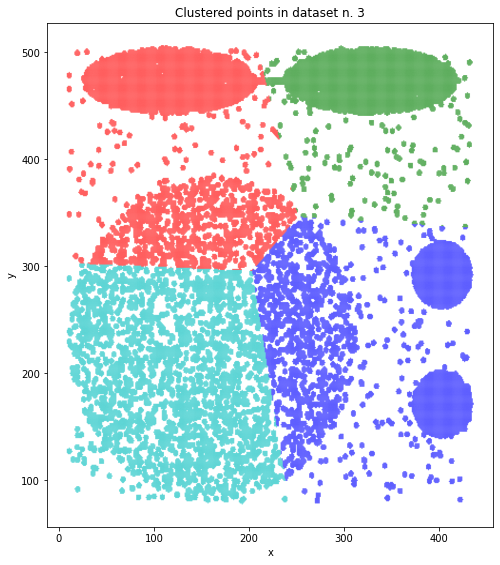

In [10]:
fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Clustered points in dataset n. 3')

ax.set_xlabel('x')
ax.set_ylabel('y')

# set the list of colors to be selected when plotting the different clusters
color=['b','g','r','c','m','y','k','w']
    
#plot the dataset
for clu in range(k):
    # collect the sequence of cooordinates of the points in each given cluster (determined by clu)
    data_list_x = [data3[i,0] for i in range(n_samples3) if kmeans3.labels_[i]==clu]
    data_list_y = [data3[i,1] for i in range(n_samples3) if kmeans3.labels_[i]==clu]
    plt.scatter(data_list_x, data_list_y, s=2, edgecolors='none', c=color[clu], alpha=0.5)

plt.show()

In the following cells I propose you to write a program that computes with a statistical measure of your choice a quantitative evaluation of clusters in the three datasets.

**Note:**
It is advisable to execute K-means a certain number of times (let us try 10 times) and then select the clustering solution that gives the best value of the evaluation measure.

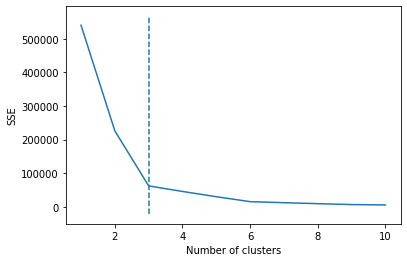

In [11]:
# Valutazione del primo dataset
# inertia_ : float  -  Sum of squared distances of samples to their closest cluster center.
# Tramite questo metodo mi calcolo Sum of Squared Erros degli esempi calcolanddo la distanza 
# dal centro del cluster all'interno del quale sono stati classificati. Il primo parametro  
# mi dirà il numero di cluster, mentre il secondo il valore effettivo
# Esempio di output: {1: 540169.52, 2: 225889.10891089108, .... }
sse = {}
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(data1)
    sse[k] = kmeans.inertia_
    
# Per calcolare l'elbow uso questa libreria esterna
kn = KneeLocator(
    list(sse.keys()),
    list(sse.values()),
    curve='convex',
    direction='decreasing',
    interp_method='polynomial',
)

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.vlines(kn.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.show()

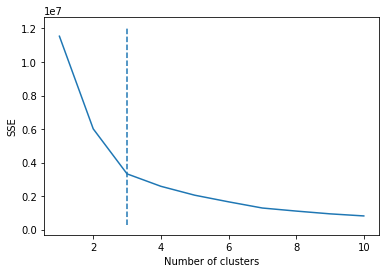

In [12]:
# Valutazione del secondo dataset
sse = {}
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(data2)
    sse[k] = kmeans.inertia_
    
kn = KneeLocator(
    list(sse.keys()),
    list(sse.values()),
    curve='convex',
    direction='decreasing',
    interp_method='polynomial',
)

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.vlines(kn.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.show()

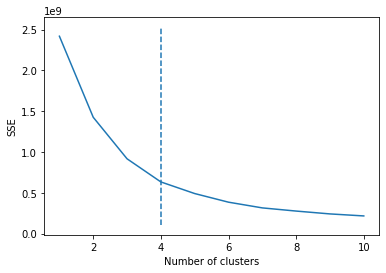

In [13]:
# Valutazione del terzo dataset
sse = {}
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(data3)
    sse[k] = kmeans.inertia_
    
kn = KneeLocator(
    list(sse.keys()),
    list(sse.values()),
    curve='convex',
    direction='decreasing',
    interp_method='polynomial',
)

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.vlines(kn.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.show()

As already done with classification by k-nn, plot in the cell below the quantitative measure of your choice (used above) with respect to an increasing value of k (the number of clusters) so that the best value of k can be selected.

# Silhouettes per il primo dataset

For n_clusters = 2 The average silhouette_score is : 0.5651096232579514


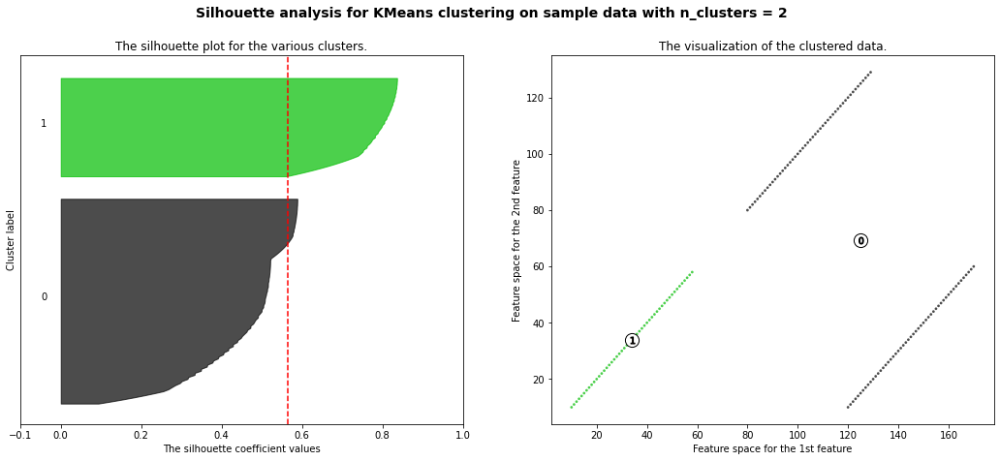

For n_clusters = 3 The average silhouette_score is : 0.7229402453727759


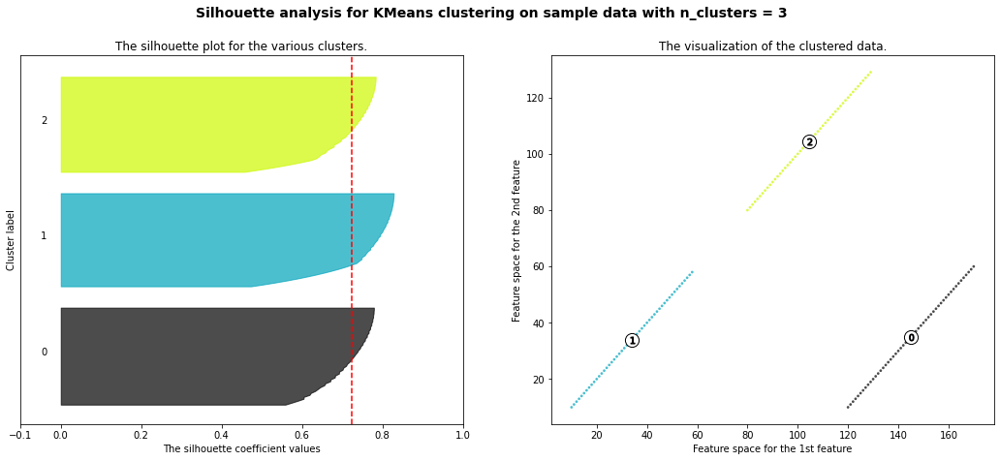

For n_clusters = 4 The average silhouette_score is : 0.6824925173029859


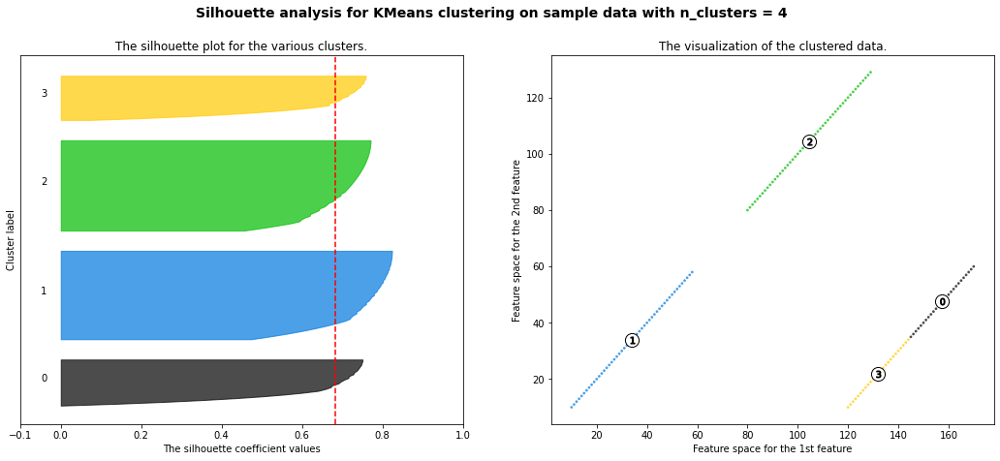

For n_clusters = 5 The average silhouette_score is : 0.6372722940289592


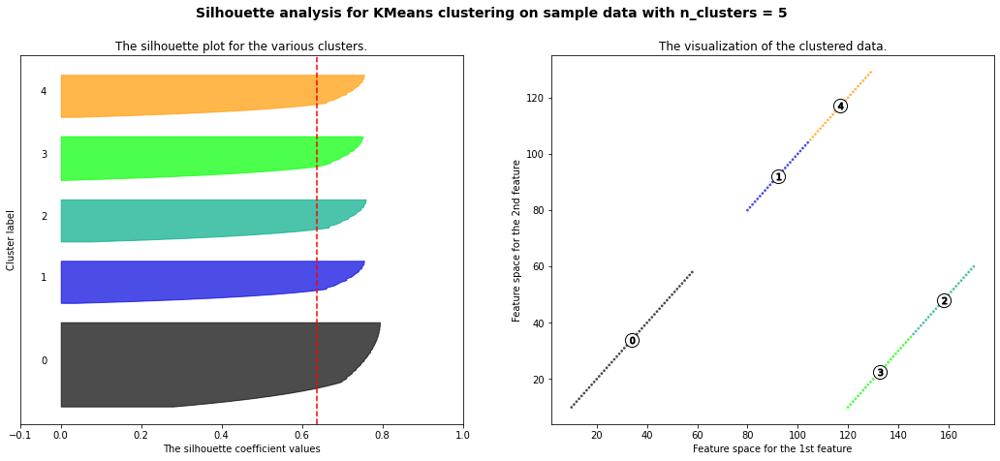

For n_clusters = 6 The average silhouette_score is : 0.6113129278986535


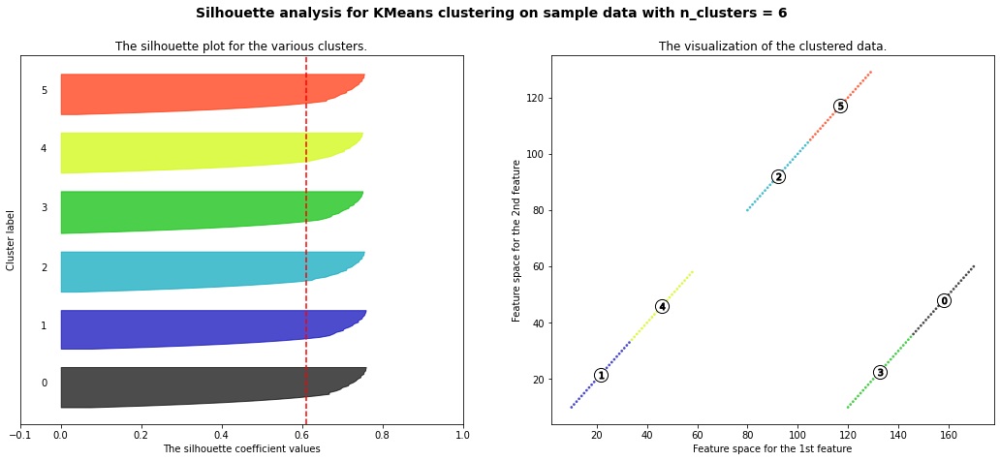

For n_clusters = 7 The average silhouette_score is : 0.595587703417737


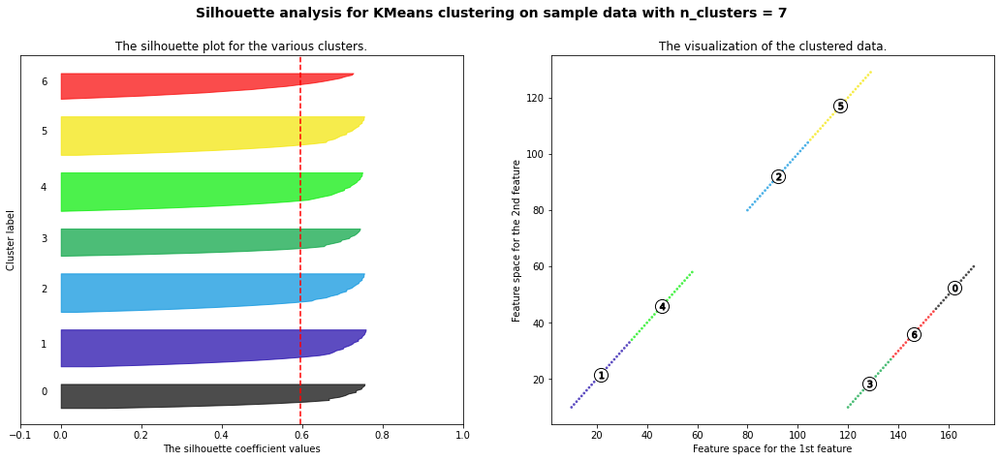

For n_clusters = 8 The average silhouette_score is : 0.5797525125119961


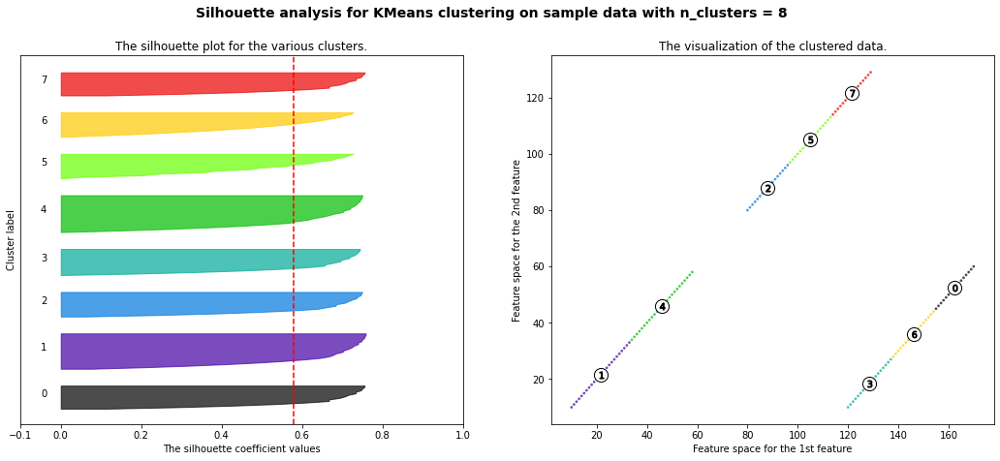

For n_clusters = 9 The average silhouette_score is : 0.5652923851357741


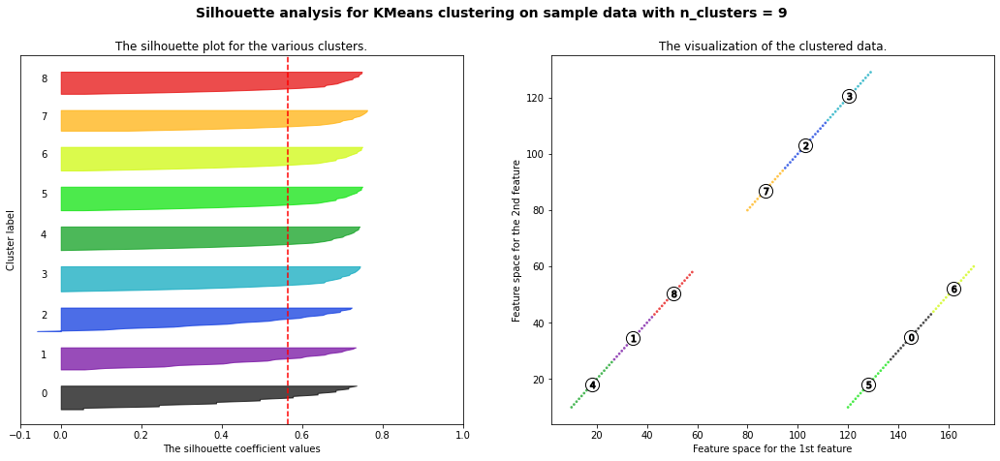

For n_clusters = 10 The average silhouette_score is : 0.5558676358685211


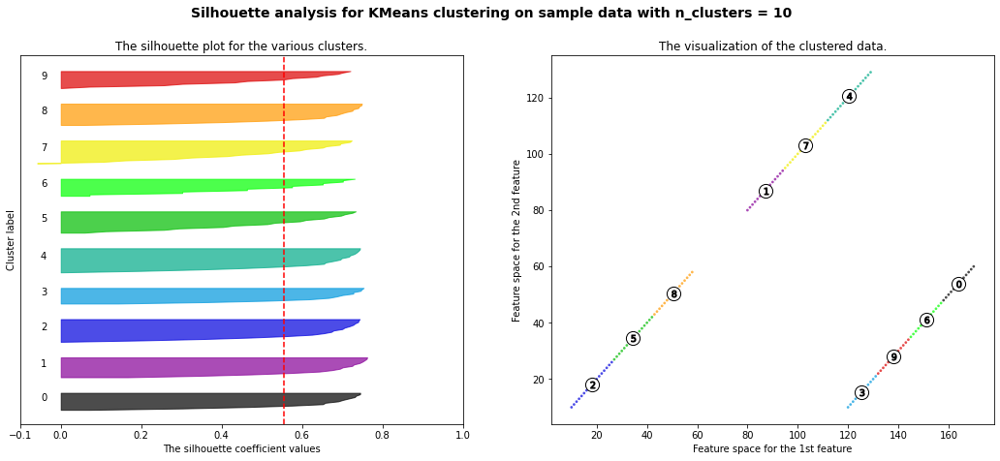

In [14]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

# **Debug**
if (os.path.isfile("SilhouettesDataset1.pdf")): os.remove("SilhouettesDataset1.pdf")

#Essendo un processo pesante evito di eseguirlo se possibile
if not(os.path.isfile("SilhouettesDataset1.pdf")):

    # Creo una variabile che utlizzerò per il salvataggio dei pdf
    filenames = list();

    for n_clusters in range(2,11):
        # Predispongo i due subplots per la rappresentazione
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # Il primo sublot rappresenta la Silhouette
        # Imposto il range della silhouette [-0.1; 1]
        ax1.set_xlim([-0.1, 1])
    
        # Accorgimento grafico per dare un po' di spazio alla
        # rappresentazione dei clusters
        ax1.set_ylim([0, len(data1) + (n_clusters + 1) * 10])

        # Inizializzo i cluster impostando il seed a 10 
        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        # In cluster labels avrò un array con tante posizioni quante sono i dati,
        # al cui interno vi sarà il cluster di riferimento
        # Esempio: [ 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 4 4 4 4 ... ]
        cluster_labels = clusterer.fit_predict(data1)

        # Calcolo e stampo lo score della silhouette in relazione
        # al cluster di riferimento
        silhouette_avg = silhouette_score(data1, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

        # Computo gli score della silhouette per ogni dato
        # Questa funzione misura quanto bene sono stati clusterizzati con
        # esempi simili a loro stessi
        sample_silhouette_values = silhouette_samples(data1, cluster_labels)

        y_lower = 10
    
        for i in range(n_clusters):
            # Procedo con l'aggregare i punteggi della silhouette 
            # per i campioni appartenenti al cluster i e li ordino
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            # Setto il colore per differenziarli
            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, 
                              ith_cluster_silhouette_values, 
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Identifico la silohuette inserendogli al suo fianco
            # il numero di k utilizzato
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10 

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # Retta vertical che identifica lo score medio per i valori
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # Ora plotto la seconda figura nella quale mostro i cluster graficamente
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(data1[:, 0], data1[:, 1], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')

        # Utilizzo dei numeri cerchiati per farli notare al meglio
        centers = clusterer.cluster_centers_
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o', c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters), fontsize=14, fontweight='bold')

        plt.show()
        filenames.append(str(n_clusters)+".pdf")
        # Non eseguo qui il processo di eliminazione/merging perche'
        # a seconda del file ho tempi di salvataggio diversi
        fig.savefig(str(n_clusters)+".pdf")
    
    # Elimino i file temporanei e creo un unico file pdf
    merger = PdfFileMerger()
    for filename in filenames:
        merger.append(filename)
        os.remove(filename)

    merger.write("SilhouettesDataset1.pdf")

# Silhouettes per il secondo dataset

For n_clusters = 2 The average silhouette_score is : 0.43322366812579544


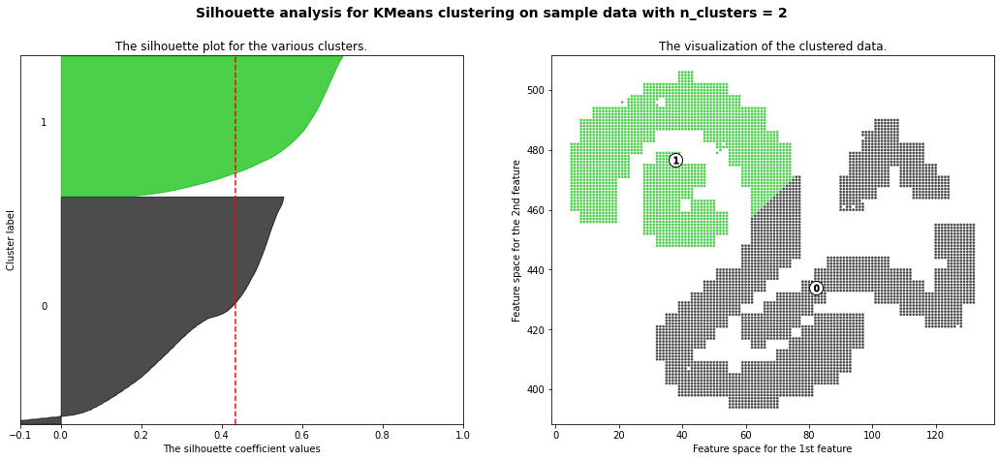

For n_clusters = 3 The average silhouette_score is : 0.48006914019384417


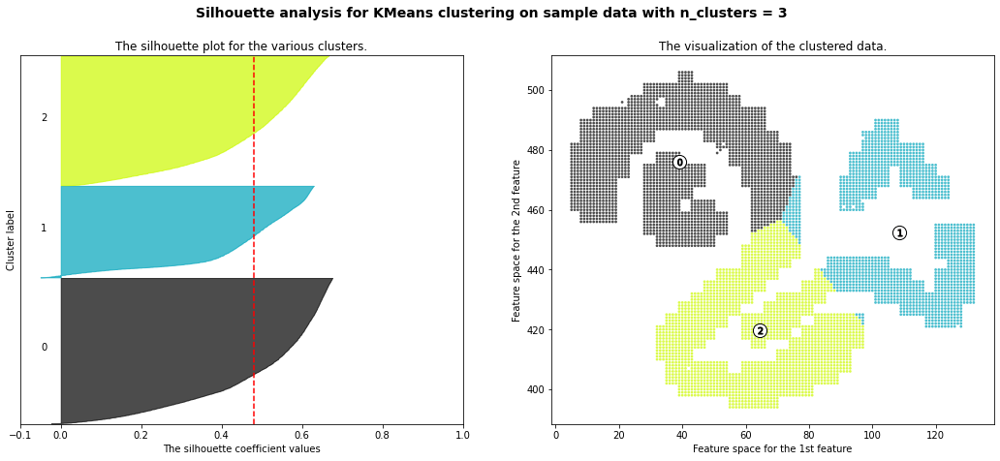

For n_clusters = 4 The average silhouette_score is : 0.4161849907517932


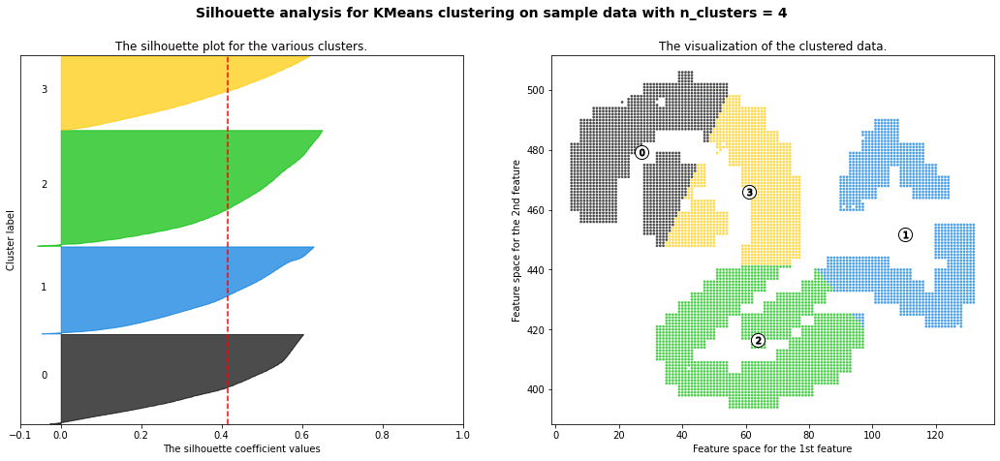

For n_clusters = 5 The average silhouette_score is : 0.4247453357049124


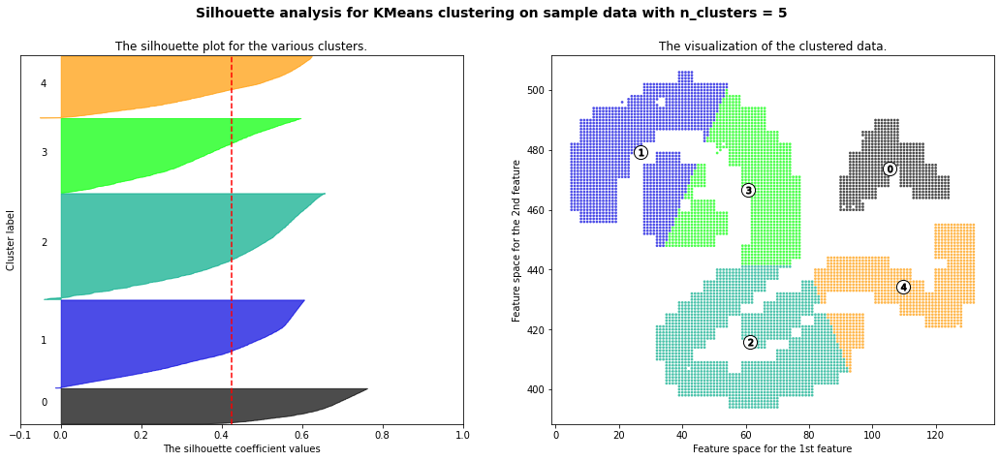

For n_clusters = 6 The average silhouette_score is : 0.41023090652164795


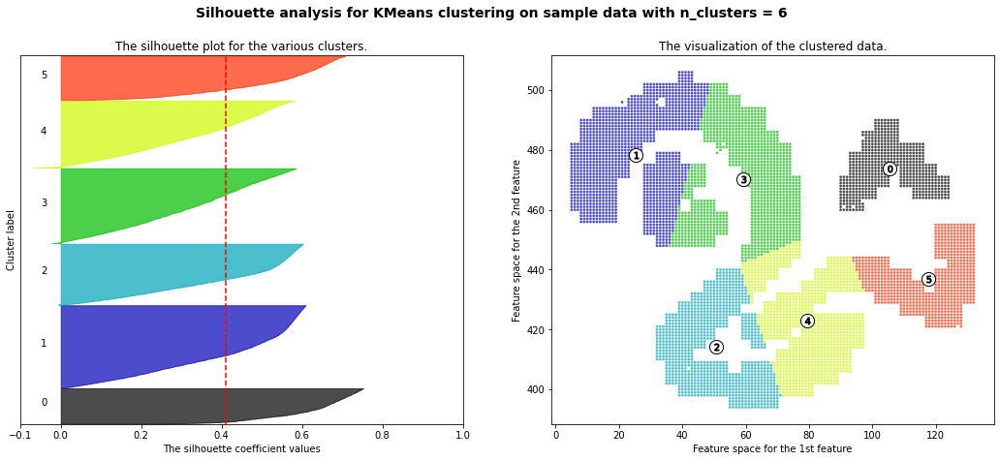

For n_clusters = 7 The average silhouette_score is : 0.433295789519672


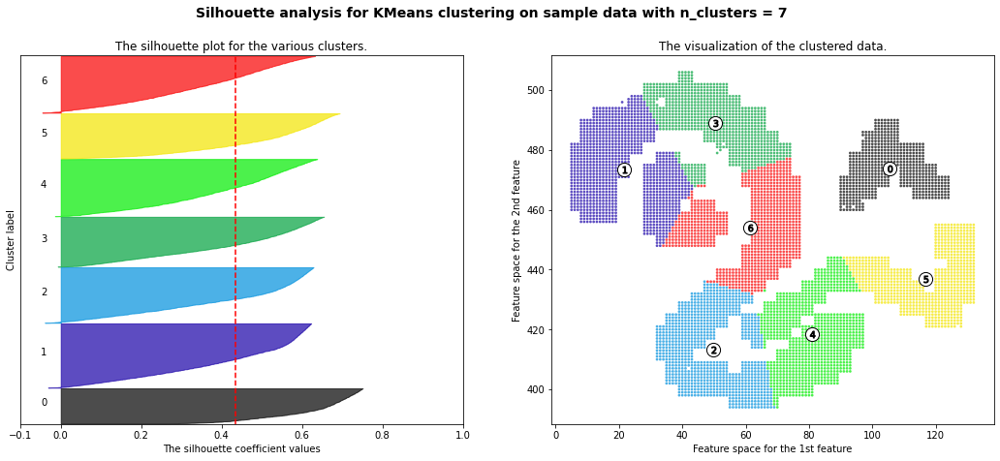

For n_clusters = 8 The average silhouette_score is : 0.44542881887774544


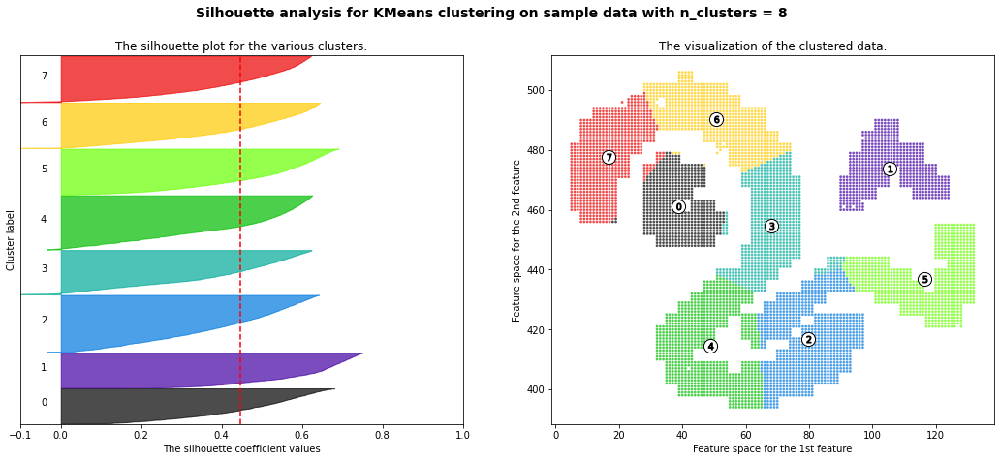

For n_clusters = 9 The average silhouette_score is : 0.44736504422327555


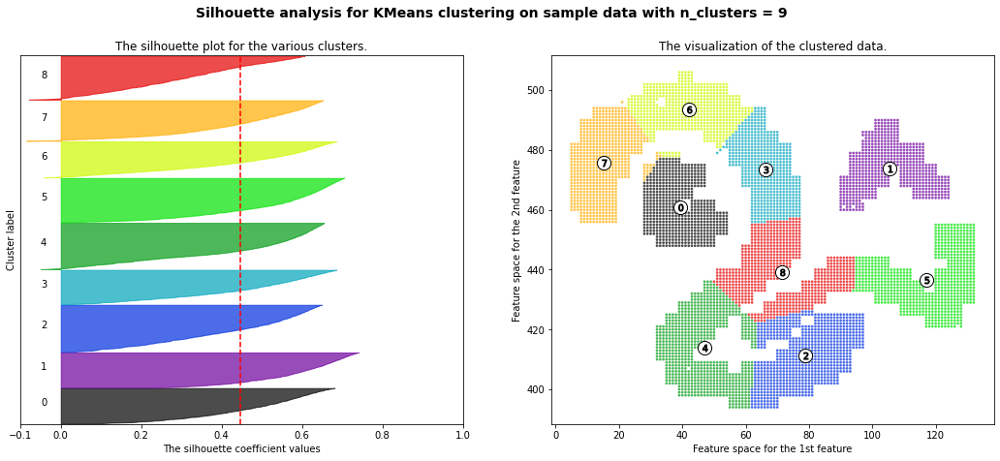

For n_clusters = 10 The average silhouette_score is : 0.44017340927380316


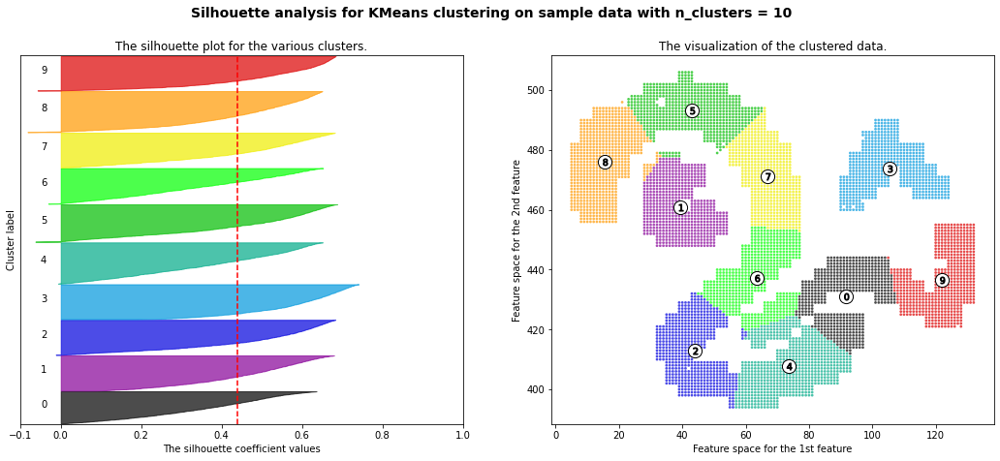

In [15]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

# **Debug**
os.remove("SilhouettesDataset2.pdf")

#Essendo un processo pesante evito di eseguirlo se possibile
if not(os.path.isfile("SilhouettesDataset2.pdf")):

    # Creo una variabile che utlizzerò per il salvataggio dei pdf
    filenames = list();

    for n_clusters in range(2,11):
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        ax1.set_xlim([-0.1, 1])
    
        ax1.set_ylim([0, len(data2) + (n_clusters + 1) * 10])

        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(data2)

        silhouette_avg = silhouette_score(data2, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        sample_silhouette_values = silhouette_samples(data2, cluster_labels)


        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10 

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(data2[:, 0], data2[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

        centers = clusterer.cluster_centers_
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')
        plt.show()
        filenames.append(str(n_clusters)+".pdf")
        fig.savefig(str(n_clusters)+".pdf")
    
    # Elimino i file temporanei e creo un unico file pdf
    merger = PdfFileMerger()
    for filename in filenames:
        merger.append(filename)
        os.remove(filename)

    merger.write("SilhouettesDataset2.pdf")

# Silhouettes per il terzo dataset

In [16]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

# Essendo un processo pesante evito di eseguirlo se possibile
if not(os.path.isfile("SilhouettesDataset3.pdf")):

    # Creo una variabile che utlizzerò per il salvataggio dei pdf
    filenames = list();

    for n_clusters in range(2,11):
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        ax1.set_xlim([-0.1, 1])
    
        ax1.set_ylim([0, len(data3) + (n_clusters + 1) * 10])

        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(data3)

        silhouette_avg = silhouette_score(data3, cluster_labels)
        print("For n_clusters =", n_clusters,
              "The average silhouette_score is :", silhouette_avg)

        sample_silhouette_values = silhouette_samples(data3, cluster_labels)


        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10 

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(data3[:, 0], data3[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        centers = clusterer.cluster_centers_
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                      "with n_clusters = %d" % n_clusters),
                     fontsize=14, fontweight='bold')
        plt.show()
        filenames.append(str(n_clusters)+".pdf")
        fig.savefig(str(n_clusters)+".pdf")
    
    # Elimino i file temporanei e creo un unico file pdf
    merger = PdfFileMerger()
    for filename in filenames:
        merger.append(filename)
        os.remove(filename)

    merger.write("SilhouettesDataset3.pdf")

In the following cell I propose you to run DBSCAN, instead, on one of the last two datasets: either dataset2 or dataset3. 

At the beginning try using a pair of Minpts and Eps of your choice.

**Note:**
If the data is too big, **sample it random, using a factor of 0.1.**

# DBSCAN on dataset 2

In [17]:
from sklearn.cluster import DBSCAN

dbscan1 = DBSCAN(eps=2, min_samples=10).fit(data2)

i=0
for i in range(n_samples2):
    print("Example n."+str(i)+"=("+str(data2[i,0])+","+str(data2[i,1])+")")
    print("in cluster n."+str(dbscan1.labels_[i]))

Example n.0=(5.0,482.0)
in cluster n.0
Example n.1=(5.0,481.0)
in cluster n.0
Example n.2=(5.0,480.0)
in cluster n.0
Example n.3=(5.0,479.0)
in cluster n.0
Example n.4=(5.0,478.0)
in cluster n.0
Example n.5=(5.0,477.0)
in cluster n.0
Example n.6=(5.0,476.0)
in cluster n.0
Example n.7=(5.0,475.0)
in cluster n.0
Example n.8=(5.0,474.0)
in cluster n.0
Example n.9=(5.0,473.0)
in cluster n.0
Example n.10=(5.0,472.0)
in cluster n.0
Example n.11=(5.0,471.0)
in cluster n.0
Example n.12=(5.0,470.0)
in cluster n.0
Example n.13=(5.0,469.0)
in cluster n.0
Example n.14=(5.0,468.0)
in cluster n.0
Example n.15=(5.0,467.0)
in cluster n.0
Example n.16=(5.0,466.0)
in cluster n.0
Example n.17=(5.0,465.0)
in cluster n.0
Example n.18=(5.0,464.0)
in cluster n.0
Example n.19=(5.0,463.0)
in cluster n.0
Example n.20=(5.0,462.0)
in cluster n.0
Example n.21=(5.0,461.0)
in cluster n.0
Example n.22=(5.0,460.0)
in cluster n.0
Example n.23=(6.0,482.0)
in cluster n.0
Example n.24=(6.0,481.0)
in cluster n.0
Example n.

Example n.1013=(34.0,472.0)
in cluster n.1
Example n.1014=(34.0,471.0)
in cluster n.1
Example n.1015=(34.0,470.0)
in cluster n.1
Example n.1016=(34.0,469.0)
in cluster n.1
Example n.1017=(34.0,468.0)
in cluster n.1
Example n.1018=(34.0,467.0)
in cluster n.1
Example n.1019=(34.0,466.0)
in cluster n.1
Example n.1020=(34.0,465.0)
in cluster n.1
Example n.1021=(34.0,464.0)
in cluster n.1
Example n.1022=(34.0,463.0)
in cluster n.1
Example n.1023=(34.0,462.0)
in cluster n.1
Example n.1024=(34.0,461.0)
in cluster n.1
Example n.1025=(34.0,460.0)
in cluster n.1
Example n.1026=(34.0,459.0)
in cluster n.1
Example n.1027=(34.0,458.0)
in cluster n.1
Example n.1028=(34.0,457.0)
in cluster n.1
Example n.1029=(34.0,456.0)
in cluster n.1
Example n.1030=(34.0,455.0)
in cluster n.1
Example n.1031=(34.0,454.0)
in cluster n.1
Example n.1032=(34.0,453.0)
in cluster n.1
Example n.1033=(34.0,452.0)
in cluster n.1
Example n.1034=(34.0,451.0)
in cluster n.1
Example n.1035=(34.0,450.0)
in cluster n.1
Example n.1

Example n.1763=(44.0,456.0)
in cluster n.1
Example n.1764=(44.0,455.0)
in cluster n.1
Example n.1765=(44.0,454.0)
in cluster n.1
Example n.1766=(44.0,453.0)
in cluster n.1
Example n.1767=(44.0,452.0)
in cluster n.1
Example n.1768=(44.0,451.0)
in cluster n.1
Example n.1769=(44.0,450.0)
in cluster n.1
Example n.1770=(44.0,449.0)
in cluster n.1
Example n.1771=(44.0,448.0)
in cluster n.1
Example n.1772=(44.0,432.0)
in cluster n.0
Example n.1773=(44.0,431.0)
in cluster n.0
Example n.1774=(44.0,430.0)
in cluster n.0
Example n.1775=(44.0,429.0)
in cluster n.0
Example n.1776=(44.0,428.0)
in cluster n.0
Example n.1777=(44.0,427.0)
in cluster n.0
Example n.1778=(44.0,426.0)
in cluster n.0
Example n.1779=(44.0,425.0)
in cluster n.0
Example n.1780=(44.0,424.0)
in cluster n.0
Example n.1781=(44.0,423.0)
in cluster n.0
Example n.1782=(44.0,422.0)
in cluster n.0
Example n.1783=(44.0,421.0)
in cluster n.0
Example n.1784=(44.0,420.0)
in cluster n.0
Example n.1785=(44.0,419.0)
in cluster n.0
Example n.1

Example n.2608=(57.0,437.0)
in cluster n.0
Example n.2609=(57.0,436.0)
in cluster n.0
Example n.2610=(57.0,435.0)
in cluster n.0
Example n.2611=(57.0,434.0)
in cluster n.0
Example n.2612=(57.0,433.0)
in cluster n.0
Example n.2613=(57.0,432.0)
in cluster n.0
Example n.2614=(57.0,431.0)
in cluster n.0
Example n.2615=(57.0,430.0)
in cluster n.0
Example n.2616=(57.0,429.0)
in cluster n.0
Example n.2617=(57.0,428.0)
in cluster n.0
Example n.2618=(57.0,427.0)
in cluster n.0
Example n.2619=(57.0,426.0)
in cluster n.0
Example n.2620=(57.0,425.0)
in cluster n.0
Example n.2621=(57.0,405.0)
in cluster n.0
Example n.2622=(57.0,404.0)
in cluster n.0
Example n.2623=(57.0,403.0)
in cluster n.0
Example n.2624=(57.0,402.0)
in cluster n.0
Example n.2625=(57.0,401.0)
in cluster n.0
Example n.2626=(57.0,400.0)
in cluster n.0
Example n.2627=(57.0,399.0)
in cluster n.0
Example n.2628=(57.0,398.0)
in cluster n.0
Example n.2629=(57.0,397.0)
in cluster n.0
Example n.2630=(57.0,396.0)
in cluster n.0
Example n.2

in cluster n.0
Example n.3311=(66.0,448.0)
in cluster n.0
Example n.3312=(66.0,447.0)
in cluster n.0
Example n.3313=(66.0,446.0)
in cluster n.0
Example n.3314=(66.0,445.0)
in cluster n.0
Example n.3315=(66.0,444.0)
in cluster n.0
Example n.3316=(66.0,443.0)
in cluster n.0
Example n.3317=(66.0,442.0)
in cluster n.0
Example n.3318=(66.0,441.0)
in cluster n.0
Example n.3319=(66.0,440.0)
in cluster n.0
Example n.3320=(66.0,439.0)
in cluster n.0
Example n.3321=(66.0,438.0)
in cluster n.0
Example n.3322=(66.0,437.0)
in cluster n.0
Example n.3323=(66.0,436.0)
in cluster n.0
Example n.3324=(66.0,435.0)
in cluster n.0
Example n.3325=(66.0,434.0)
in cluster n.0
Example n.3326=(66.0,433.0)
in cluster n.0
Example n.3327=(66.0,429.0)
in cluster n.0
Example n.3328=(66.0,428.0)
in cluster n.0
Example n.3329=(66.0,427.0)
in cluster n.0
Example n.3330=(66.0,426.0)
in cluster n.0
Example n.3331=(66.0,425.0)
in cluster n.0
Example n.3332=(66.0,424.0)
in cluster n.0
Example n.3333=(66.0,423.0)
in cluster 

in cluster n.0
Example n.4083=(76.0,415.0)
in cluster n.0
Example n.4084=(76.0,414.0)
in cluster n.0
Example n.4085=(76.0,413.0)
in cluster n.0
Example n.4086=(76.0,412.0)
in cluster n.0
Example n.4087=(76.0,411.0)
in cluster n.0
Example n.4088=(76.0,410.0)
in cluster n.0
Example n.4089=(76.0,409.0)
in cluster n.0
Example n.4090=(76.0,408.0)
in cluster n.0
Example n.4091=(76.0,407.0)
in cluster n.0
Example n.4092=(76.0,406.0)
in cluster n.0
Example n.4093=(76.0,405.0)
in cluster n.0
Example n.4094=(76.0,404.0)
in cluster n.0
Example n.4095=(76.0,403.0)
in cluster n.0
Example n.4096=(76.0,402.0)
in cluster n.0
Example n.4097=(76.0,401.0)
in cluster n.0
Example n.4098=(76.0,400.0)
in cluster n.0
Example n.4099=(76.0,399.0)
in cluster n.0
Example n.4100=(76.0,398.0)
in cluster n.0
Example n.4101=(77.0,471.0)
in cluster n.0
Example n.4102=(77.0,470.0)
in cluster n.0
Example n.4103=(77.0,469.0)
in cluster n.0
Example n.4104=(77.0,468.0)
in cluster n.0
Example n.4105=(77.0,467.0)
in cluster 

Example n.4762=(93.0,419.0)
in cluster n.0
Example n.4763=(93.0,418.0)
in cluster n.0
Example n.4764=(93.0,417.0)
in cluster n.0
Example n.4765=(93.0,416.0)
in cluster n.0
Example n.4766=(93.0,415.0)
in cluster n.0
Example n.4767=(93.0,414.0)
in cluster n.0
Example n.4768=(93.0,413.0)
in cluster n.0
Example n.4769=(93.0,412.0)
in cluster n.0
Example n.4770=(93.0,411.0)
in cluster n.0
Example n.4771=(93.0,410.0)
in cluster n.0
Example n.4772=(93.0,409.0)
in cluster n.0
Example n.4773=(93.0,408.0)
in cluster n.0
Example n.4774=(93.0,407.0)
in cluster n.0
Example n.4775=(93.0,406.0)
in cluster n.0
Example n.4776=(94.0,479.0)
in cluster n.2
Example n.4777=(94.0,478.0)
in cluster n.2
Example n.4778=(94.0,477.0)
in cluster n.2
Example n.4779=(94.0,476.0)
in cluster n.2
Example n.4780=(94.0,475.0)
in cluster n.2
Example n.4781=(94.0,474.0)
in cluster n.2
Example n.4782=(94.0,473.0)
in cluster n.2
Example n.4783=(94.0,472.0)
in cluster n.2
Example n.4784=(94.0,471.0)
in cluster n.2
Example n.4

in cluster n.2
Example n.5512=(114.0,469.0)
in cluster n.2
Example n.5513=(114.0,468.0)
in cluster n.2
Example n.5514=(114.0,467.0)
in cluster n.2
Example n.5515=(114.0,466.0)
in cluster n.2
Example n.5516=(114.0,465.0)
in cluster n.2
Example n.5517=(114.0,464.0)
in cluster n.2
Example n.5518=(114.0,436.0)
in cluster n.0
Example n.5519=(114.0,435.0)
in cluster n.0
Example n.5520=(114.0,434.0)
in cluster n.0
Example n.5521=(114.0,433.0)
in cluster n.0
Example n.5522=(114.0,432.0)
in cluster n.0
Example n.5523=(114.0,431.0)
in cluster n.0
Example n.5524=(114.0,430.0)
in cluster n.0
Example n.5525=(114.0,429.0)
in cluster n.0
Example n.5526=(114.0,428.0)
in cluster n.0
Example n.5527=(114.0,427.0)
in cluster n.0
Example n.5528=(114.0,426.0)
in cluster n.0
Example n.5529=(114.0,425.0)
in cluster n.0
Example n.5530=(115.0,482.0)
in cluster n.2
Example n.5531=(115.0,481.0)
in cluster n.2
Example n.5532=(115.0,480.0)
in cluster n.2
Example n.5533=(115.0,479.0)
in cluster n.2
Example n.5534=(1

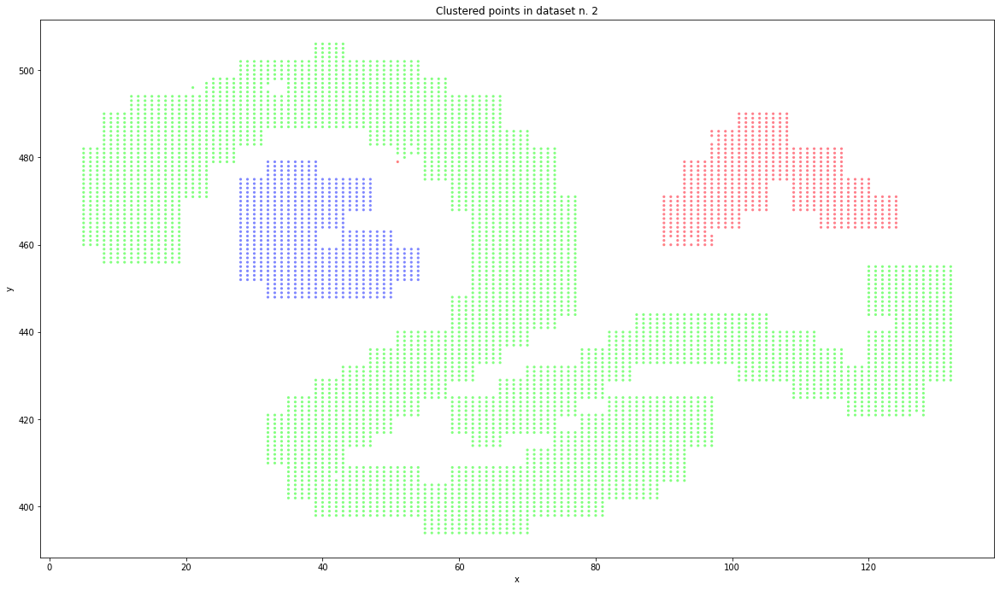

In [18]:
fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Clustered points in dataset n. 2')

ax.set_xlabel('x')
ax.set_ylabel('y')

plt.scatter(data2[:,0], data2[:,1], s=10, edgecolors='none', c=dbscan1.labels_, alpha=0.5, cmap='hsv')

plt.show()

# DBSCAN on dataset 3

In [19]:
np.random.seed(5)

dbscan2 = DBSCAN(eps=2, min_samples=10).fit(data3)

i=0
for i in range(n_samples3):
    print("Example n."+str(i)+"=("+str(data3[i,0])+","+str(data3[i,1])+")")
    print("in cluster n."+str(dbscan2.labels_[i]))

Example n.0=(9.0,480.0)
in cluster n.0
Example n.1=(9.0,479.0)
in cluster n.0
Example n.2=(9.0,478.0)
in cluster n.0
Example n.3=(9.0,477.0)
in cluster n.0
Example n.4=(9.0,467.0)
in cluster n.1
Example n.5=(9.0,466.0)
in cluster n.1
Example n.6=(9.0,465.0)
in cluster n.1
Example n.7=(9.0,464.0)
in cluster n.1
Example n.8=(9.0,392.0)
in cluster n.2
Example n.9=(9.0,391.0)
in cluster n.2
Example n.10=(9.0,390.0)
in cluster n.2
Example n.11=(9.0,350.0)
in cluster n.3
Example n.12=(9.0,349.0)
in cluster n.3
Example n.13=(9.0,348.0)
in cluster n.3
Example n.14=(9.0,347.0)
in cluster n.3
Example n.15=(9.0,290.0)
in cluster n.4
Example n.16=(9.0,289.0)
in cluster n.4
Example n.17=(9.0,288.0)
in cluster n.4
Example n.18=(9.0,287.0)
in cluster n.4
Example n.19=(9.0,240.0)
in cluster n.5
Example n.20=(9.0,239.0)
in cluster n.5
Example n.21=(9.0,238.0)
in cluster n.5
Example n.22=(9.0,231.0)
in cluster n.5
Example n.23=(9.0,230.0)
in cluster n.5
Example n.24=(9.0,229.0)
in cluster n.5
Example n.

in cluster n.5
Example n.887=(20.0,216.0)
in cluster n.5
Example n.888=(20.0,215.0)
in cluster n.5
Example n.889=(20.0,214.0)
in cluster n.5
Example n.890=(20.0,208.0)
in cluster n.5
Example n.891=(20.0,207.0)
in cluster n.5
Example n.892=(20.0,206.0)
in cluster n.5
Example n.893=(20.0,205.0)
in cluster n.5
Example n.894=(20.0,204.0)
in cluster n.5
Example n.895=(20.0,203.0)
in cluster n.5
Example n.896=(20.0,202.0)
in cluster n.5
Example n.897=(20.0,201.0)
in cluster n.5
Example n.898=(20.0,200.0)
in cluster n.5
Example n.899=(20.0,199.0)
in cluster n.5
Example n.900=(20.0,198.0)
in cluster n.5
Example n.901=(20.0,197.0)
in cluster n.5
Example n.902=(20.0,196.0)
in cluster n.5
Example n.903=(20.0,195.0)
in cluster n.5
Example n.904=(20.0,194.0)
in cluster n.5
Example n.905=(20.0,193.0)
in cluster n.5
Example n.906=(20.0,192.0)
in cluster n.5
Example n.907=(20.0,191.0)
in cluster n.5
Example n.908=(20.0,190.0)
in cluster n.5
Example n.909=(20.0,189.0)
in cluster n.5
Example n.910=(20.0

Example n.1636=(26.0,370.0)
in cluster n.17
Example n.1637=(26.0,369.0)
in cluster n.17
Example n.1638=(26.0,368.0)
in cluster n.17
Example n.1639=(26.0,367.0)
in cluster n.17
Example n.1640=(26.0,366.0)
in cluster n.17
Example n.1641=(26.0,307.0)
in cluster n.16
Example n.1642=(26.0,306.0)
in cluster n.16
Example n.1643=(26.0,305.0)
in cluster n.16
Example n.1644=(26.0,303.0)
in cluster n.16
Example n.1645=(26.0,302.0)
in cluster n.16
Example n.1646=(26.0,301.0)
in cluster n.16
Example n.1647=(26.0,300.0)
in cluster n.16
Example n.1648=(26.0,299.0)
in cluster n.16
Example n.1649=(26.0,297.0)
in cluster n.5
Example n.1650=(26.0,296.0)
in cluster n.5
Example n.1651=(26.0,295.0)
in cluster n.5
Example n.1652=(26.0,294.0)
in cluster n.5
Example n.1653=(26.0,293.0)
in cluster n.5
Example n.1654=(26.0,292.0)
in cluster n.5
Example n.1655=(26.0,288.0)
in cluster n.5
Example n.1656=(26.0,287.0)
in cluster n.5
Example n.1657=(26.0,286.0)
in cluster n.5
Example n.1658=(26.0,285.0)
in cluster n.

Example n.2386=(30.0,155.0)
in cluster n.5
Example n.2387=(30.0,154.0)
in cluster n.5
Example n.2388=(31.0,502.0)
in cluster n.21
Example n.2389=(31.0,501.0)
in cluster n.21
Example n.2390=(31.0,500.0)
in cluster n.21
Example n.2391=(31.0,499.0)
in cluster n.21
Example n.2392=(31.0,498.0)
in cluster n.21
Example n.2393=(31.0,486.0)
in cluster n.19
Example n.2394=(31.0,485.0)
in cluster n.19
Example n.2395=(31.0,484.0)
in cluster n.19
Example n.2396=(31.0,483.0)
in cluster n.19
Example n.2397=(31.0,482.0)
in cluster n.19
Example n.2398=(31.0,481.0)
in cluster n.19
Example n.2399=(31.0,480.0)
in cluster n.19
Example n.2400=(31.0,479.0)
in cluster n.19
Example n.2401=(31.0,478.0)
in cluster n.19
Example n.2402=(31.0,477.0)
in cluster n.19
Example n.2403=(31.0,476.0)
in cluster n.19
Example n.2404=(31.0,475.0)
in cluster n.19
Example n.2405=(31.0,474.0)
in cluster n.19
Example n.2406=(31.0,473.0)
in cluster n.19
Example n.2407=(31.0,472.0)
in cluster n.19
Example n.2408=(31.0,471.0)
in clu

in cluster n.5
Example n.3136=(35.0,245.0)
in cluster n.5
Example n.3137=(35.0,244.0)
in cluster n.5
Example n.3138=(35.0,243.0)
in cluster n.5
Example n.3139=(35.0,242.0)
in cluster n.5
Example n.3140=(35.0,241.0)
in cluster n.5
Example n.3141=(35.0,240.0)
in cluster n.5
Example n.3142=(35.0,239.0)
in cluster n.5
Example n.3143=(35.0,238.0)
in cluster n.5
Example n.3144=(35.0,237.0)
in cluster n.5
Example n.3145=(35.0,236.0)
in cluster n.5
Example n.3146=(35.0,235.0)
in cluster n.5
Example n.3147=(35.0,234.0)
in cluster n.5
Example n.3148=(35.0,233.0)
in cluster n.5
Example n.3149=(35.0,232.0)
in cluster n.5
Example n.3150=(35.0,226.0)
in cluster n.5
Example n.3151=(35.0,225.0)
in cluster n.5
Example n.3152=(35.0,224.0)
in cluster n.5
Example n.3153=(35.0,223.0)
in cluster n.5
Example n.3154=(35.0,222.0)
in cluster n.5
Example n.3155=(35.0,221.0)
in cluster n.5
Example n.3156=(35.0,220.0)
in cluster n.5
Example n.3157=(35.0,219.0)
in cluster n.5
Example n.3158=(35.0,218.0)
in cluster 

in cluster n.5
Example n.3886=(39.0,203.0)
in cluster n.5
Example n.3887=(39.0,202.0)
in cluster n.5
Example n.3888=(39.0,201.0)
in cluster n.5
Example n.3889=(39.0,200.0)
in cluster n.5
Example n.3890=(39.0,197.0)
in cluster n.5
Example n.3891=(39.0,196.0)
in cluster n.5
Example n.3892=(39.0,195.0)
in cluster n.5
Example n.3893=(39.0,194.0)
in cluster n.5
Example n.3894=(39.0,193.0)
in cluster n.5
Example n.3895=(39.0,192.0)
in cluster n.5
Example n.3896=(39.0,191.0)
in cluster n.5
Example n.3897=(39.0,190.0)
in cluster n.5
Example n.3898=(39.0,187.0)
in cluster n.5
Example n.3899=(39.0,186.0)
in cluster n.5
Example n.3900=(39.0,185.0)
in cluster n.5
Example n.3901=(39.0,184.0)
in cluster n.5
Example n.3902=(39.0,183.0)
in cluster n.5
Example n.3903=(39.0,182.0)
in cluster n.5
Example n.3904=(39.0,181.0)
in cluster n.5
Example n.3905=(39.0,180.0)
in cluster n.5
Example n.3906=(39.0,179.0)
in cluster n.5
Example n.3907=(39.0,178.0)
in cluster n.5
Example n.3908=(39.0,177.0)
in cluster 

Example n.4635=(43.0,278.0)
in cluster n.5
Example n.4636=(43.0,277.0)
in cluster n.5
Example n.4637=(43.0,276.0)
in cluster n.5
Example n.4638=(43.0,275.0)
in cluster n.5
Example n.4639=(43.0,274.0)
in cluster n.5
Example n.4640=(43.0,270.0)
in cluster n.5
Example n.4641=(43.0,269.0)
in cluster n.5
Example n.4642=(43.0,268.0)
in cluster n.5
Example n.4643=(43.0,267.0)
in cluster n.5
Example n.4644=(43.0,266.0)
in cluster n.5
Example n.4645=(43.0,265.0)
in cluster n.5
Example n.4646=(43.0,264.0)
in cluster n.5
Example n.4647=(43.0,263.0)
in cluster n.5
Example n.4648=(43.0,262.0)
in cluster n.5
Example n.4649=(43.0,261.0)
in cluster n.5
Example n.4650=(43.0,260.0)
in cluster n.5
Example n.4651=(43.0,259.0)
in cluster n.5
Example n.4652=(43.0,258.0)
in cluster n.5
Example n.4653=(43.0,257.0)
in cluster n.5
Example n.4654=(43.0,256.0)
in cluster n.5
Example n.4655=(43.0,255.0)
in cluster n.5
Example n.4656=(43.0,254.0)
in cluster n.5
Example n.4657=(43.0,253.0)
in cluster n.5
Example n.4

Example n.5385=(47.0,479.0)
in cluster n.19
Example n.5386=(47.0,478.0)
in cluster n.19
Example n.5387=(47.0,477.0)
in cluster n.19
Example n.5388=(47.0,476.0)
in cluster n.19
Example n.5389=(47.0,475.0)
in cluster n.19
Example n.5390=(47.0,474.0)
in cluster n.19
Example n.5391=(47.0,473.0)
in cluster n.19
Example n.5392=(47.0,472.0)
in cluster n.19
Example n.5393=(47.0,471.0)
in cluster n.19
Example n.5394=(47.0,470.0)
in cluster n.19
Example n.5395=(47.0,469.0)
in cluster n.19
Example n.5396=(47.0,468.0)
in cluster n.19
Example n.5397=(47.0,467.0)
in cluster n.19
Example n.5398=(47.0,466.0)
in cluster n.19
Example n.5399=(47.0,465.0)
in cluster n.19
Example n.5400=(47.0,464.0)
in cluster n.19
Example n.5401=(47.0,463.0)
in cluster n.19
Example n.5402=(47.0,462.0)
in cluster n.19
Example n.5403=(47.0,461.0)
in cluster n.19
Example n.5404=(47.0,460.0)
in cluster n.19
Example n.5405=(47.0,459.0)
in cluster n.19
Example n.5406=(47.0,458.0)
in cluster n.19
Example n.5407=(47.0,457.0)
in c

in cluster n.5
Example n.6135=(50.0,184.0)
in cluster n.5
Example n.6136=(50.0,183.0)
in cluster n.5
Example n.6137=(50.0,182.0)
in cluster n.5
Example n.6138=(50.0,181.0)
in cluster n.5
Example n.6139=(50.0,180.0)
in cluster n.5
Example n.6140=(50.0,178.0)
in cluster n.5
Example n.6141=(50.0,177.0)
in cluster n.5
Example n.6142=(50.0,176.0)
in cluster n.5
Example n.6143=(50.0,175.0)
in cluster n.5
Example n.6144=(50.0,174.0)
in cluster n.5
Example n.6145=(50.0,173.0)
in cluster n.5
Example n.6146=(50.0,172.0)
in cluster n.5
Example n.6147=(50.0,171.0)
in cluster n.5
Example n.6148=(50.0,170.0)
in cluster n.5
Example n.6149=(50.0,169.0)
in cluster n.5
Example n.6150=(50.0,168.0)
in cluster n.5
Example n.6151=(50.0,167.0)
in cluster n.5
Example n.6152=(50.0,166.0)
in cluster n.5
Example n.6153=(50.0,165.0)
in cluster n.5
Example n.6154=(50.0,164.0)
in cluster n.5
Example n.6155=(50.0,163.0)
in cluster n.5
Example n.6156=(50.0,162.0)
in cluster n.5
Example n.6157=(50.0,160.0)
in cluster 

in cluster n.5
Example n.6885=(54.0,275.0)
in cluster n.5
Example n.6886=(54.0,274.0)
in cluster n.5
Example n.6887=(54.0,273.0)
in cluster n.5
Example n.6888=(54.0,272.0)
in cluster n.5
Example n.6889=(54.0,271.0)
in cluster n.5
Example n.6890=(54.0,270.0)
in cluster n.5
Example n.6891=(54.0,269.0)
in cluster n.5
Example n.6892=(54.0,267.0)
in cluster n.5
Example n.6893=(54.0,266.0)
in cluster n.5
Example n.6894=(54.0,265.0)
in cluster n.5
Example n.6895=(54.0,263.0)
in cluster n.5
Example n.6896=(54.0,262.0)
in cluster n.5
Example n.6897=(54.0,261.0)
in cluster n.5
Example n.6898=(54.0,260.0)
in cluster n.5
Example n.6899=(54.0,259.0)
in cluster n.5
Example n.6900=(54.0,258.0)
in cluster n.5
Example n.6901=(54.0,257.0)
in cluster n.5
Example n.6902=(54.0,256.0)
in cluster n.5
Example n.6903=(54.0,255.0)
in cluster n.5
Example n.6904=(54.0,251.0)
in cluster n.5
Example n.6905=(54.0,246.0)
in cluster n.5
Example n.6906=(54.0,245.0)
in cluster n.5
Example n.6907=(54.0,244.0)
in cluster 

Example n.7634=(57.0,240.0)
in cluster n.5
Example n.7635=(57.0,239.0)
in cluster n.5
Example n.7636=(57.0,238.0)
in cluster n.5
Example n.7637=(57.0,237.0)
in cluster n.5
Example n.7638=(57.0,236.0)
in cluster n.5
Example n.7639=(57.0,235.0)
in cluster n.5
Example n.7640=(57.0,234.0)
in cluster n.5
Example n.7641=(57.0,233.0)
in cluster n.5
Example n.7642=(57.0,231.0)
in cluster n.5
Example n.7643=(57.0,230.0)
in cluster n.5
Example n.7644=(57.0,229.0)
in cluster n.5
Example n.7645=(57.0,228.0)
in cluster n.5
Example n.7646=(57.0,227.0)
in cluster n.5
Example n.7647=(57.0,220.0)
in cluster n.37
Example n.7648=(57.0,219.0)
in cluster n.37
Example n.7649=(57.0,218.0)
in cluster n.37
Example n.7650=(57.0,217.0)
in cluster n.37
Example n.7651=(57.0,216.0)
in cluster n.37
Example n.7652=(57.0,213.0)
in cluster n.5
Example n.7653=(57.0,212.0)
in cluster n.5
Example n.7654=(57.0,211.0)
in cluster n.5
Example n.7655=(57.0,210.0)
in cluster n.5
Example n.7656=(57.0,208.0)
in cluster n.5
Exampl

Example n.8384=(60.0,139.0)
in cluster n.5
Example n.8385=(60.0,138.0)
in cluster n.5
Example n.8386=(60.0,137.0)
in cluster n.5
Example n.8387=(60.0,136.0)
in cluster n.5
Example n.8388=(60.0,135.0)
in cluster n.5
Example n.8389=(60.0,134.0)
in cluster n.5
Example n.8390=(60.0,133.0)
in cluster n.5
Example n.8391=(60.0,132.0)
in cluster n.5
Example n.8392=(60.0,131.0)
in cluster n.5
Example n.8393=(60.0,130.0)
in cluster n.5
Example n.8394=(60.0,129.0)
in cluster n.5
Example n.8395=(60.0,128.0)
in cluster n.5
Example n.8396=(60.0,127.0)
in cluster n.5
Example n.8397=(60.0,126.0)
in cluster n.5
Example n.8398=(60.0,125.0)
in cluster n.5
Example n.8399=(61.0,499.0)
in cluster n.19
Example n.8400=(61.0,498.0)
in cluster n.19
Example n.8401=(61.0,497.0)
in cluster n.19
Example n.8402=(61.0,496.0)
in cluster n.19
Example n.8403=(61.0,495.0)
in cluster n.19
Example n.8404=(61.0,494.0)
in cluster n.19
Example n.8405=(61.0,493.0)
in cluster n.19
Example n.8406=(61.0,492.0)
in cluster n.19
Exa

in cluster n.5
Example n.9134=(64.0,314.0)
in cluster n.5
Example n.9135=(64.0,313.0)
in cluster n.5
Example n.9136=(64.0,312.0)
in cluster n.5
Example n.9137=(64.0,311.0)
in cluster n.5
Example n.9138=(64.0,310.0)
in cluster n.5
Example n.9139=(64.0,309.0)
in cluster n.5
Example n.9140=(64.0,308.0)
in cluster n.5
Example n.9141=(64.0,307.0)
in cluster n.5
Example n.9142=(64.0,306.0)
in cluster n.5
Example n.9143=(64.0,305.0)
in cluster n.5
Example n.9144=(64.0,304.0)
in cluster n.5
Example n.9145=(64.0,303.0)
in cluster n.5
Example n.9146=(64.0,302.0)
in cluster n.5
Example n.9147=(64.0,301.0)
in cluster n.5
Example n.9148=(64.0,300.0)
in cluster n.5
Example n.9149=(64.0,299.0)
in cluster n.5
Example n.9150=(64.0,298.0)
in cluster n.5
Example n.9151=(64.0,297.0)
in cluster n.5
Example n.9152=(64.0,296.0)
in cluster n.5
Example n.9153=(64.0,289.0)
in cluster n.5
Example n.9154=(64.0,288.0)
in cluster n.5
Example n.9155=(64.0,287.0)
in cluster n.5
Example n.9156=(64.0,286.0)
in cluster 

in cluster n.5
Example n.9884=(67.0,267.0)
in cluster n.5
Example n.9885=(67.0,266.0)
in cluster n.5
Example n.9886=(67.0,265.0)
in cluster n.5
Example n.9887=(67.0,264.0)
in cluster n.5
Example n.9888=(67.0,263.0)
in cluster n.5
Example n.9889=(67.0,262.0)
in cluster n.5
Example n.9890=(67.0,261.0)
in cluster n.5
Example n.9891=(67.0,248.0)
in cluster n.5
Example n.9892=(67.0,247.0)
in cluster n.5
Example n.9893=(67.0,246.0)
in cluster n.5
Example n.9894=(67.0,245.0)
in cluster n.5
Example n.9895=(67.0,244.0)
in cluster n.5
Example n.9896=(67.0,240.0)
in cluster n.5
Example n.9897=(67.0,239.0)
in cluster n.5
Example n.9898=(67.0,238.0)
in cluster n.5
Example n.9899=(67.0,237.0)
in cluster n.5
Example n.9900=(67.0,236.0)
in cluster n.5
Example n.9901=(67.0,226.0)
in cluster n.5
Example n.9902=(67.0,225.0)
in cluster n.5
Example n.9903=(67.0,224.0)
in cluster n.5
Example n.9904=(67.0,223.0)
in cluster n.5
Example n.9905=(67.0,222.0)
in cluster n.5
Example n.9906=(67.0,221.0)
in cluster 

Example n.10633=(70.0,167.0)
in cluster n.5
Example n.10634=(70.0,166.0)
in cluster n.5
Example n.10635=(70.0,165.0)
in cluster n.5
Example n.10636=(70.0,157.0)
in cluster n.5
Example n.10637=(70.0,156.0)
in cluster n.5
Example n.10638=(70.0,155.0)
in cluster n.5
Example n.10639=(70.0,154.0)
in cluster n.5
Example n.10640=(70.0,153.0)
in cluster n.5
Example n.10641=(70.0,152.0)
in cluster n.5
Example n.10642=(70.0,151.0)
in cluster n.5
Example n.10643=(70.0,150.0)
in cluster n.5
Example n.10644=(70.0,149.0)
in cluster n.5
Example n.10645=(70.0,146.0)
in cluster n.5
Example n.10646=(70.0,145.0)
in cluster n.5
Example n.10647=(70.0,144.0)
in cluster n.5
Example n.10648=(70.0,143.0)
in cluster n.5
Example n.10649=(70.0,142.0)
in cluster n.5
Example n.10650=(70.0,141.0)
in cluster n.5
Example n.10651=(70.0,131.0)
in cluster n.5
Example n.10652=(70.0,130.0)
in cluster n.5
Example n.10653=(70.0,129.0)
in cluster n.5
Example n.10654=(70.0,128.0)
in cluster n.5
Example n.10655=(70.0,127.0)
in 

Example n.11383=(74.0,463.0)
in cluster n.19
Example n.11384=(74.0,462.0)
in cluster n.19
Example n.11385=(74.0,461.0)
in cluster n.19
Example n.11386=(74.0,460.0)
in cluster n.19
Example n.11387=(74.0,459.0)
in cluster n.19
Example n.11388=(74.0,458.0)
in cluster n.19
Example n.11389=(74.0,457.0)
in cluster n.19
Example n.11390=(74.0,456.0)
in cluster n.19
Example n.11391=(74.0,455.0)
in cluster n.19
Example n.11392=(74.0,454.0)
in cluster n.19
Example n.11393=(74.0,453.0)
in cluster n.19
Example n.11394=(74.0,452.0)
in cluster n.19
Example n.11395=(74.0,451.0)
in cluster n.19
Example n.11396=(74.0,450.0)
in cluster n.19
Example n.11397=(74.0,449.0)
in cluster n.19
Example n.11398=(74.0,448.0)
in cluster n.19
Example n.11399=(74.0,447.0)
in cluster n.19
Example n.11400=(74.0,446.0)
in cluster n.19
Example n.11401=(74.0,425.0)
in cluster n.47
Example n.11402=(74.0,424.0)
in cluster n.47
Example n.11403=(74.0,423.0)
in cluster n.47
Example n.11404=(74.0,422.0)
in cluster n.47
Example n.

Example n.12145=(77.0,468.0)
in cluster n.19
Example n.12146=(77.0,467.0)
in cluster n.19
Example n.12147=(77.0,466.0)
in cluster n.19
Example n.12148=(77.0,465.0)
in cluster n.19
Example n.12149=(77.0,464.0)
in cluster n.19
Example n.12150=(77.0,463.0)
in cluster n.19
Example n.12151=(77.0,462.0)
in cluster n.19
Example n.12152=(77.0,461.0)
in cluster n.19
Example n.12153=(77.0,460.0)
in cluster n.19
Example n.12154=(77.0,459.0)
in cluster n.19
Example n.12155=(77.0,458.0)
in cluster n.19
Example n.12156=(77.0,457.0)
in cluster n.19
Example n.12157=(77.0,456.0)
in cluster n.19
Example n.12158=(77.0,455.0)
in cluster n.19
Example n.12159=(77.0,454.0)
in cluster n.19
Example n.12160=(77.0,453.0)
in cluster n.19
Example n.12161=(77.0,452.0)
in cluster n.19
Example n.12162=(77.0,451.0)
in cluster n.19
Example n.12163=(77.0,450.0)
in cluster n.19
Example n.12164=(77.0,449.0)
in cluster n.19
Example n.12165=(77.0,448.0)
in cluster n.19
Example n.12166=(77.0,447.0)
in cluster n.19
Example n.

in cluster n.5
Example n.12931=(80.0,332.0)
in cluster n.5
Example n.12932=(80.0,331.0)
in cluster n.5
Example n.12933=(80.0,330.0)
in cluster n.5
Example n.12934=(80.0,329.0)
in cluster n.5
Example n.12935=(80.0,328.0)
in cluster n.5
Example n.12936=(80.0,327.0)
in cluster n.5
Example n.12937=(80.0,326.0)
in cluster n.5
Example n.12938=(80.0,325.0)
in cluster n.5
Example n.12939=(80.0,324.0)
in cluster n.5
Example n.12940=(80.0,323.0)
in cluster n.5
Example n.12941=(80.0,322.0)
in cluster n.5
Example n.12942=(80.0,317.0)
in cluster n.5
Example n.12943=(80.0,316.0)
in cluster n.5
Example n.12944=(80.0,315.0)
in cluster n.5
Example n.12945=(80.0,314.0)
in cluster n.5
Example n.12946=(80.0,313.0)
in cluster n.5
Example n.12947=(80.0,312.0)
in cluster n.5
Example n.12948=(80.0,309.0)
in cluster n.5
Example n.12949=(80.0,308.0)
in cluster n.5
Example n.12950=(80.0,307.0)
in cluster n.5
Example n.12951=(80.0,306.0)
in cluster n.5
Example n.12952=(80.0,305.0)
in cluster n.5
Example n.12953=(

in cluster n.5
Example n.13845=(83.0,199.0)
in cluster n.5
Example n.13846=(83.0,198.0)
in cluster n.5
Example n.13847=(83.0,197.0)
in cluster n.5
Example n.13848=(83.0,192.0)
in cluster n.5
Example n.13849=(83.0,191.0)
in cluster n.5
Example n.13850=(83.0,190.0)
in cluster n.5
Example n.13851=(83.0,189.0)
in cluster n.5
Example n.13852=(83.0,188.0)
in cluster n.5
Example n.13853=(83.0,187.0)
in cluster n.5
Example n.13854=(83.0,186.0)
in cluster n.5
Example n.13855=(83.0,185.0)
in cluster n.5
Example n.13856=(83.0,178.0)
in cluster n.5
Example n.13857=(83.0,177.0)
in cluster n.5
Example n.13858=(83.0,176.0)
in cluster n.5
Example n.13859=(83.0,175.0)
in cluster n.5
Example n.13860=(83.0,174.0)
in cluster n.5
Example n.13861=(83.0,163.0)
in cluster n.5
Example n.13862=(83.0,162.0)
in cluster n.5
Example n.13863=(83.0,161.0)
in cluster n.5
Example n.13864=(83.0,160.0)
in cluster n.5
Example n.13865=(83.0,159.0)
in cluster n.5
Example n.13866=(83.0,158.0)
in cluster n.5
Example n.13867=(

Example n.14605=(86.0,300.0)
in cluster n.5
Example n.14606=(86.0,299.0)
in cluster n.5
Example n.14607=(86.0,298.0)
in cluster n.5
Example n.14608=(86.0,297.0)
in cluster n.5
Example n.14609=(86.0,289.0)
in cluster n.5
Example n.14610=(86.0,288.0)
in cluster n.5
Example n.14611=(86.0,287.0)
in cluster n.5
Example n.14612=(86.0,286.0)
in cluster n.5
Example n.14613=(86.0,285.0)
in cluster n.5
Example n.14614=(86.0,284.0)
in cluster n.5
Example n.14615=(86.0,283.0)
in cluster n.5
Example n.14616=(86.0,282.0)
in cluster n.5
Example n.14617=(86.0,281.0)
in cluster n.5
Example n.14618=(86.0,280.0)
in cluster n.5
Example n.14619=(86.0,279.0)
in cluster n.5
Example n.14620=(86.0,278.0)
in cluster n.5
Example n.14621=(86.0,275.0)
in cluster n.48
Example n.14622=(86.0,274.0)
in cluster n.48
Example n.14623=(86.0,273.0)
in cluster n.48
Example n.14624=(86.0,272.0)
in cluster n.48
Example n.14625=(86.0,271.0)
in cluster n.48
Example n.14626=(86.0,270.0)
in cluster n.48
Example n.14627=(86.0,269.

in cluster n.5
Example n.15382=(89.0,330.0)
in cluster n.5
Example n.15383=(89.0,329.0)
in cluster n.5
Example n.15384=(89.0,328.0)
in cluster n.5
Example n.15385=(89.0,327.0)
in cluster n.5
Example n.15386=(89.0,326.0)
in cluster n.5
Example n.15387=(89.0,325.0)
in cluster n.5
Example n.15388=(89.0,324.0)
in cluster n.5
Example n.15389=(89.0,323.0)
in cluster n.5
Example n.15390=(89.0,322.0)
in cluster n.5
Example n.15391=(89.0,321.0)
in cluster n.5
Example n.15392=(89.0,320.0)
in cluster n.5
Example n.15393=(89.0,319.0)
in cluster n.5
Example n.15394=(89.0,318.0)
in cluster n.5
Example n.15395=(89.0,317.0)
in cluster n.5
Example n.15396=(89.0,316.0)
in cluster n.5
Example n.15397=(89.0,315.0)
in cluster n.5
Example n.15398=(89.0,314.0)
in cluster n.5
Example n.15399=(89.0,313.0)
in cluster n.5
Example n.15400=(89.0,312.0)
in cluster n.5
Example n.15401=(89.0,311.0)
in cluster n.5
Example n.15402=(89.0,310.0)
in cluster n.5
Example n.15403=(89.0,309.0)
in cluster n.5
Example n.15404=(

in cluster n.19
Example n.16267=(93.0,481.0)
in cluster n.19
Example n.16268=(93.0,480.0)
in cluster n.19
Example n.16269=(93.0,479.0)
in cluster n.19
Example n.16270=(93.0,478.0)
in cluster n.19
Example n.16271=(93.0,477.0)
in cluster n.19
Example n.16272=(93.0,476.0)
in cluster n.19
Example n.16273=(93.0,475.0)
in cluster n.19
Example n.16274=(93.0,474.0)
in cluster n.19
Example n.16275=(93.0,473.0)
in cluster n.19
Example n.16276=(93.0,472.0)
in cluster n.19
Example n.16277=(93.0,471.0)
in cluster n.19
Example n.16278=(93.0,470.0)
in cluster n.19
Example n.16279=(93.0,469.0)
in cluster n.19
Example n.16280=(93.0,468.0)
in cluster n.19
Example n.16281=(93.0,467.0)
in cluster n.19
Example n.16282=(93.0,466.0)
in cluster n.19
Example n.16283=(93.0,465.0)
in cluster n.19
Example n.16284=(93.0,464.0)
in cluster n.19
Example n.16285=(93.0,463.0)
in cluster n.19
Example n.16286=(93.0,462.0)
in cluster n.19
Example n.16287=(93.0,461.0)
in cluster n.19
Example n.16288=(93.0,460.0)
in cluster

in cluster n.19
Example n.17070=(96.0,451.0)
in cluster n.19
Example n.17071=(96.0,450.0)
in cluster n.19
Example n.17072=(96.0,449.0)
in cluster n.19
Example n.17073=(96.0,448.0)
in cluster n.19
Example n.17074=(96.0,447.0)
in cluster n.19
Example n.17075=(96.0,446.0)
in cluster n.19
Example n.17076=(96.0,445.0)
in cluster n.19
Example n.17077=(96.0,444.0)
in cluster n.19
Example n.17078=(96.0,443.0)
in cluster n.19
Example n.17079=(96.0,442.0)
in cluster n.19
Example n.17080=(96.0,441.0)
in cluster n.19
Example n.17081=(96.0,440.0)
in cluster n.19
Example n.17082=(96.0,439.0)
in cluster n.19
Example n.17083=(96.0,438.0)
in cluster n.19
Example n.17084=(96.0,369.0)
in cluster n.5
Example n.17085=(96.0,368.0)
in cluster n.5
Example n.17086=(96.0,367.0)
in cluster n.5
Example n.17087=(96.0,366.0)
in cluster n.5
Example n.17088=(96.0,365.0)
in cluster n.5
Example n.17089=(96.0,364.0)
in cluster n.5
Example n.17090=(96.0,363.0)
in cluster n.5
Example n.17091=(96.0,362.0)
in cluster n.5
Ex

Example n.17881=(99.0,479.0)
in cluster n.19
Example n.17882=(99.0,478.0)
in cluster n.19
Example n.17883=(99.0,477.0)
in cluster n.19
Example n.17884=(99.0,476.0)
in cluster n.19
Example n.17885=(99.0,475.0)
in cluster n.19
Example n.17886=(99.0,474.0)
in cluster n.19
Example n.17887=(99.0,473.0)
in cluster n.19
Example n.17888=(99.0,472.0)
in cluster n.19
Example n.17889=(99.0,471.0)
in cluster n.19
Example n.17890=(99.0,470.0)
in cluster n.19
Example n.17891=(99.0,469.0)
in cluster n.19
Example n.17892=(99.0,468.0)
in cluster n.19
Example n.17893=(99.0,467.0)
in cluster n.19
Example n.17894=(99.0,466.0)
in cluster n.19
Example n.17895=(99.0,465.0)
in cluster n.19
Example n.17896=(99.0,464.0)
in cluster n.19
Example n.17897=(99.0,463.0)
in cluster n.19
Example n.17898=(99.0,462.0)
in cluster n.19
Example n.17899=(99.0,461.0)
in cluster n.19
Example n.17900=(99.0,460.0)
in cluster n.19
Example n.17901=(99.0,459.0)
in cluster n.19
Example n.17902=(99.0,458.0)
in cluster n.19
Example n.

Example n.18694=(102.0,472.0)
in cluster n.19
Example n.18695=(102.0,471.0)
in cluster n.19
Example n.18696=(102.0,470.0)
in cluster n.19
Example n.18697=(102.0,469.0)
in cluster n.19
Example n.18698=(102.0,468.0)
in cluster n.19
Example n.18699=(102.0,467.0)
in cluster n.19
Example n.18700=(102.0,466.0)
in cluster n.19
Example n.18701=(102.0,465.0)
in cluster n.19
Example n.18702=(102.0,464.0)
in cluster n.19
Example n.18703=(102.0,463.0)
in cluster n.19
Example n.18704=(102.0,462.0)
in cluster n.19
Example n.18705=(102.0,461.0)
in cluster n.19
Example n.18706=(102.0,460.0)
in cluster n.19
Example n.18707=(102.0,459.0)
in cluster n.19
Example n.18708=(102.0,458.0)
in cluster n.19
Example n.18709=(102.0,457.0)
in cluster n.19
Example n.18710=(102.0,456.0)
in cluster n.19
Example n.18711=(102.0,455.0)
in cluster n.19
Example n.18712=(102.0,454.0)
in cluster n.19
Example n.18713=(102.0,453.0)
in cluster n.19
Example n.18714=(102.0,452.0)
in cluster n.19
Example n.18715=(102.0,451.0)
in c

Example n.19553=(105.0,240.0)
in cluster n.5
Example n.19554=(105.0,239.0)
in cluster n.5
Example n.19555=(105.0,238.0)
in cluster n.5
Example n.19556=(105.0,229.0)
in cluster n.5
Example n.19557=(105.0,228.0)
in cluster n.5
Example n.19558=(105.0,227.0)
in cluster n.5
Example n.19559=(105.0,226.0)
in cluster n.5
Example n.19560=(105.0,225.0)
in cluster n.5
Example n.19561=(105.0,224.0)
in cluster n.5
Example n.19562=(105.0,223.0)
in cluster n.5
Example n.19563=(105.0,222.0)
in cluster n.5
Example n.19564=(105.0,221.0)
in cluster n.5
Example n.19565=(105.0,220.0)
in cluster n.5
Example n.19566=(105.0,219.0)
in cluster n.5
Example n.19567=(105.0,218.0)
in cluster n.5
Example n.19568=(105.0,217.0)
in cluster n.5
Example n.19569=(105.0,216.0)
in cluster n.5
Example n.19570=(105.0,215.0)
in cluster n.5
Example n.19571=(105.0,214.0)
in cluster n.5
Example n.19572=(105.0,213.0)
in cluster n.5
Example n.19573=(105.0,212.0)
in cluster n.5
Example n.19574=(105.0,211.0)
in cluster n.5
Example n.

Example n.20380=(108.0,144.0)
in cluster n.5
Example n.20381=(108.0,143.0)
in cluster n.5
Example n.20382=(108.0,142.0)
in cluster n.5
Example n.20383=(108.0,141.0)
in cluster n.5
Example n.20384=(108.0,140.0)
in cluster n.5
Example n.20385=(108.0,139.0)
in cluster n.5
Example n.20386=(108.0,138.0)
in cluster n.5
Example n.20387=(108.0,137.0)
in cluster n.5
Example n.20388=(108.0,136.0)
in cluster n.5
Example n.20389=(108.0,135.0)
in cluster n.5
Example n.20390=(108.0,134.0)
in cluster n.5
Example n.20391=(108.0,133.0)
in cluster n.5
Example n.20392=(108.0,132.0)
in cluster n.5
Example n.20393=(108.0,131.0)
in cluster n.5
Example n.20394=(108.0,130.0)
in cluster n.5
Example n.20395=(108.0,127.0)
in cluster n.5
Example n.20396=(108.0,126.0)
in cluster n.5
Example n.20397=(108.0,125.0)
in cluster n.5
Example n.20398=(108.0,124.0)
in cluster n.5
Example n.20399=(108.0,123.0)
in cluster n.5
Example n.20400=(108.0,122.0)
in cluster n.5
Example n.20401=(108.0,117.0)
in cluster n.5
Example n.

in cluster n.19
Example n.21292=(112.0,470.0)
in cluster n.19
Example n.21293=(112.0,469.0)
in cluster n.19
Example n.21294=(112.0,468.0)
in cluster n.19
Example n.21295=(112.0,467.0)
in cluster n.19
Example n.21296=(112.0,466.0)
in cluster n.19
Example n.21297=(112.0,465.0)
in cluster n.19
Example n.21298=(112.0,464.0)
in cluster n.19
Example n.21299=(112.0,463.0)
in cluster n.19
Example n.21300=(112.0,462.0)
in cluster n.19
Example n.21301=(112.0,461.0)
in cluster n.19
Example n.21302=(112.0,460.0)
in cluster n.19
Example n.21303=(112.0,459.0)
in cluster n.19
Example n.21304=(112.0,458.0)
in cluster n.19
Example n.21305=(112.0,457.0)
in cluster n.19
Example n.21306=(112.0,456.0)
in cluster n.19
Example n.21307=(112.0,455.0)
in cluster n.19
Example n.21308=(112.0,454.0)
in cluster n.19
Example n.21309=(112.0,453.0)
in cluster n.19
Example n.21310=(112.0,452.0)
in cluster n.19
Example n.21311=(112.0,451.0)
in cluster n.19
Example n.21312=(112.0,450.0)
in cluster n.19
Example n.21313=(1

in cluster n.19
Example n.22130=(115.0,489.0)
in cluster n.19
Example n.22131=(115.0,488.0)
in cluster n.19
Example n.22132=(115.0,487.0)
in cluster n.19
Example n.22133=(115.0,486.0)
in cluster n.19
Example n.22134=(115.0,485.0)
in cluster n.19
Example n.22135=(115.0,484.0)
in cluster n.19
Example n.22136=(115.0,483.0)
in cluster n.19
Example n.22137=(115.0,482.0)
in cluster n.19
Example n.22138=(115.0,481.0)
in cluster n.19
Example n.22139=(115.0,480.0)
in cluster n.19
Example n.22140=(115.0,479.0)
in cluster n.19
Example n.22141=(115.0,478.0)
in cluster n.19
Example n.22142=(115.0,477.0)
in cluster n.19
Example n.22143=(115.0,476.0)
in cluster n.19
Example n.22144=(115.0,475.0)
in cluster n.19
Example n.22145=(115.0,474.0)
in cluster n.19
Example n.22146=(115.0,473.0)
in cluster n.19
Example n.22147=(115.0,472.0)
in cluster n.19
Example n.22148=(115.0,471.0)
in cluster n.19
Example n.22149=(115.0,470.0)
in cluster n.19
Example n.22150=(115.0,469.0)
in cluster n.19
Example n.22151=(1

Example n.23013=(118.0,279.0)
in cluster n.5
Example n.23014=(118.0,278.0)
in cluster n.5
Example n.23015=(118.0,277.0)
in cluster n.5
Example n.23016=(118.0,276.0)
in cluster n.5
Example n.23017=(118.0,275.0)
in cluster n.5
Example n.23018=(118.0,274.0)
in cluster n.5
Example n.23019=(118.0,273.0)
in cluster n.5
Example n.23020=(118.0,272.0)
in cluster n.5
Example n.23021=(118.0,271.0)
in cluster n.5
Example n.23022=(118.0,270.0)
in cluster n.5
Example n.23023=(118.0,269.0)
in cluster n.5
Example n.23024=(118.0,268.0)
in cluster n.5
Example n.23025=(118.0,267.0)
in cluster n.5
Example n.23026=(118.0,263.0)
in cluster n.57
Example n.23027=(118.0,262.0)
in cluster n.57
Example n.23028=(118.0,261.0)
in cluster n.57
Example n.23029=(118.0,260.0)
in cluster n.57
Example n.23030=(118.0,259.0)
in cluster n.57
Example n.23031=(118.0,237.0)
in cluster n.5
Example n.23032=(118.0,236.0)
in cluster n.5
Example n.23033=(118.0,235.0)
in cluster n.5
Example n.23034=(118.0,234.0)
in cluster n.5
Examp

Example n.23879=(121.0,199.0)
in cluster n.5
Example n.23880=(121.0,196.0)
in cluster n.5
Example n.23881=(121.0,195.0)
in cluster n.5
Example n.23882=(121.0,194.0)
in cluster n.5
Example n.23883=(121.0,193.0)
in cluster n.5
Example n.23884=(121.0,186.0)
in cluster n.5
Example n.23885=(121.0,185.0)
in cluster n.5
Example n.23886=(121.0,184.0)
in cluster n.5
Example n.23887=(121.0,183.0)
in cluster n.5
Example n.23888=(121.0,182.0)
in cluster n.5
Example n.23889=(121.0,181.0)
in cluster n.5
Example n.23890=(121.0,180.0)
in cluster n.5
Example n.23891=(121.0,179.0)
in cluster n.5
Example n.23892=(121.0,178.0)
in cluster n.5
Example n.23893=(121.0,173.0)
in cluster n.5
Example n.23894=(121.0,172.0)
in cluster n.5
Example n.23895=(121.0,171.0)
in cluster n.5
Example n.23896=(121.0,170.0)
in cluster n.5
Example n.23897=(121.0,169.0)
in cluster n.5
Example n.23898=(121.0,168.0)
in cluster n.5
Example n.23899=(121.0,167.0)
in cluster n.5
Example n.23900=(121.0,166.0)
in cluster n.5
Example n.

in cluster n.61
Example n.24746=(124.0,85.0)
in cluster n.61
Example n.24747=(124.0,84.0)
in cluster n.61
Example n.24748=(125.0,504.0)
in cluster n.19
Example n.24749=(125.0,503.0)
in cluster n.19
Example n.24750=(125.0,502.0)
in cluster n.19
Example n.24751=(125.0,501.0)
in cluster n.19
Example n.24752=(125.0,500.0)
in cluster n.19
Example n.24753=(125.0,499.0)
in cluster n.19
Example n.24754=(125.0,498.0)
in cluster n.19
Example n.24755=(125.0,497.0)
in cluster n.19
Example n.24756=(125.0,496.0)
in cluster n.19
Example n.24757=(125.0,495.0)
in cluster n.19
Example n.24758=(125.0,494.0)
in cluster n.19
Example n.24759=(125.0,493.0)
in cluster n.19
Example n.24760=(125.0,492.0)
in cluster n.19
Example n.24761=(125.0,491.0)
in cluster n.19
Example n.24762=(125.0,490.0)
in cluster n.19
Example n.24763=(125.0,489.0)
in cluster n.19
Example n.24764=(125.0,488.0)
in cluster n.19
Example n.24765=(125.0,487.0)
in cluster n.19
Example n.24766=(125.0,486.0)
in cluster n.19
Example n.24767=(125

in cluster n.5
Example n.25614=(127.0,97.0)
in cluster n.5
Example n.25615=(127.0,96.0)
in cluster n.5
Example n.25616=(127.0,95.0)
in cluster n.5
Example n.25617=(127.0,88.0)
in cluster n.61
Example n.25618=(127.0,87.0)
in cluster n.61
Example n.25619=(127.0,86.0)
in cluster n.61
Example n.25620=(127.0,85.0)
in cluster n.61
Example n.25621=(128.0,503.0)
in cluster n.19
Example n.25622=(128.0,502.0)
in cluster n.19
Example n.25623=(128.0,501.0)
in cluster n.19
Example n.25624=(128.0,500.0)
in cluster n.19
Example n.25625=(128.0,499.0)
in cluster n.19
Example n.25626=(128.0,498.0)
in cluster n.19
Example n.25627=(128.0,497.0)
in cluster n.19
Example n.25628=(128.0,496.0)
in cluster n.19
Example n.25629=(128.0,495.0)
in cluster n.19
Example n.25630=(128.0,494.0)
in cluster n.19
Example n.25631=(128.0,493.0)
in cluster n.19
Example n.25632=(128.0,492.0)
in cluster n.19
Example n.25633=(128.0,491.0)
in cluster n.19
Example n.25634=(128.0,490.0)
in cluster n.19
Example n.25635=(128.0,489.0)

in cluster n.57
Example n.26379=(130.0,266.0)
in cluster n.57
Example n.26380=(130.0,265.0)
in cluster n.57
Example n.26381=(130.0,264.0)
in cluster n.57
Example n.26382=(130.0,263.0)
in cluster n.57
Example n.26383=(130.0,262.0)
in cluster n.57
Example n.26384=(130.0,254.0)
in cluster n.5
Example n.26385=(130.0,253.0)
in cluster n.5
Example n.26386=(130.0,252.0)
in cluster n.5
Example n.26387=(130.0,251.0)
in cluster n.5
Example n.26388=(130.0,250.0)
in cluster n.5
Example n.26389=(130.0,249.0)
in cluster n.5
Example n.26390=(130.0,248.0)
in cluster n.5
Example n.26391=(130.0,247.0)
in cluster n.5
Example n.26392=(130.0,245.0)
in cluster n.5
Example n.26393=(130.0,244.0)
in cluster n.5
Example n.26394=(130.0,243.0)
in cluster n.5
Example n.26395=(130.0,242.0)
in cluster n.5
Example n.26396=(130.0,241.0)
in cluster n.5
Example n.26397=(130.0,240.0)
in cluster n.5
Example n.26398=(130.0,239.0)
in cluster n.5
Example n.26399=(130.0,238.0)
in cluster n.5
Example n.26400=(130.0,237.0)
in c

Example n.27290=(133.0,269.0)
in cluster n.57
Example n.27291=(133.0,268.0)
in cluster n.57
Example n.27292=(133.0,267.0)
in cluster n.57
Example n.27293=(133.0,266.0)
in cluster n.57
Example n.27294=(133.0,253.0)
in cluster n.5
Example n.27295=(133.0,252.0)
in cluster n.5
Example n.27296=(133.0,251.0)
in cluster n.5
Example n.27297=(133.0,250.0)
in cluster n.5
Example n.27298=(133.0,249.0)
in cluster n.5
Example n.27299=(133.0,248.0)
in cluster n.5
Example n.27300=(133.0,247.0)
in cluster n.5
Example n.27301=(133.0,246.0)
in cluster n.5
Example n.27302=(133.0,243.0)
in cluster n.5
Example n.27303=(133.0,242.0)
in cluster n.5
Example n.27304=(133.0,241.0)
in cluster n.5
Example n.27305=(133.0,240.0)
in cluster n.5
Example n.27306=(133.0,239.0)
in cluster n.5
Example n.27307=(133.0,238.0)
in cluster n.5
Example n.27308=(133.0,237.0)
in cluster n.5
Example n.27309=(133.0,236.0)
in cluster n.5
Example n.27310=(133.0,235.0)
in cluster n.5
Example n.27311=(133.0,234.0)
in cluster n.5
Exampl

Example n.28128=(136.0,462.0)
in cluster n.19
Example n.28129=(136.0,461.0)
in cluster n.19
Example n.28130=(136.0,460.0)
in cluster n.19
Example n.28131=(136.0,459.0)
in cluster n.19
Example n.28132=(136.0,458.0)
in cluster n.19
Example n.28133=(136.0,457.0)
in cluster n.19
Example n.28134=(136.0,456.0)
in cluster n.19
Example n.28135=(136.0,455.0)
in cluster n.19
Example n.28136=(136.0,454.0)
in cluster n.19
Example n.28137=(136.0,453.0)
in cluster n.19
Example n.28138=(136.0,452.0)
in cluster n.19
Example n.28139=(136.0,451.0)
in cluster n.19
Example n.28140=(136.0,450.0)
in cluster n.19
Example n.28141=(136.0,449.0)
in cluster n.19
Example n.28142=(136.0,448.0)
in cluster n.19
Example n.28143=(136.0,447.0)
in cluster n.19
Example n.28144=(136.0,446.0)
in cluster n.19
Example n.28145=(136.0,445.0)
in cluster n.19
Example n.28146=(136.0,444.0)
in cluster n.19
Example n.28147=(136.0,443.0)
in cluster n.19
Example n.28148=(136.0,442.0)
in cluster n.19
Example n.28149=(136.0,430.0)
in c

in cluster n.5
Example n.29042=(139.0,329.0)
in cluster n.5
Example n.29043=(139.0,328.0)
in cluster n.5
Example n.29044=(139.0,327.0)
in cluster n.5
Example n.29045=(139.0,326.0)
in cluster n.5
Example n.29046=(139.0,325.0)
in cluster n.5
Example n.29047=(139.0,324.0)
in cluster n.5
Example n.29048=(139.0,323.0)
in cluster n.5
Example n.29049=(139.0,322.0)
in cluster n.5
Example n.29050=(139.0,321.0)
in cluster n.5
Example n.29051=(139.0,320.0)
in cluster n.5
Example n.29052=(139.0,319.0)
in cluster n.5
Example n.29053=(139.0,318.0)
in cluster n.5
Example n.29054=(139.0,317.0)
in cluster n.5
Example n.29055=(139.0,316.0)
in cluster n.5
Example n.29056=(139.0,315.0)
in cluster n.5
Example n.29057=(139.0,314.0)
in cluster n.5
Example n.29058=(139.0,311.0)
in cluster n.5
Example n.29059=(139.0,310.0)
in cluster n.5
Example n.29060=(139.0,309.0)
in cluster n.5
Example n.29061=(139.0,308.0)
in cluster n.5
Example n.29062=(139.0,307.0)
in cluster n.5
Example n.29063=(139.0,306.0)
in cluster

in cluster n.5
Example n.29878=(142.0,331.0)
in cluster n.5
Example n.29879=(142.0,330.0)
in cluster n.5
Example n.29880=(142.0,329.0)
in cluster n.5
Example n.29881=(142.0,328.0)
in cluster n.5
Example n.29882=(142.0,327.0)
in cluster n.5
Example n.29883=(142.0,326.0)
in cluster n.5
Example n.29884=(142.0,325.0)
in cluster n.5
Example n.29885=(142.0,324.0)
in cluster n.5
Example n.29886=(142.0,323.0)
in cluster n.5
Example n.29887=(142.0,322.0)
in cluster n.5
Example n.29888=(142.0,321.0)
in cluster n.5
Example n.29889=(142.0,320.0)
in cluster n.5
Example n.29890=(142.0,318.0)
in cluster n.5
Example n.29891=(142.0,317.0)
in cluster n.5
Example n.29892=(142.0,316.0)
in cluster n.5
Example n.29893=(142.0,315.0)
in cluster n.5
Example n.29894=(142.0,314.0)
in cluster n.5
Example n.29895=(142.0,310.0)
in cluster n.5
Example n.29896=(142.0,309.0)
in cluster n.5
Example n.29897=(142.0,308.0)
in cluster n.5
Example n.29898=(142.0,307.0)
in cluster n.5
Example n.29899=(142.0,306.0)
in cluster

Example n.30689=(145.0,458.0)
in cluster n.19
Example n.30690=(145.0,457.0)
in cluster n.19
Example n.30691=(145.0,456.0)
in cluster n.19
Example n.30692=(145.0,455.0)
in cluster n.19
Example n.30693=(145.0,454.0)
in cluster n.19
Example n.30694=(145.0,453.0)
in cluster n.19
Example n.30695=(145.0,452.0)
in cluster n.19
Example n.30696=(145.0,451.0)
in cluster n.19
Example n.30697=(145.0,450.0)
in cluster n.19
Example n.30698=(145.0,449.0)
in cluster n.19
Example n.30699=(145.0,448.0)
in cluster n.19
Example n.30700=(145.0,447.0)
in cluster n.19
Example n.30701=(145.0,446.0)
in cluster n.19
Example n.30702=(145.0,445.0)
in cluster n.19
Example n.30703=(145.0,415.0)
in cluster n.67
Example n.30704=(145.0,414.0)
in cluster n.67
Example n.30705=(145.0,413.0)
in cluster n.67
Example n.30706=(145.0,412.0)
in cluster n.67
Example n.30707=(145.0,411.0)
in cluster n.67
Example n.30708=(145.0,375.0)
in cluster n.5
Example n.30709=(145.0,374.0)
in cluster n.5
Example n.30710=(145.0,373.0)
in clu

in cluster n.5
Example n.31590=(148.0,296.0)
in cluster n.5
Example n.31591=(148.0,295.0)
in cluster n.5
Example n.31592=(148.0,290.0)
in cluster n.5
Example n.31593=(148.0,289.0)
in cluster n.5
Example n.31594=(148.0,288.0)
in cluster n.5
Example n.31595=(148.0,287.0)
in cluster n.5
Example n.31596=(148.0,286.0)
in cluster n.5
Example n.31597=(148.0,285.0)
in cluster n.5
Example n.31598=(148.0,284.0)
in cluster n.5
Example n.31599=(148.0,283.0)
in cluster n.5
Example n.31600=(148.0,282.0)
in cluster n.5
Example n.31601=(148.0,281.0)
in cluster n.5
Example n.31602=(148.0,280.0)
in cluster n.5
Example n.31603=(148.0,279.0)
in cluster n.5
Example n.31604=(148.0,278.0)
in cluster n.5
Example n.31605=(148.0,277.0)
in cluster n.5
Example n.31606=(148.0,276.0)
in cluster n.5
Example n.31607=(148.0,275.0)
in cluster n.5
Example n.31608=(148.0,274.0)
in cluster n.5
Example n.31609=(148.0,273.0)
in cluster n.5
Example n.31610=(148.0,272.0)
in cluster n.5
Example n.31611=(148.0,271.0)
in cluster

in cluster n.5
Example n.32377=(151.0,369.0)
in cluster n.5
Example n.32378=(151.0,368.0)
in cluster n.5
Example n.32379=(151.0,367.0)
in cluster n.5
Example n.32380=(151.0,366.0)
in cluster n.5
Example n.32381=(151.0,363.0)
in cluster n.5
Example n.32382=(151.0,362.0)
in cluster n.5
Example n.32383=(151.0,361.0)
in cluster n.5
Example n.32384=(151.0,356.0)
in cluster n.5
Example n.32385=(151.0,355.0)
in cluster n.5
Example n.32386=(151.0,354.0)
in cluster n.5
Example n.32387=(151.0,353.0)
in cluster n.5
Example n.32388=(151.0,352.0)
in cluster n.5
Example n.32389=(151.0,347.0)
in cluster n.5
Example n.32390=(151.0,346.0)
in cluster n.5
Example n.32391=(151.0,345.0)
in cluster n.5
Example n.32392=(151.0,344.0)
in cluster n.5
Example n.32393=(151.0,343.0)
in cluster n.5
Example n.32394=(151.0,339.0)
in cluster n.5
Example n.32395=(151.0,338.0)
in cluster n.5
Example n.32396=(151.0,337.0)
in cluster n.5
Example n.32397=(151.0,336.0)
in cluster n.5
Example n.32398=(151.0,335.0)
in cluster

Example n.33211=(154.0,453.0)
in cluster n.19
Example n.33212=(154.0,452.0)
in cluster n.19
Example n.33213=(154.0,451.0)
in cluster n.19
Example n.33214=(154.0,450.0)
in cluster n.19
Example n.33215=(154.0,449.0)
in cluster n.19
Example n.33216=(154.0,448.0)
in cluster n.19
Example n.33217=(154.0,447.0)
in cluster n.19
Example n.33218=(154.0,446.0)
in cluster n.19
Example n.33219=(154.0,445.0)
in cluster n.19
Example n.33220=(154.0,444.0)
in cluster n.19
Example n.33221=(154.0,383.0)
in cluster n.5
Example n.33222=(154.0,382.0)
in cluster n.5
Example n.33223=(154.0,381.0)
in cluster n.5
Example n.33224=(154.0,380.0)
in cluster n.5
Example n.33225=(154.0,379.0)
in cluster n.5
Example n.33226=(154.0,378.0)
in cluster n.5
Example n.33227=(154.0,377.0)
in cluster n.5
Example n.33228=(154.0,376.0)
in cluster n.5
Example n.33229=(154.0,375.0)
in cluster n.5
Example n.33230=(154.0,374.0)
in cluster n.5
Example n.33231=(154.0,373.0)
in cluster n.5
Example n.33232=(154.0,372.0)
in cluster n.5


Example n.34050=(157.0,501.0)
in cluster n.19
Example n.34051=(157.0,500.0)
in cluster n.19
Example n.34052=(157.0,499.0)
in cluster n.19
Example n.34053=(157.0,498.0)
in cluster n.19
Example n.34054=(157.0,497.0)
in cluster n.19
Example n.34055=(157.0,496.0)
in cluster n.19
Example n.34056=(157.0,495.0)
in cluster n.19
Example n.34057=(157.0,494.0)
in cluster n.19
Example n.34058=(157.0,493.0)
in cluster n.19
Example n.34059=(157.0,492.0)
in cluster n.19
Example n.34060=(157.0,491.0)
in cluster n.19
Example n.34061=(157.0,490.0)
in cluster n.19
Example n.34062=(157.0,489.0)
in cluster n.19
Example n.34063=(157.0,488.0)
in cluster n.19
Example n.34064=(157.0,487.0)
in cluster n.19
Example n.34065=(157.0,486.0)
in cluster n.19
Example n.34066=(157.0,485.0)
in cluster n.19
Example n.34067=(157.0,484.0)
in cluster n.19
Example n.34068=(157.0,483.0)
in cluster n.19
Example n.34069=(157.0,482.0)
in cluster n.19
Example n.34070=(157.0,481.0)
in cluster n.19
Example n.34071=(157.0,480.0)
in c

Example n.34764=(159.0,277.0)
in cluster n.5
Example n.34765=(159.0,276.0)
in cluster n.5
Example n.34766=(159.0,275.0)
in cluster n.5
Example n.34767=(159.0,274.0)
in cluster n.5
Example n.34768=(159.0,273.0)
in cluster n.5
Example n.34769=(159.0,272.0)
in cluster n.5
Example n.34770=(159.0,271.0)
in cluster n.5
Example n.34771=(159.0,270.0)
in cluster n.5
Example n.34772=(159.0,269.0)
in cluster n.5
Example n.34773=(159.0,268.0)
in cluster n.5
Example n.34774=(159.0,267.0)
in cluster n.5
Example n.34775=(159.0,266.0)
in cluster n.5
Example n.34776=(159.0,265.0)
in cluster n.5
Example n.34777=(159.0,264.0)
in cluster n.5
Example n.34778=(159.0,263.0)
in cluster n.5
Example n.34779=(159.0,262.0)
in cluster n.5
Example n.34780=(159.0,261.0)
in cluster n.5
Example n.34781=(159.0,260.0)
in cluster n.5
Example n.34782=(159.0,259.0)
in cluster n.5
Example n.34783=(159.0,258.0)
in cluster n.5
Example n.34784=(159.0,257.0)
in cluster n.5
Example n.34785=(159.0,256.0)
in cluster n.5
Example n.

in cluster n.5
Example n.35626=(162.0,273.0)
in cluster n.5
Example n.35627=(162.0,272.0)
in cluster n.5
Example n.35628=(162.0,271.0)
in cluster n.5
Example n.35629=(162.0,270.0)
in cluster n.5
Example n.35630=(162.0,269.0)
in cluster n.5
Example n.35631=(162.0,268.0)
in cluster n.5
Example n.35632=(162.0,267.0)
in cluster n.5
Example n.35633=(162.0,266.0)
in cluster n.5
Example n.35634=(162.0,265.0)
in cluster n.5
Example n.35635=(162.0,264.0)
in cluster n.5
Example n.35636=(162.0,263.0)
in cluster n.5
Example n.35637=(162.0,262.0)
in cluster n.5
Example n.35638=(162.0,259.0)
in cluster n.5
Example n.35639=(162.0,253.0)
in cluster n.5
Example n.35640=(162.0,252.0)
in cluster n.5
Example n.35641=(162.0,251.0)
in cluster n.5
Example n.35642=(162.0,250.0)
in cluster n.5
Example n.35643=(162.0,249.0)
in cluster n.5
Example n.35644=(162.0,248.0)
in cluster n.5
Example n.35645=(162.0,247.0)
in cluster n.5
Example n.35646=(162.0,246.0)
in cluster n.5
Example n.35647=(162.0,245.0)
in cluster

Example n.36480=(165.0,283.0)
in cluster n.5
Example n.36481=(165.0,282.0)
in cluster n.5
Example n.36482=(165.0,281.0)
in cluster n.5
Example n.36483=(165.0,280.0)
in cluster n.5
Example n.36484=(165.0,279.0)
in cluster n.5
Example n.36485=(165.0,278.0)
in cluster n.5
Example n.36486=(165.0,277.0)
in cluster n.5
Example n.36487=(165.0,276.0)
in cluster n.5
Example n.36488=(165.0,275.0)
in cluster n.5
Example n.36489=(165.0,274.0)
in cluster n.5
Example n.36490=(165.0,273.0)
in cluster n.5
Example n.36491=(165.0,272.0)
in cluster n.5
Example n.36492=(165.0,271.0)
in cluster n.5
Example n.36493=(165.0,270.0)
in cluster n.5
Example n.36494=(165.0,269.0)
in cluster n.5
Example n.36495=(165.0,268.0)
in cluster n.5
Example n.36496=(165.0,267.0)
in cluster n.5
Example n.36497=(165.0,266.0)
in cluster n.5
Example n.36498=(165.0,265.0)
in cluster n.5
Example n.36499=(165.0,264.0)
in cluster n.5
Example n.36500=(165.0,263.0)
in cluster n.5
Example n.36501=(165.0,262.0)
in cluster n.5
Example n.

Example n.37228=(168.0,455.0)
in cluster n.19
Example n.37229=(168.0,454.0)
in cluster n.19
Example n.37230=(168.0,453.0)
in cluster n.19
Example n.37231=(168.0,452.0)
in cluster n.19
Example n.37232=(168.0,451.0)
in cluster n.19
Example n.37233=(168.0,450.0)
in cluster n.19
Example n.37234=(168.0,449.0)
in cluster n.19
Example n.37235=(168.0,448.0)
in cluster n.19
Example n.37236=(168.0,447.0)
in cluster n.19
Example n.37237=(168.0,378.0)
in cluster n.5
Example n.37238=(168.0,377.0)
in cluster n.5
Example n.37239=(168.0,376.0)
in cluster n.5
Example n.37240=(168.0,375.0)
in cluster n.5
Example n.37241=(168.0,374.0)
in cluster n.5
Example n.37242=(168.0,370.0)
in cluster n.5
Example n.37243=(168.0,369.0)
in cluster n.5
Example n.37244=(168.0,368.0)
in cluster n.5
Example n.37245=(168.0,367.0)
in cluster n.5
Example n.37246=(168.0,366.0)
in cluster n.5
Example n.37247=(168.0,365.0)
in cluster n.5
Example n.37248=(168.0,364.0)
in cluster n.5
Example n.37249=(168.0,363.0)
in cluster n.5
E

in cluster n.19
Example n.38042=(171.0,449.0)
in cluster n.19
Example n.38043=(171.0,448.0)
in cluster n.19
Example n.38044=(171.0,401.0)
in cluster n.74
Example n.38045=(171.0,400.0)
in cluster n.74
Example n.38046=(171.0,399.0)
in cluster n.74
Example n.38047=(171.0,398.0)
in cluster n.74
Example n.38048=(171.0,397.0)
in cluster n.74
Example n.38049=(171.0,385.0)
in cluster n.73
Example n.38050=(171.0,384.0)
in cluster n.73
Example n.38051=(171.0,383.0)
in cluster n.73
Example n.38052=(171.0,382.0)
in cluster n.73
Example n.38053=(171.0,381.0)
in cluster n.73
Example n.38054=(171.0,380.0)
in cluster n.73
Example n.38055=(171.0,379.0)
in cluster n.73
Example n.38056=(171.0,372.0)
in cluster n.5
Example n.38057=(171.0,371.0)
in cluster n.5
Example n.38058=(171.0,370.0)
in cluster n.5
Example n.38059=(171.0,369.0)
in cluster n.5
Example n.38060=(171.0,368.0)
in cluster n.5
Example n.38061=(171.0,367.0)
in cluster n.5
Example n.38062=(171.0,366.0)
in cluster n.5
Example n.38063=(171.0,35

Example n.38856=(174.0,467.0)
in cluster n.19
Example n.38857=(174.0,466.0)
in cluster n.19
Example n.38858=(174.0,465.0)
in cluster n.19
Example n.38859=(174.0,464.0)
in cluster n.19
Example n.38860=(174.0,463.0)
in cluster n.19
Example n.38861=(174.0,462.0)
in cluster n.19
Example n.38862=(174.0,461.0)
in cluster n.19
Example n.38863=(174.0,460.0)
in cluster n.19
Example n.38864=(174.0,459.0)
in cluster n.19
Example n.38865=(174.0,458.0)
in cluster n.19
Example n.38866=(174.0,457.0)
in cluster n.19
Example n.38867=(174.0,456.0)
in cluster n.19
Example n.38868=(174.0,455.0)
in cluster n.19
Example n.38869=(174.0,454.0)
in cluster n.19
Example n.38870=(174.0,453.0)
in cluster n.19
Example n.38871=(174.0,452.0)
in cluster n.19
Example n.38872=(174.0,451.0)
in cluster n.19
Example n.38873=(174.0,450.0)
in cluster n.19
Example n.38874=(174.0,449.0)
in cluster n.19
Example n.38875=(174.0,448.0)
in cluster n.19
Example n.38876=(174.0,446.0)
in cluster n.75
Example n.38877=(174.0,445.0)
in c

in cluster n.5
Example n.39625=(176.0,200.0)
in cluster n.5
Example n.39626=(176.0,199.0)
in cluster n.5
Example n.39627=(176.0,198.0)
in cluster n.5
Example n.39628=(176.0,197.0)
in cluster n.5
Example n.39629=(176.0,196.0)
in cluster n.5
Example n.39630=(176.0,195.0)
in cluster n.5
Example n.39631=(176.0,194.0)
in cluster n.5
Example n.39632=(176.0,193.0)
in cluster n.5
Example n.39633=(176.0,192.0)
in cluster n.5
Example n.39634=(176.0,191.0)
in cluster n.5
Example n.39635=(176.0,190.0)
in cluster n.5
Example n.39636=(176.0,189.0)
in cluster n.5
Example n.39637=(176.0,188.0)
in cluster n.5
Example n.39638=(176.0,187.0)
in cluster n.5
Example n.39639=(176.0,186.0)
in cluster n.5
Example n.39640=(176.0,185.0)
in cluster n.5
Example n.39641=(176.0,184.0)
in cluster n.5
Example n.39642=(176.0,183.0)
in cluster n.5
Example n.39643=(176.0,182.0)
in cluster n.5
Example n.39644=(176.0,181.0)
in cluster n.5
Example n.39645=(176.0,180.0)
in cluster n.5
Example n.39646=(176.0,179.0)
in cluster

Example n.40366=(179.0,442.0)
in cluster n.75
Example n.40367=(179.0,441.0)
in cluster n.75
Example n.40368=(179.0,440.0)
in cluster n.75
Example n.40369=(179.0,439.0)
in cluster n.75
Example n.40370=(179.0,438.0)
in cluster n.75
Example n.40371=(179.0,382.0)
in cluster n.5
Example n.40372=(179.0,381.0)
in cluster n.5
Example n.40373=(179.0,380.0)
in cluster n.5
Example n.40374=(179.0,379.0)
in cluster n.5
Example n.40375=(179.0,378.0)
in cluster n.5
Example n.40376=(179.0,377.0)
in cluster n.5
Example n.40377=(179.0,376.0)
in cluster n.5
Example n.40378=(179.0,375.0)
in cluster n.5
Example n.40379=(179.0,367.0)
in cluster n.5
Example n.40380=(179.0,366.0)
in cluster n.5
Example n.40381=(179.0,363.0)
in cluster n.5
Example n.40382=(179.0,362.0)
in cluster n.5
Example n.40383=(179.0,361.0)
in cluster n.5
Example n.40384=(179.0,360.0)
in cluster n.5
Example n.40385=(179.0,359.0)
in cluster n.5
Example n.40386=(179.0,358.0)
in cluster n.5
Example n.40387=(179.0,357.0)
in cluster n.5
Examp

in cluster n.5
Example n.41226=(182.0,352.0)
in cluster n.5
Example n.41227=(182.0,351.0)
in cluster n.5
Example n.41228=(182.0,350.0)
in cluster n.5
Example n.41229=(182.0,349.0)
in cluster n.5
Example n.41230=(182.0,348.0)
in cluster n.5
Example n.41231=(182.0,347.0)
in cluster n.5
Example n.41232=(182.0,346.0)
in cluster n.5
Example n.41233=(182.0,345.0)
in cluster n.5
Example n.41234=(182.0,344.0)
in cluster n.5
Example n.41235=(182.0,343.0)
in cluster n.5
Example n.41236=(182.0,342.0)
in cluster n.5
Example n.41237=(182.0,341.0)
in cluster n.5
Example n.41238=(182.0,340.0)
in cluster n.5
Example n.41239=(182.0,339.0)
in cluster n.5
Example n.41240=(182.0,333.0)
in cluster n.5
Example n.41241=(182.0,332.0)
in cluster n.5
Example n.41242=(182.0,331.0)
in cluster n.5
Example n.41243=(182.0,330.0)
in cluster n.5
Example n.41244=(182.0,329.0)
in cluster n.5
Example n.41245=(182.0,328.0)
in cluster n.5
Example n.41246=(182.0,327.0)
in cluster n.5
Example n.41247=(182.0,326.0)
in cluster

Example n.42043=(185.0,455.0)
in cluster n.19
Example n.42044=(185.0,454.0)
in cluster n.19
Example n.42045=(185.0,453.0)
in cluster n.19
Example n.42046=(185.0,452.0)
in cluster n.19
Example n.42047=(185.0,412.0)
in cluster n.78
Example n.42048=(185.0,411.0)
in cluster n.78
Example n.42049=(185.0,410.0)
in cluster n.78
Example n.42050=(185.0,409.0)
in cluster n.78
Example n.42051=(185.0,382.0)
in cluster n.5
Example n.42052=(185.0,381.0)
in cluster n.5
Example n.42053=(185.0,380.0)
in cluster n.5
Example n.42054=(185.0,379.0)
in cluster n.5
Example n.42055=(185.0,378.0)
in cluster n.5
Example n.42056=(185.0,377.0)
in cluster n.5
Example n.42057=(185.0,376.0)
in cluster n.5
Example n.42058=(185.0,375.0)
in cluster n.5
Example n.42059=(185.0,374.0)
in cluster n.5
Example n.42060=(185.0,373.0)
in cluster n.5
Example n.42061=(185.0,372.0)
in cluster n.5
Example n.42062=(185.0,371.0)
in cluster n.5
Example n.42063=(185.0,370.0)
in cluster n.5
Example n.42064=(185.0,364.0)
in cluster n.5
Ex

in cluster n.5
Example n.42734=(187.0,174.0)
in cluster n.5
Example n.42735=(187.0,173.0)
in cluster n.5
Example n.42736=(187.0,172.0)
in cluster n.5
Example n.42737=(187.0,171.0)
in cluster n.5
Example n.42738=(187.0,170.0)
in cluster n.5
Example n.42739=(187.0,169.0)
in cluster n.5
Example n.42740=(187.0,166.0)
in cluster n.5
Example n.42741=(187.0,165.0)
in cluster n.5
Example n.42742=(187.0,164.0)
in cluster n.5
Example n.42743=(187.0,163.0)
in cluster n.5
Example n.42744=(187.0,162.0)
in cluster n.5
Example n.42745=(187.0,161.0)
in cluster n.5
Example n.42746=(187.0,160.0)
in cluster n.5
Example n.42747=(187.0,159.0)
in cluster n.5
Example n.42748=(187.0,158.0)
in cluster n.5
Example n.42749=(187.0,157.0)
in cluster n.5
Example n.42750=(187.0,156.0)
in cluster n.5
Example n.42751=(187.0,155.0)
in cluster n.5
Example n.42752=(187.0,154.0)
in cluster n.5
Example n.42753=(187.0,153.0)
in cluster n.5
Example n.42754=(187.0,152.0)
in cluster n.5
Example n.42755=(187.0,151.0)
in cluster

Example n.43617=(191.0,456.0)
in cluster n.19
Example n.43618=(191.0,455.0)
in cluster n.19
Example n.43619=(191.0,454.0)
in cluster n.19
Example n.43620=(191.0,449.0)
in cluster n.80
Example n.43621=(191.0,448.0)
in cluster n.80
Example n.43622=(191.0,447.0)
in cluster n.80
Example n.43623=(191.0,446.0)
in cluster n.80
Example n.43624=(191.0,445.0)
in cluster n.80
Example n.43625=(191.0,436.0)
in cluster n.82
Example n.43626=(191.0,435.0)
in cluster n.82
Example n.43627=(191.0,434.0)
in cluster n.82
Example n.43628=(191.0,402.0)
in cluster n.83
Example n.43629=(191.0,401.0)
in cluster n.83
Example n.43630=(191.0,380.0)
in cluster n.5
Example n.43631=(191.0,379.0)
in cluster n.5
Example n.43632=(191.0,378.0)
in cluster n.5
Example n.43633=(191.0,377.0)
in cluster n.5
Example n.43634=(191.0,376.0)
in cluster n.5
Example n.43635=(191.0,375.0)
in cluster n.5
Example n.43636=(191.0,374.0)
in cluster n.5
Example n.43637=(191.0,373.0)
in cluster n.5
Example n.43638=(191.0,372.0)
in cluster n

in cluster n.5
Example n.44198=(193.0,276.0)
in cluster n.5
Example n.44199=(193.0,275.0)
in cluster n.5
Example n.44200=(193.0,274.0)
in cluster n.5
Example n.44201=(193.0,273.0)
in cluster n.5
Example n.44202=(193.0,272.0)
in cluster n.5
Example n.44203=(193.0,271.0)
in cluster n.5
Example n.44204=(193.0,270.0)
in cluster n.5
Example n.44205=(193.0,268.0)
in cluster n.5
Example n.44206=(193.0,267.0)
in cluster n.5
Example n.44207=(193.0,266.0)
in cluster n.5
Example n.44208=(193.0,265.0)
in cluster n.5
Example n.44209=(193.0,264.0)
in cluster n.5
Example n.44210=(193.0,263.0)
in cluster n.5
Example n.44211=(193.0,262.0)
in cluster n.5
Example n.44212=(193.0,246.0)
in cluster n.5
Example n.44213=(193.0,245.0)
in cluster n.5
Example n.44214=(193.0,244.0)
in cluster n.5
Example n.44215=(193.0,243.0)
in cluster n.5
Example n.44216=(193.0,240.0)
in cluster n.5
Example n.44217=(193.0,239.0)
in cluster n.5
Example n.44218=(193.0,238.0)
in cluster n.5
Example n.44219=(193.0,237.0)
in cluster

in cluster n.5
Example n.44823=(195.0,121.0)
in cluster n.5
Example n.44824=(195.0,120.0)
in cluster n.5
Example n.44825=(195.0,119.0)
in cluster n.5
Example n.44826=(195.0,118.0)
in cluster n.5
Example n.44827=(195.0,117.0)
in cluster n.5
Example n.44828=(195.0,116.0)
in cluster n.5
Example n.44829=(195.0,113.0)
in cluster n.5
Example n.44830=(195.0,112.0)
in cluster n.5
Example n.44831=(195.0,111.0)
in cluster n.5
Example n.44832=(195.0,110.0)
in cluster n.5
Example n.44833=(195.0,109.0)
in cluster n.5
Example n.44834=(195.0,108.0)
in cluster n.5
Example n.44835=(195.0,107.0)
in cluster n.5
Example n.44836=(195.0,105.0)
in cluster n.5
Example n.44837=(195.0,104.0)
in cluster n.5
Example n.44838=(195.0,103.0)
in cluster n.5
Example n.44839=(195.0,102.0)
in cluster n.5
Example n.44840=(195.0,101.0)
in cluster n.5
Example n.44841=(195.0,100.0)
in cluster n.5
Example n.44842=(195.0,99.0)
in cluster n.5
Example n.44843=(195.0,98.0)
in cluster n.5
Example n.44844=(195.0,97.0)
in cluster n.

in cluster n.84
Example n.45638=(199.0,495.0)
in cluster n.84
Example n.45639=(199.0,494.0)
in cluster n.84
Example n.45640=(199.0,493.0)
in cluster n.84
Example n.45641=(199.0,492.0)
in cluster n.84
Example n.45642=(199.0,487.0)
in cluster n.19
Example n.45643=(199.0,486.0)
in cluster n.19
Example n.45644=(199.0,485.0)
in cluster n.19
Example n.45645=(199.0,484.0)
in cluster n.19
Example n.45646=(199.0,483.0)
in cluster n.19
Example n.45647=(199.0,482.0)
in cluster n.19
Example n.45648=(199.0,481.0)
in cluster n.19
Example n.45649=(199.0,480.0)
in cluster n.19
Example n.45650=(199.0,479.0)
in cluster n.19
Example n.45651=(199.0,478.0)
in cluster n.19
Example n.45652=(199.0,477.0)
in cluster n.19
Example n.45653=(199.0,476.0)
in cluster n.19
Example n.45654=(199.0,475.0)
in cluster n.19
Example n.45655=(199.0,474.0)
in cluster n.19
Example n.45656=(199.0,473.0)
in cluster n.19
Example n.45657=(199.0,472.0)
in cluster n.19
Example n.45658=(199.0,471.0)
in cluster n.19
Example n.45659=(1

in cluster n.5
Example n.46392=(202.0,293.0)
in cluster n.5
Example n.46393=(202.0,292.0)
in cluster n.5
Example n.46394=(202.0,291.0)
in cluster n.5
Example n.46395=(202.0,289.0)
in cluster n.5
Example n.46396=(202.0,288.0)
in cluster n.5
Example n.46397=(202.0,287.0)
in cluster n.5
Example n.46398=(202.0,286.0)
in cluster n.5
Example n.46399=(202.0,285.0)
in cluster n.5
Example n.46400=(202.0,284.0)
in cluster n.5
Example n.46401=(202.0,283.0)
in cluster n.5
Example n.46402=(202.0,282.0)
in cluster n.5
Example n.46403=(202.0,281.0)
in cluster n.5
Example n.46404=(202.0,280.0)
in cluster n.5
Example n.46405=(202.0,279.0)
in cluster n.5
Example n.46406=(202.0,278.0)
in cluster n.5
Example n.46407=(202.0,277.0)
in cluster n.5
Example n.46408=(202.0,276.0)
in cluster n.5
Example n.46409=(202.0,275.0)
in cluster n.5
Example n.46410=(202.0,274.0)
in cluster n.5
Example n.46411=(202.0,272.0)
in cluster n.5
Example n.46412=(202.0,271.0)
in cluster n.5
Example n.46413=(202.0,270.0)
in cluster

Example n.47280=(206.0,318.0)
in cluster n.5
Example n.47281=(206.0,317.0)
in cluster n.5
Example n.47282=(206.0,316.0)
in cluster n.5
Example n.47283=(206.0,310.0)
in cluster n.5
Example n.47284=(206.0,309.0)
in cluster n.5
Example n.47285=(206.0,308.0)
in cluster n.5
Example n.47286=(206.0,307.0)
in cluster n.5
Example n.47287=(206.0,306.0)
in cluster n.5
Example n.47288=(206.0,305.0)
in cluster n.5
Example n.47289=(206.0,304.0)
in cluster n.5
Example n.47290=(206.0,303.0)
in cluster n.5
Example n.47291=(206.0,296.0)
in cluster n.5
Example n.47292=(206.0,295.0)
in cluster n.5
Example n.47293=(206.0,294.0)
in cluster n.5
Example n.47294=(206.0,293.0)
in cluster n.5
Example n.47295=(206.0,292.0)
in cluster n.5
Example n.47296=(206.0,290.0)
in cluster n.5
Example n.47297=(206.0,287.0)
in cluster n.5
Example n.47298=(206.0,286.0)
in cluster n.5
Example n.47299=(206.0,285.0)
in cluster n.5
Example n.47300=(206.0,281.0)
in cluster n.5
Example n.47301=(206.0,280.0)
in cluster n.5
Example n.

in cluster n.5
Example n.47910=(208.0,107.0)
in cluster n.5
Example n.47911=(208.0,106.0)
in cluster n.5
Example n.47912=(208.0,105.0)
in cluster n.5
Example n.47913=(208.0,104.0)
in cluster n.5
Example n.47914=(208.0,103.0)
in cluster n.5
Example n.47915=(208.0,102.0)
in cluster n.5
Example n.47916=(208.0,101.0)
in cluster n.5
Example n.47917=(208.0,99.0)
in cluster n.5
Example n.47918=(208.0,98.0)
in cluster n.5
Example n.47919=(208.0,97.0)
in cluster n.5
Example n.47920=(208.0,96.0)
in cluster n.5
Example n.47921=(208.0,95.0)
in cluster n.5
Example n.47922=(208.0,94.0)
in cluster n.5
Example n.47923=(209.0,499.0)
in cluster n.92
Example n.47924=(209.0,498.0)
in cluster n.92
Example n.47925=(209.0,497.0)
in cluster n.92
Example n.47926=(209.0,496.0)
in cluster n.92
Example n.47927=(209.0,495.0)
in cluster n.92
Example n.47928=(209.0,476.0)
in cluster n.19
Example n.47929=(209.0,475.0)
in cluster n.19
Example n.47930=(209.0,474.0)
in cluster n.19
Example n.47931=(209.0,473.0)
in clust

in cluster n.94
Example n.48382=(211.0,486.0)
in cluster n.94
Example n.48383=(211.0,485.0)
in cluster n.94
Example n.48384=(211.0,484.0)
in cluster n.94
Example n.48385=(211.0,476.0)
in cluster n.19
Example n.48386=(211.0,475.0)
in cluster n.19
Example n.48387=(211.0,474.0)
in cluster n.19
Example n.48388=(211.0,473.0)
in cluster n.19
Example n.48389=(211.0,472.0)
in cluster n.19
Example n.48390=(211.0,471.0)
in cluster n.19
Example n.48391=(211.0,470.0)
in cluster n.19
Example n.48392=(211.0,423.0)
in cluster n.95
Example n.48393=(211.0,422.0)
in cluster n.95
Example n.48394=(211.0,421.0)
in cluster n.95
Example n.48395=(211.0,420.0)
in cluster n.95
Example n.48396=(211.0,419.0)
in cluster n.95
Example n.48397=(211.0,411.0)
in cluster n.96
Example n.48398=(211.0,410.0)
in cluster n.96
Example n.48399=(211.0,409.0)
in cluster n.96
Example n.48400=(211.0,408.0)
in cluster n.96
Example n.48401=(211.0,407.0)
in cluster n.96
Example n.48402=(211.0,371.0)
in cluster n.5
Example n.48403=(21

in cluster n.5
Example n.49066=(213.0,101.0)
in cluster n.5
Example n.49067=(213.0,100.0)
in cluster n.5
Example n.49068=(213.0,99.0)
in cluster n.5
Example n.49069=(213.0,98.0)
in cluster n.5
Example n.49070=(213.0,97.0)
in cluster n.5
Example n.49071=(213.0,95.0)
in cluster n.5
Example n.49072=(213.0,94.0)
in cluster n.5
Example n.49073=(213.0,93.0)
in cluster n.5
Example n.49074=(213.0,92.0)
in cluster n.5
Example n.49075=(214.0,487.0)
in cluster n.94
Example n.49076=(214.0,486.0)
in cluster n.94
Example n.49077=(214.0,485.0)
in cluster n.94
Example n.49078=(214.0,484.0)
in cluster n.94
Example n.49079=(214.0,482.0)
in cluster n.19
Example n.49080=(214.0,481.0)
in cluster n.19
Example n.49081=(214.0,480.0)
in cluster n.19
Example n.49082=(214.0,479.0)
in cluster n.19
Example n.49083=(214.0,478.0)
in cluster n.19
Example n.49084=(214.0,477.0)
in cluster n.19
Example n.49085=(214.0,476.0)
in cluster n.19
Example n.49086=(214.0,475.0)
in cluster n.19
Example n.49087=(214.0,474.0)
in cl

in cluster n.5
Example n.49880=(217.0,252.0)
in cluster n.5
Example n.49881=(217.0,251.0)
in cluster n.5
Example n.49882=(217.0,250.0)
in cluster n.5
Example n.49883=(217.0,248.0)
in cluster n.5
Example n.49884=(217.0,247.0)
in cluster n.5
Example n.49885=(217.0,246.0)
in cluster n.5
Example n.49886=(217.0,245.0)
in cluster n.5
Example n.49887=(217.0,244.0)
in cluster n.5
Example n.49888=(217.0,243.0)
in cluster n.5
Example n.49889=(217.0,242.0)
in cluster n.5
Example n.49890=(217.0,235.0)
in cluster n.5
Example n.49891=(217.0,234.0)
in cluster n.5
Example n.49892=(217.0,233.0)
in cluster n.5
Example n.49893=(217.0,232.0)
in cluster n.5
Example n.49894=(217.0,231.0)
in cluster n.5
Example n.49895=(217.0,230.0)
in cluster n.5
Example n.49896=(217.0,228.0)
in cluster n.5
Example n.49897=(217.0,227.0)
in cluster n.5
Example n.49898=(217.0,226.0)
in cluster n.5
Example n.49899=(217.0,225.0)
in cluster n.5
Example n.49900=(217.0,224.0)
in cluster n.5
Example n.49901=(217.0,223.0)
in cluster

Example n.50706=(220.0,151.0)
in cluster n.5
Example n.50707=(220.0,150.0)
in cluster n.5
Example n.50708=(220.0,149.0)
in cluster n.5
Example n.50709=(220.0,148.0)
in cluster n.5
Example n.50710=(220.0,147.0)
in cluster n.5
Example n.50711=(220.0,146.0)
in cluster n.5
Example n.50712=(220.0,145.0)
in cluster n.5
Example n.50713=(220.0,144.0)
in cluster n.5
Example n.50714=(220.0,143.0)
in cluster n.5
Example n.50715=(220.0,140.0)
in cluster n.5
Example n.50716=(220.0,139.0)
in cluster n.5
Example n.50717=(220.0,138.0)
in cluster n.5
Example n.50718=(220.0,137.0)
in cluster n.5
Example n.50719=(220.0,136.0)
in cluster n.5
Example n.50720=(220.0,135.0)
in cluster n.5
Example n.50721=(220.0,134.0)
in cluster n.5
Example n.50722=(220.0,133.0)
in cluster n.5
Example n.50723=(220.0,132.0)
in cluster n.5
Example n.50724=(220.0,121.0)
in cluster n.5
Example n.50725=(220.0,120.0)
in cluster n.5
Example n.50726=(220.0,119.0)
in cluster n.5
Example n.50727=(220.0,118.0)
in cluster n.5
Example n.

Example n.51618=(224.0,177.0)
in cluster n.5
Example n.51619=(224.0,176.0)
in cluster n.5
Example n.51620=(224.0,175.0)
in cluster n.5
Example n.51621=(224.0,146.0)
in cluster n.5
Example n.51622=(224.0,145.0)
in cluster n.5
Example n.51623=(224.0,144.0)
in cluster n.5
Example n.51624=(224.0,143.0)
in cluster n.5
Example n.51625=(224.0,141.0)
in cluster n.5
Example n.51626=(224.0,140.0)
in cluster n.5
Example n.51627=(224.0,139.0)
in cluster n.5
Example n.51628=(224.0,138.0)
in cluster n.5
Example n.51629=(224.0,137.0)
in cluster n.5
Example n.51630=(224.0,128.0)
in cluster n.5
Example n.51631=(224.0,127.0)
in cluster n.5
Example n.51632=(224.0,126.0)
in cluster n.5
Example n.51633=(224.0,124.0)
in cluster n.5
Example n.51634=(224.0,123.0)
in cluster n.5
Example n.51635=(224.0,122.0)
in cluster n.5
Example n.51636=(224.0,121.0)
in cluster n.5
Example n.51637=(224.0,120.0)
in cluster n.5
Example n.51638=(224.0,119.0)
in cluster n.5
Example n.51639=(224.0,118.0)
in cluster n.5
Example n.

Example n.52173=(227.0,335.0)
in cluster n.5
Example n.52174=(227.0,334.0)
in cluster n.5
Example n.52175=(227.0,333.0)
in cluster n.5
Example n.52176=(227.0,332.0)
in cluster n.5
Example n.52177=(227.0,331.0)
in cluster n.5
Example n.52178=(227.0,330.0)
in cluster n.5
Example n.52179=(227.0,329.0)
in cluster n.5
Example n.52180=(227.0,328.0)
in cluster n.5
Example n.52181=(227.0,327.0)
in cluster n.5
Example n.52182=(227.0,326.0)
in cluster n.5
Example n.52183=(227.0,325.0)
in cluster n.5
Example n.52184=(227.0,324.0)
in cluster n.5
Example n.52185=(227.0,323.0)
in cluster n.5
Example n.52186=(227.0,322.0)
in cluster n.5
Example n.52187=(227.0,321.0)
in cluster n.5
Example n.52188=(227.0,320.0)
in cluster n.5
Example n.52189=(227.0,319.0)
in cluster n.5
Example n.52190=(227.0,318.0)
in cluster n.5
Example n.52191=(227.0,317.0)
in cluster n.5
Example n.52192=(227.0,316.0)
in cluster n.5
Example n.52193=(227.0,315.0)
in cluster n.5
Example n.52194=(227.0,314.0)
in cluster n.5
Example n.

Example n.52952=(230.0,156.0)
in cluster n.105
Example n.52953=(230.0,155.0)
in cluster n.105
Example n.52954=(230.0,154.0)
in cluster n.105
Example n.52955=(230.0,153.0)
in cluster n.105
Example n.52956=(230.0,152.0)
in cluster n.105
Example n.52957=(230.0,151.0)
in cluster n.105
Example n.52958=(230.0,140.0)
in cluster n.5
Example n.52959=(230.0,139.0)
in cluster n.5
Example n.52960=(230.0,138.0)
in cluster n.5
Example n.52961=(230.0,137.0)
in cluster n.5
Example n.52962=(230.0,133.0)
in cluster n.5
Example n.52963=(230.0,132.0)
in cluster n.5
Example n.52964=(230.0,131.0)
in cluster n.5
Example n.52965=(230.0,130.0)
in cluster n.5
Example n.52966=(230.0,128.0)
in cluster n.5
Example n.52967=(230.0,127.0)
in cluster n.5
Example n.52968=(230.0,126.0)
in cluster n.5
Example n.52969=(230.0,125.0)
in cluster n.5
Example n.52970=(230.0,124.0)
in cluster n.5
Example n.52971=(230.0,123.0)
in cluster n.5
Example n.52972=(230.0,122.0)
in cluster n.5
Example n.52973=(230.0,121.0)
in cluster n.

Example n.53845=(235.0,272.0)
in cluster n.5
Example n.53846=(235.0,271.0)
in cluster n.5
Example n.53847=(235.0,270.0)
in cluster n.5
Example n.53848=(235.0,269.0)
in cluster n.5
Example n.53849=(235.0,268.0)
in cluster n.5
Example n.53850=(235.0,266.0)
in cluster n.5
Example n.53851=(235.0,265.0)
in cluster n.5
Example n.53852=(235.0,264.0)
in cluster n.5
Example n.53853=(235.0,263.0)
in cluster n.5
Example n.53854=(235.0,262.0)
in cluster n.5
Example n.53855=(235.0,261.0)
in cluster n.5
Example n.53856=(235.0,260.0)
in cluster n.5
Example n.53857=(235.0,258.0)
in cluster n.5
Example n.53858=(235.0,257.0)
in cluster n.5
Example n.53859=(235.0,256.0)
in cluster n.5
Example n.53860=(235.0,255.0)
in cluster n.5
Example n.53861=(235.0,254.0)
in cluster n.5
Example n.53862=(235.0,253.0)
in cluster n.5
Example n.53863=(235.0,248.0)
in cluster n.5
Example n.53864=(235.0,247.0)
in cluster n.5
Example n.53865=(235.0,246.0)
in cluster n.5
Example n.53866=(235.0,245.0)
in cluster n.5
Example n.

in cluster n.5
Example n.54579=(239.0,337.0)
in cluster n.5
Example n.54580=(239.0,336.0)
in cluster n.5
Example n.54581=(239.0,335.0)
in cluster n.5
Example n.54582=(239.0,334.0)
in cluster n.5
Example n.54583=(239.0,333.0)
in cluster n.5
Example n.54584=(239.0,332.0)
in cluster n.5
Example n.54585=(239.0,331.0)
in cluster n.5
Example n.54586=(239.0,330.0)
in cluster n.5
Example n.54587=(239.0,329.0)
in cluster n.5
Example n.54588=(239.0,328.0)
in cluster n.5
Example n.54589=(239.0,327.0)
in cluster n.5
Example n.54590=(239.0,326.0)
in cluster n.5
Example n.54591=(239.0,325.0)
in cluster n.5
Example n.54592=(239.0,324.0)
in cluster n.5
Example n.54593=(239.0,310.0)
in cluster n.5
Example n.54594=(239.0,309.0)
in cluster n.5
Example n.54595=(239.0,308.0)
in cluster n.5
Example n.54596=(239.0,307.0)
in cluster n.5
Example n.54597=(239.0,306.0)
in cluster n.5
Example n.54598=(239.0,305.0)
in cluster n.5
Example n.54599=(239.0,304.0)
in cluster n.5
Example n.54600=(239.0,303.0)
in cluster

in cluster n.5
Example n.55326=(242.0,152.0)
in cluster n.5
Example n.55327=(242.0,151.0)
in cluster n.5
Example n.55328=(242.0,150.0)
in cluster n.5
Example n.55329=(242.0,149.0)
in cluster n.5
Example n.55330=(242.0,148.0)
in cluster n.5
Example n.55331=(242.0,143.0)
in cluster n.5
Example n.55332=(242.0,142.0)
in cluster n.5
Example n.55333=(242.0,141.0)
in cluster n.5
Example n.55334=(242.0,140.0)
in cluster n.5
Example n.55335=(242.0,139.0)
in cluster n.5
Example n.55336=(242.0,138.0)
in cluster n.5
Example n.55337=(242.0,137.0)
in cluster n.5
Example n.55338=(242.0,136.0)
in cluster n.5
Example n.55339=(242.0,135.0)
in cluster n.5
Example n.55340=(242.0,134.0)
in cluster n.5
Example n.55341=(242.0,122.0)
in cluster n.5
Example n.55342=(242.0,121.0)
in cluster n.5
Example n.55343=(242.0,120.0)
in cluster n.5
Example n.55344=(242.0,119.0)
in cluster n.5
Example n.55345=(242.0,118.0)
in cluster n.5
Example n.55346=(242.0,117.0)
in cluster n.5
Example n.55347=(242.0,111.0)
in cluster

Example n.56119=(246.0,373.0)
in cluster n.112
Example n.56120=(246.0,372.0)
in cluster n.112
Example n.56121=(246.0,371.0)
in cluster n.112
Example n.56122=(246.0,370.0)
in cluster n.112
Example n.56123=(246.0,359.0)
in cluster n.5
Example n.56124=(246.0,358.0)
in cluster n.5
Example n.56125=(246.0,357.0)
in cluster n.5
Example n.56126=(246.0,353.0)
in cluster n.5
Example n.56127=(246.0,352.0)
in cluster n.5
Example n.56128=(246.0,351.0)
in cluster n.5
Example n.56129=(246.0,350.0)
in cluster n.5
Example n.56130=(246.0,349.0)
in cluster n.5
Example n.56131=(246.0,348.0)
in cluster n.5
Example n.56132=(246.0,347.0)
in cluster n.5
Example n.56133=(246.0,346.0)
in cluster n.5
Example n.56134=(246.0,345.0)
in cluster n.5
Example n.56135=(246.0,344.0)
in cluster n.5
Example n.56136=(246.0,343.0)
in cluster n.5
Example n.56137=(246.0,342.0)
in cluster n.5
Example n.56138=(246.0,338.0)
in cluster n.5
Example n.56139=(246.0,337.0)
in cluster n.5
Example n.56140=(246.0,336.0)
in cluster n.5
Ex

Example n.56865=(249.0,458.0)
in cluster n.19
Example n.56866=(249.0,457.0)
in cluster n.19
Example n.56867=(249.0,456.0)
in cluster n.19
Example n.56868=(249.0,455.0)
in cluster n.19
Example n.56869=(249.0,454.0)
in cluster n.19
Example n.56870=(249.0,453.0)
in cluster n.19
Example n.56871=(249.0,452.0)
in cluster n.19
Example n.56872=(249.0,445.0)
in cluster n.113
Example n.56873=(249.0,444.0)
in cluster n.113
Example n.56874=(249.0,443.0)
in cluster n.113
Example n.56875=(249.0,442.0)
in cluster n.113
Example n.56876=(249.0,441.0)
in cluster n.113
Example n.56877=(249.0,377.0)
in cluster n.112
Example n.56878=(249.0,376.0)
in cluster n.112
Example n.56879=(249.0,375.0)
in cluster n.112
Example n.56880=(249.0,374.0)
in cluster n.112
Example n.56881=(249.0,373.0)
in cluster n.112
Example n.56882=(249.0,372.0)
in cluster n.112
Example n.56883=(249.0,354.0)
in cluster n.5
Example n.56884=(249.0,353.0)
in cluster n.5
Example n.56885=(249.0,352.0)
in cluster n.5
Example n.56886=(249.0,351

Example n.57635=(252.0,284.0)
in cluster n.5
Example n.57636=(252.0,283.0)
in cluster n.5
Example n.57637=(252.0,282.0)
in cluster n.5
Example n.57638=(252.0,281.0)
in cluster n.5
Example n.57639=(252.0,280.0)
in cluster n.5
Example n.57640=(252.0,279.0)
in cluster n.5
Example n.57641=(252.0,269.0)
in cluster n.5
Example n.57642=(252.0,268.0)
in cluster n.5
Example n.57643=(252.0,267.0)
in cluster n.5
Example n.57644=(252.0,266.0)
in cluster n.5
Example n.57645=(252.0,265.0)
in cluster n.5
Example n.57646=(252.0,264.0)
in cluster n.5
Example n.57647=(252.0,263.0)
in cluster n.5
Example n.57648=(252.0,262.0)
in cluster n.5
Example n.57649=(252.0,261.0)
in cluster n.5
Example n.57650=(252.0,260.0)
in cluster n.5
Example n.57651=(252.0,256.0)
in cluster n.5
Example n.57652=(252.0,255.0)
in cluster n.5
Example n.57653=(252.0,254.0)
in cluster n.5
Example n.57654=(252.0,253.0)
in cluster n.5
Example n.57655=(252.0,252.0)
in cluster n.5
Example n.57656=(252.0,251.0)
in cluster n.5
Example n.

in cluster n.114
Example n.58444=(256.0,499.0)
in cluster n.114
Example n.58445=(256.0,493.0)
in cluster n.19
Example n.58446=(256.0,492.0)
in cluster n.19
Example n.58447=(256.0,491.0)
in cluster n.19
Example n.58448=(256.0,490.0)
in cluster n.19
Example n.58449=(256.0,489.0)
in cluster n.19
Example n.58450=(256.0,488.0)
in cluster n.19
Example n.58451=(256.0,487.0)
in cluster n.19
Example n.58452=(256.0,486.0)
in cluster n.19
Example n.58453=(256.0,485.0)
in cluster n.19
Example n.58454=(256.0,484.0)
in cluster n.19
Example n.58455=(256.0,483.0)
in cluster n.19
Example n.58456=(256.0,482.0)
in cluster n.19
Example n.58457=(256.0,481.0)
in cluster n.19
Example n.58458=(256.0,480.0)
in cluster n.19
Example n.58459=(256.0,479.0)
in cluster n.19
Example n.58460=(256.0,478.0)
in cluster n.19
Example n.58461=(256.0,477.0)
in cluster n.19
Example n.58462=(256.0,476.0)
in cluster n.19
Example n.58463=(256.0,475.0)
in cluster n.19
Example n.58464=(256.0,474.0)
in cluster n.19
Example n.58465=

Example n.59279=(259.0,264.0)
in cluster n.5
Example n.59280=(259.0,263.0)
in cluster n.5
Example n.59281=(259.0,262.0)
in cluster n.5
Example n.59282=(259.0,261.0)
in cluster n.5
Example n.59283=(259.0,260.0)
in cluster n.5
Example n.59284=(259.0,259.0)
in cluster n.5
Example n.59285=(259.0,258.0)
in cluster n.5
Example n.59286=(259.0,257.0)
in cluster n.5
Example n.59287=(259.0,256.0)
in cluster n.5
Example n.59288=(259.0,255.0)
in cluster n.5
Example n.59289=(259.0,250.0)
in cluster n.5
Example n.59290=(259.0,249.0)
in cluster n.5
Example n.59291=(259.0,248.0)
in cluster n.5
Example n.59292=(259.0,247.0)
in cluster n.5
Example n.59293=(259.0,246.0)
in cluster n.5
Example n.59294=(259.0,245.0)
in cluster n.5
Example n.59295=(259.0,244.0)
in cluster n.5
Example n.59296=(259.0,243.0)
in cluster n.5
Example n.59297=(259.0,241.0)
in cluster n.5
Example n.59298=(259.0,240.0)
in cluster n.5
Example n.59299=(259.0,239.0)
in cluster n.5
Example n.59300=(259.0,238.0)
in cluster n.5
Example n.

Example n.60171=(263.0,449.0)
in cluster n.19
Example n.60172=(263.0,448.0)
in cluster n.19
Example n.60173=(263.0,447.0)
in cluster n.19
Example n.60174=(263.0,446.0)
in cluster n.19
Example n.60175=(263.0,445.0)
in cluster n.19
Example n.60176=(263.0,444.0)
in cluster n.19
Example n.60177=(263.0,443.0)
in cluster n.19
Example n.60178=(263.0,442.0)
in cluster n.19
Example n.60179=(263.0,441.0)
in cluster n.19
Example n.60180=(263.0,419.0)
in cluster n.119
Example n.60181=(263.0,418.0)
in cluster n.119
Example n.60182=(263.0,417.0)
in cluster n.119
Example n.60183=(263.0,416.0)
in cluster n.119
Example n.60184=(263.0,394.0)
in cluster n.120
Example n.60185=(263.0,393.0)
in cluster n.120
Example n.60186=(263.0,392.0)
in cluster n.120
Example n.60187=(263.0,391.0)
in cluster n.120
Example n.60188=(263.0,390.0)
in cluster n.120
Example n.60189=(263.0,389.0)
in cluster n.120
Example n.60190=(263.0,384.0)
in cluster n.115
Example n.60191=(263.0,383.0)
in cluster n.115
Example n.60192=(263.0

in cluster n.5
Example n.60945=(266.0,309.0)
in cluster n.5
Example n.60946=(266.0,307.0)
in cluster n.5
Example n.60947=(266.0,306.0)
in cluster n.5
Example n.60948=(266.0,305.0)
in cluster n.5
Example n.60949=(266.0,304.0)
in cluster n.5
Example n.60950=(266.0,303.0)
in cluster n.5
Example n.60951=(266.0,302.0)
in cluster n.5
Example n.60952=(266.0,301.0)
in cluster n.5
Example n.60953=(266.0,300.0)
in cluster n.5
Example n.60954=(266.0,299.0)
in cluster n.5
Example n.60955=(266.0,298.0)
in cluster n.5
Example n.60956=(266.0,297.0)
in cluster n.5
Example n.60957=(266.0,290.0)
in cluster n.5
Example n.60958=(266.0,289.0)
in cluster n.5
Example n.60959=(266.0,288.0)
in cluster n.5
Example n.60960=(266.0,287.0)
in cluster n.5
Example n.60961=(266.0,286.0)
in cluster n.5
Example n.60962=(266.0,285.0)
in cluster n.5
Example n.60963=(266.0,284.0)
in cluster n.5
Example n.60964=(266.0,279.0)
in cluster n.5
Example n.60965=(266.0,278.0)
in cluster n.5
Example n.60966=(266.0,277.0)
in cluster

in cluster n.124
Example n.61627=(269.0,346.0)
in cluster n.124
Example n.61628=(269.0,345.0)
in cluster n.124
Example n.61629=(269.0,330.0)
in cluster n.5
Example n.61630=(269.0,329.0)
in cluster n.5
Example n.61631=(269.0,328.0)
in cluster n.5
Example n.61632=(269.0,327.0)
in cluster n.5
Example n.61633=(269.0,326.0)
in cluster n.5
Example n.61634=(269.0,325.0)
in cluster n.5
Example n.61635=(269.0,322.0)
in cluster n.5
Example n.61636=(269.0,321.0)
in cluster n.5
Example n.61637=(269.0,320.0)
in cluster n.5
Example n.61638=(269.0,319.0)
in cluster n.5
Example n.61639=(269.0,318.0)
in cluster n.5
Example n.61640=(269.0,316.0)
in cluster n.5
Example n.61641=(269.0,315.0)
in cluster n.5
Example n.61642=(269.0,314.0)
in cluster n.5
Example n.61643=(269.0,313.0)
in cluster n.5
Example n.61644=(269.0,312.0)
in cluster n.5
Example n.61645=(269.0,311.0)
in cluster n.5
Example n.61646=(269.0,310.0)
in cluster n.5
Example n.61647=(269.0,305.0)
in cluster n.5
Example n.61648=(269.0,304.0)
in c

Example n.62324=(272.0,201.0)
in cluster n.5
Example n.62325=(272.0,200.0)
in cluster n.5
Example n.62326=(272.0,199.0)
in cluster n.5
Example n.62327=(272.0,195.0)
in cluster n.5
Example n.62328=(272.0,194.0)
in cluster n.5
Example n.62329=(272.0,193.0)
in cluster n.5
Example n.62330=(272.0,190.0)
in cluster n.5
Example n.62331=(272.0,189.0)
in cluster n.5
Example n.62332=(272.0,188.0)
in cluster n.5
Example n.62333=(272.0,187.0)
in cluster n.5
Example n.62334=(272.0,186.0)
in cluster n.5
Example n.62335=(272.0,179.0)
in cluster n.5
Example n.62336=(272.0,178.0)
in cluster n.5
Example n.62337=(272.0,177.0)
in cluster n.5
Example n.62338=(272.0,176.0)
in cluster n.5
Example n.62339=(272.0,173.0)
in cluster n.5
Example n.62340=(272.0,172.0)
in cluster n.5
Example n.62341=(272.0,171.0)
in cluster n.5
Example n.62342=(272.0,170.0)
in cluster n.5
Example n.62343=(272.0,169.0)
in cluster n.5
Example n.62344=(272.0,164.0)
in cluster n.5
Example n.62345=(272.0,163.0)
in cluster n.5
Example n.

in cluster n.5
Example n.63367=(277.0,233.0)
in cluster n.5
Example n.63368=(277.0,232.0)
in cluster n.5
Example n.63369=(277.0,231.0)
in cluster n.5
Example n.63370=(277.0,225.0)
in cluster n.5
Example n.63371=(277.0,224.0)
in cluster n.5
Example n.63372=(277.0,223.0)
in cluster n.5
Example n.63373=(277.0,222.0)
in cluster n.5
Example n.63374=(277.0,221.0)
in cluster n.5
Example n.63375=(277.0,220.0)
in cluster n.5
Example n.63376=(277.0,219.0)
in cluster n.5
Example n.63377=(277.0,218.0)
in cluster n.5
Example n.63378=(277.0,217.0)
in cluster n.5
Example n.63379=(277.0,216.0)
in cluster n.5
Example n.63380=(277.0,215.0)
in cluster n.5
Example n.63381=(277.0,212.0)
in cluster n.5
Example n.63382=(277.0,211.0)
in cluster n.5
Example n.63383=(277.0,210.0)
in cluster n.5
Example n.63384=(277.0,209.0)
in cluster n.5
Example n.63385=(277.0,208.0)
in cluster n.5
Example n.63386=(277.0,207.0)
in cluster n.5
Example n.63387=(277.0,204.0)
in cluster n.5
Example n.63388=(277.0,203.0)
in cluster

in cluster n.19
Example n.64117=(281.0,464.0)
in cluster n.19
Example n.64118=(281.0,463.0)
in cluster n.19
Example n.64119=(281.0,462.0)
in cluster n.19
Example n.64120=(281.0,461.0)
in cluster n.19
Example n.64121=(281.0,460.0)
in cluster n.19
Example n.64122=(281.0,459.0)
in cluster n.19
Example n.64123=(281.0,458.0)
in cluster n.19
Example n.64124=(281.0,457.0)
in cluster n.19
Example n.64125=(281.0,456.0)
in cluster n.19
Example n.64126=(281.0,455.0)
in cluster n.19
Example n.64127=(281.0,454.0)
in cluster n.19
Example n.64128=(281.0,453.0)
in cluster n.19
Example n.64129=(281.0,452.0)
in cluster n.19
Example n.64130=(281.0,451.0)
in cluster n.19
Example n.64131=(281.0,450.0)
in cluster n.19
Example n.64132=(281.0,449.0)
in cluster n.19
Example n.64133=(281.0,448.0)
in cluster n.19
Example n.64134=(281.0,447.0)
in cluster n.19
Example n.64135=(281.0,446.0)
in cluster n.19
Example n.64136=(281.0,431.0)
in cluster n.133
Example n.64137=(281.0,430.0)
in cluster n.133
Example n.64138=

Example n.64908=(285.0,461.0)
in cluster n.19
Example n.64909=(285.0,460.0)
in cluster n.19
Example n.64910=(285.0,459.0)
in cluster n.19
Example n.64911=(285.0,458.0)
in cluster n.19
Example n.64912=(285.0,457.0)
in cluster n.19
Example n.64913=(285.0,456.0)
in cluster n.19
Example n.64914=(285.0,455.0)
in cluster n.19
Example n.64915=(285.0,454.0)
in cluster n.19
Example n.64916=(285.0,453.0)
in cluster n.19
Example n.64917=(285.0,452.0)
in cluster n.19
Example n.64918=(285.0,451.0)
in cluster n.19
Example n.64919=(285.0,450.0)
in cluster n.19
Example n.64920=(285.0,449.0)
in cluster n.19
Example n.64921=(285.0,448.0)
in cluster n.19
Example n.64922=(285.0,447.0)
in cluster n.19
Example n.64923=(285.0,446.0)
in cluster n.19
Example n.64924=(285.0,433.0)
in cluster n.133
Example n.64925=(285.0,432.0)
in cluster n.133
Example n.64926=(285.0,431.0)
in cluster n.133
Example n.64927=(285.0,430.0)
in cluster n.133
Example n.64928=(285.0,429.0)
in cluster n.133
Example n.64929=(285.0,428.0)

in cluster n.136
Example n.65856=(290.0,390.0)
in cluster n.136
Example n.65857=(290.0,363.0)
in cluster n.135
Example n.65858=(290.0,362.0)
in cluster n.135
Example n.65859=(290.0,318.0)
in cluster n.5
Example n.65860=(290.0,317.0)
in cluster n.5
Example n.65861=(290.0,316.0)
in cluster n.5
Example n.65862=(290.0,315.0)
in cluster n.5
Example n.65863=(290.0,314.0)
in cluster n.5
Example n.65864=(290.0,313.0)
in cluster n.5
Example n.65865=(290.0,309.0)
in cluster n.5
Example n.65866=(290.0,308.0)
in cluster n.5
Example n.65867=(290.0,307.0)
in cluster n.5
Example n.65868=(290.0,306.0)
in cluster n.5
Example n.65869=(290.0,305.0)
in cluster n.5
Example n.65870=(290.0,304.0)
in cluster n.5
Example n.65871=(290.0,303.0)
in cluster n.5
Example n.65872=(290.0,302.0)
in cluster n.5
Example n.65873=(290.0,301.0)
in cluster n.5
Example n.65874=(290.0,300.0)
in cluster n.5
Example n.65875=(290.0,299.0)
in cluster n.5
Example n.65876=(290.0,298.0)
in cluster n.5
Example n.65877=(290.0,297.0)
in

in cluster n.5
Example n.66616=(294.0,288.0)
in cluster n.5
Example n.66617=(294.0,274.0)
in cluster n.5
Example n.66618=(294.0,273.0)
in cluster n.5
Example n.66619=(294.0,272.0)
in cluster n.5
Example n.66620=(294.0,271.0)
in cluster n.5
Example n.66621=(294.0,270.0)
in cluster n.5
Example n.66622=(294.0,263.0)
in cluster n.5
Example n.66623=(294.0,262.0)
in cluster n.5
Example n.66624=(294.0,261.0)
in cluster n.5
Example n.66625=(294.0,260.0)
in cluster n.5
Example n.66626=(294.0,259.0)
in cluster n.5
Example n.66627=(294.0,258.0)
in cluster n.5
Example n.66628=(294.0,257.0)
in cluster n.5
Example n.66629=(294.0,256.0)
in cluster n.5
Example n.66630=(294.0,255.0)
in cluster n.5
Example n.66631=(294.0,254.0)
in cluster n.5
Example n.66632=(294.0,253.0)
in cluster n.5
Example n.66633=(294.0,246.0)
in cluster n.5
Example n.66634=(294.0,245.0)
in cluster n.5
Example n.66635=(294.0,244.0)
in cluster n.5
Example n.66636=(294.0,243.0)
in cluster n.5
Example n.66637=(294.0,242.0)
in cluster

Example n.67518=(299.0,238.0)
in cluster n.5
Example n.67519=(299.0,237.0)
in cluster n.5
Example n.67520=(299.0,236.0)
in cluster n.5
Example n.67521=(299.0,235.0)
in cluster n.5
Example n.67522=(299.0,234.0)
in cluster n.5
Example n.67523=(299.0,233.0)
in cluster n.5
Example n.67524=(299.0,232.0)
in cluster n.5
Example n.67525=(299.0,227.0)
in cluster n.5
Example n.67526=(299.0,226.0)
in cluster n.5
Example n.67527=(299.0,225.0)
in cluster n.5
Example n.67528=(299.0,224.0)
in cluster n.5
Example n.67529=(299.0,223.0)
in cluster n.5
Example n.67530=(299.0,220.0)
in cluster n.5
Example n.67531=(299.0,219.0)
in cluster n.5
Example n.67532=(299.0,218.0)
in cluster n.5
Example n.67533=(299.0,217.0)
in cluster n.5
Example n.67534=(299.0,216.0)
in cluster n.5
Example n.67535=(299.0,215.0)
in cluster n.5
Example n.67536=(299.0,214.0)
in cluster n.5
Example n.67537=(299.0,213.0)
in cluster n.5
Example n.67538=(299.0,204.0)
in cluster n.141
Example n.67539=(299.0,203.0)
in cluster n.5
Example 

in cluster n.5
Example n.68156=(303.0,264.0)
in cluster n.5
Example n.68157=(303.0,263.0)
in cluster n.5
Example n.68158=(303.0,262.0)
in cluster n.5
Example n.68159=(303.0,261.0)
in cluster n.5
Example n.68160=(303.0,260.0)
in cluster n.5
Example n.68161=(303.0,256.0)
in cluster n.5
Example n.68162=(303.0,255.0)
in cluster n.5
Example n.68163=(303.0,254.0)
in cluster n.5
Example n.68164=(303.0,253.0)
in cluster n.5
Example n.68165=(303.0,252.0)
in cluster n.5
Example n.68166=(303.0,251.0)
in cluster n.5
Example n.68167=(303.0,250.0)
in cluster n.5
Example n.68168=(303.0,249.0)
in cluster n.5
Example n.68169=(303.0,248.0)
in cluster n.5
Example n.68170=(303.0,247.0)
in cluster n.5
Example n.68171=(303.0,246.0)
in cluster n.5
Example n.68172=(303.0,245.0)
in cluster n.5
Example n.68173=(303.0,243.0)
in cluster n.5
Example n.68174=(303.0,242.0)
in cluster n.5
Example n.68175=(303.0,241.0)
in cluster n.5
Example n.68176=(303.0,240.0)
in cluster n.5
Example n.68177=(303.0,239.0)
in cluster

in cluster n.5
Example n.69000=(308.0,225.0)
in cluster n.5
Example n.69001=(308.0,224.0)
in cluster n.5
Example n.69002=(308.0,223.0)
in cluster n.5
Example n.69003=(308.0,222.0)
in cluster n.5
Example n.69004=(308.0,221.0)
in cluster n.5
Example n.69005=(308.0,220.0)
in cluster n.5
Example n.69006=(308.0,219.0)
in cluster n.5
Example n.69007=(308.0,213.0)
in cluster n.147
Example n.69008=(308.0,212.0)
in cluster n.147
Example n.69009=(308.0,211.0)
in cluster n.147
Example n.69010=(308.0,210.0)
in cluster n.147
Example n.69011=(308.0,209.0)
in cluster n.147
Example n.69012=(308.0,208.0)
in cluster n.147
Example n.69013=(308.0,197.0)
in cluster n.5
Example n.69014=(308.0,196.0)
in cluster n.5
Example n.69015=(308.0,195.0)
in cluster n.5
Example n.69016=(308.0,194.0)
in cluster n.5
Example n.69017=(308.0,193.0)
in cluster n.5
Example n.69018=(308.0,192.0)
in cluster n.5
Example n.69019=(308.0,164.0)
in cluster n.153
Example n.69020=(308.0,163.0)
in cluster n.153
Example n.69021=(308.0,1

Example n.69860=(315.0,274.0)
in cluster n.158
Example n.69861=(315.0,273.0)
in cluster n.158
Example n.69862=(315.0,272.0)
in cluster n.158
Example n.69863=(315.0,271.0)
in cluster n.158
Example n.69864=(315.0,270.0)
in cluster n.158
Example n.69865=(315.0,265.0)
in cluster n.156
Example n.69866=(315.0,264.0)
in cluster n.156
Example n.69867=(315.0,263.0)
in cluster n.156
Example n.69868=(315.0,262.0)
in cluster n.156
Example n.69869=(315.0,261.0)
in cluster n.156
Example n.69870=(315.0,260.0)
in cluster n.156
Example n.69871=(315.0,259.0)
in cluster n.156
Example n.69872=(315.0,258.0)
in cluster n.156
Example n.69873=(315.0,257.0)
in cluster n.156
Example n.69874=(315.0,256.0)
in cluster n.156
Example n.69875=(315.0,255.0)
in cluster n.156
Example n.69876=(315.0,226.0)
in cluster n.5
Example n.69877=(315.0,225.0)
in cluster n.5
Example n.69878=(315.0,224.0)
in cluster n.5
Example n.69879=(315.0,223.0)
in cluster n.5
Example n.69880=(315.0,222.0)
in cluster n.5
Example n.69881=(315.0,

in cluster n.164
Example n.70615=(321.0,170.0)
in cluster n.164
Example n.70616=(321.0,169.0)
in cluster n.164
Example n.70617=(321.0,134.0)
in cluster n.165
Example n.70618=(321.0,133.0)
in cluster n.165
Example n.70619=(321.0,132.0)
in cluster n.165
Example n.70620=(321.0,131.0)
in cluster n.165
Example n.70621=(321.0,122.0)
in cluster n.167
Example n.70622=(321.0,121.0)
in cluster n.167
Example n.70623=(321.0,120.0)
in cluster n.167
Example n.70624=(321.0,119.0)
in cluster n.167
Example n.70625=(321.0,118.0)
in cluster n.167
Example n.70626=(321.0,117.0)
in cluster n.167
Example n.70627=(321.0,116.0)
in cluster n.167
Example n.70628=(321.0,115.0)
in cluster n.167
Example n.70629=(321.0,114.0)
in cluster n.167
Example n.70630=(321.0,113.0)
in cluster n.167
Example n.70631=(321.0,112.0)
in cluster n.167
Example n.70632=(321.0,111.0)
in cluster n.167
Example n.70633=(322.0,505.0)
in cluster n.19
Example n.70634=(322.0,504.0)
in cluster n.19
Example n.70635=(322.0,503.0)
in cluster n.19

Example n.71427=(329.0,252.0)
in cluster n.174
Example n.71428=(329.0,251.0)
in cluster n.174
Example n.71429=(329.0,230.0)
in cluster n.171
Example n.71430=(329.0,229.0)
in cluster n.171
Example n.71431=(329.0,228.0)
in cluster n.171
Example n.71432=(329.0,227.0)
in cluster n.171
Example n.71433=(329.0,183.0)
in cluster n.172
Example n.71434=(329.0,182.0)
in cluster n.172
Example n.71435=(329.0,181.0)
in cluster n.172
Example n.71436=(329.0,180.0)
in cluster n.172
Example n.71437=(329.0,179.0)
in cluster n.172
Example n.71438=(329.0,178.0)
in cluster n.172
Example n.71439=(329.0,127.0)
in cluster n.177
Example n.71440=(329.0,126.0)
in cluster n.177
Example n.71441=(329.0,125.0)
in cluster n.177
Example n.71442=(329.0,124.0)
in cluster n.177
Example n.71443=(329.0,123.0)
in cluster n.177
Example n.71444=(329.0,107.0)
in cluster n.173
Example n.71445=(329.0,106.0)
in cluster n.173
Example n.71446=(329.0,105.0)
in cluster n.173
Example n.71447=(330.0,505.0)
in cluster n.19
Example n.7144

in cluster n.180
Example n.72358=(339.0,504.0)
in cluster n.19
Example n.72359=(339.0,503.0)
in cluster n.19
Example n.72360=(339.0,502.0)
in cluster n.19
Example n.72361=(339.0,501.0)
in cluster n.19
Example n.72362=(339.0,500.0)
in cluster n.19
Example n.72363=(339.0,499.0)
in cluster n.19
Example n.72364=(339.0,498.0)
in cluster n.19
Example n.72365=(339.0,497.0)
in cluster n.19
Example n.72366=(339.0,496.0)
in cluster n.19
Example n.72367=(339.0,495.0)
in cluster n.19
Example n.72368=(339.0,494.0)
in cluster n.19
Example n.72369=(339.0,493.0)
in cluster n.19
Example n.72370=(339.0,492.0)
in cluster n.19
Example n.72371=(339.0,491.0)
in cluster n.19
Example n.72372=(339.0,490.0)
in cluster n.19
Example n.72373=(339.0,489.0)
in cluster n.19
Example n.72374=(339.0,488.0)
in cluster n.19
Example n.72375=(339.0,487.0)
in cluster n.19
Example n.72376=(339.0,486.0)
in cluster n.19
Example n.72377=(339.0,485.0)
in cluster n.19
Example n.72378=(339.0,484.0)
in cluster n.19
Example n.72379=(

Example n.73060=(345.0,495.0)
in cluster n.19
Example n.73061=(345.0,494.0)
in cluster n.19
Example n.73062=(345.0,493.0)
in cluster n.19
Example n.73063=(345.0,492.0)
in cluster n.19
Example n.73064=(345.0,491.0)
in cluster n.19
Example n.73065=(345.0,490.0)
in cluster n.19
Example n.73066=(345.0,489.0)
in cluster n.19
Example n.73067=(345.0,488.0)
in cluster n.19
Example n.73068=(345.0,487.0)
in cluster n.19
Example n.73069=(345.0,486.0)
in cluster n.19
Example n.73070=(345.0,485.0)
in cluster n.19
Example n.73071=(345.0,484.0)
in cluster n.19
Example n.73072=(345.0,483.0)
in cluster n.19
Example n.73073=(345.0,482.0)
in cluster n.19
Example n.73074=(345.0,481.0)
in cluster n.19
Example n.73075=(345.0,480.0)
in cluster n.19
Example n.73076=(345.0,479.0)
in cluster n.19
Example n.73077=(345.0,478.0)
in cluster n.19
Example n.73078=(345.0,477.0)
in cluster n.19
Example n.73079=(345.0,476.0)
in cluster n.19
Example n.73080=(345.0,475.0)
in cluster n.19
Example n.73081=(345.0,474.0)
in c

in cluster n.19
Example n.73800=(352.0,496.0)
in cluster n.19
Example n.73801=(352.0,495.0)
in cluster n.19
Example n.73802=(352.0,494.0)
in cluster n.19
Example n.73803=(352.0,493.0)
in cluster n.19
Example n.73804=(352.0,492.0)
in cluster n.19
Example n.73805=(352.0,491.0)
in cluster n.19
Example n.73806=(352.0,490.0)
in cluster n.19
Example n.73807=(352.0,489.0)
in cluster n.19
Example n.73808=(352.0,488.0)
in cluster n.19
Example n.73809=(352.0,487.0)
in cluster n.19
Example n.73810=(352.0,486.0)
in cluster n.19
Example n.73811=(352.0,485.0)
in cluster n.19
Example n.73812=(352.0,484.0)
in cluster n.19
Example n.73813=(352.0,483.0)
in cluster n.19
Example n.73814=(352.0,482.0)
in cluster n.19
Example n.73815=(352.0,481.0)
in cluster n.19
Example n.73816=(352.0,480.0)
in cluster n.19
Example n.73817=(352.0,479.0)
in cluster n.19
Example n.73818=(352.0,478.0)
in cluster n.19
Example n.73819=(352.0,477.0)
in cluster n.19
Example n.73820=(352.0,476.0)
in cluster n.19
Example n.73821=(3

in cluster n.214
Example n.74614=(359.0,246.0)
in cluster n.214
Example n.74615=(359.0,213.0)
in cluster n.211
Example n.74616=(359.0,212.0)
in cluster n.211
Example n.74617=(359.0,211.0)
in cluster n.211
Example n.74618=(359.0,210.0)
in cluster n.211
Example n.74619=(359.0,209.0)
in cluster n.211
Example n.74620=(359.0,208.0)
in cluster n.211
Example n.74621=(359.0,197.0)
in cluster n.219
Example n.74622=(359.0,196.0)
in cluster n.219
Example n.74623=(359.0,195.0)
in cluster n.219
Example n.74624=(359.0,194.0)
in cluster n.219
Example n.74625=(359.0,185.0)
in cluster n.209
Example n.74626=(359.0,184.0)
in cluster n.209
Example n.74627=(359.0,183.0)
in cluster n.209
Example n.74628=(359.0,182.0)
in cluster n.209
Example n.74629=(359.0,181.0)
in cluster n.209
Example n.74630=(359.0,168.0)
in cluster n.215
Example n.74631=(359.0,167.0)
in cluster n.215
Example n.74632=(359.0,166.0)
in cluster n.215
Example n.74633=(359.0,165.0)
in cluster n.215
Example n.74634=(359.0,164.0)
in cluster n.

in cluster n.222
Example n.75408=(366.0,224.0)
in cluster n.222
Example n.75409=(366.0,223.0)
in cluster n.222
Example n.75410=(366.0,222.0)
in cluster n.222
Example n.75411=(366.0,214.0)
in cluster n.228
Example n.75412=(366.0,213.0)
in cluster n.228
Example n.75413=(366.0,212.0)
in cluster n.228
Example n.75414=(366.0,211.0)
in cluster n.228
Example n.75415=(366.0,210.0)
in cluster n.228
Example n.75416=(366.0,160.0)
in cluster n.224
Example n.75417=(366.0,159.0)
in cluster n.224
Example n.75418=(366.0,158.0)
in cluster n.224
Example n.75419=(366.0,157.0)
in cluster n.224
Example n.75420=(366.0,156.0)
in cluster n.224
Example n.75421=(366.0,145.0)
in cluster n.227
Example n.75422=(366.0,144.0)
in cluster n.227
Example n.75423=(366.0,143.0)
in cluster n.227
Example n.75424=(366.0,142.0)
in cluster n.227
Example n.75425=(366.0,141.0)
in cluster n.227
Example n.75426=(366.0,107.0)
in cluster n.225
Example n.75427=(366.0,106.0)
in cluster n.225
Example n.75428=(366.0,105.0)
in cluster n.

in cluster n.230
Example n.76227=(373.0,180.0)
in cluster n.230
Example n.76228=(373.0,179.0)
in cluster n.230
Example n.76229=(373.0,178.0)
in cluster n.230
Example n.76230=(373.0,177.0)
in cluster n.230
Example n.76231=(373.0,176.0)
in cluster n.230
Example n.76232=(373.0,175.0)
in cluster n.230
Example n.76233=(373.0,174.0)
in cluster n.230
Example n.76234=(373.0,173.0)
in cluster n.230
Example n.76235=(373.0,172.0)
in cluster n.230
Example n.76236=(373.0,171.0)
in cluster n.230
Example n.76237=(373.0,170.0)
in cluster n.230
Example n.76238=(373.0,169.0)
in cluster n.230
Example n.76239=(373.0,168.0)
in cluster n.230
Example n.76240=(373.0,167.0)
in cluster n.230
Example n.76241=(373.0,166.0)
in cluster n.230
Example n.76242=(373.0,165.0)
in cluster n.230
Example n.76243=(373.0,164.0)
in cluster n.230
Example n.76244=(373.0,163.0)
in cluster n.230
Example n.76245=(373.0,162.0)
in cluster n.230
Example n.76246=(373.0,140.0)
in cluster n.241
Example n.76247=(373.0,139.0)
in cluster n.

in cluster n.237
Example n.77113=(379.0,301.0)
in cluster n.237
Example n.77114=(379.0,300.0)
in cluster n.237
Example n.77115=(379.0,299.0)
in cluster n.237
Example n.77116=(379.0,298.0)
in cluster n.237
Example n.77117=(379.0,297.0)
in cluster n.237
Example n.77118=(379.0,296.0)
in cluster n.237
Example n.77119=(379.0,295.0)
in cluster n.237
Example n.77120=(379.0,294.0)
in cluster n.237
Example n.77121=(379.0,293.0)
in cluster n.237
Example n.77122=(379.0,292.0)
in cluster n.237
Example n.77123=(379.0,291.0)
in cluster n.237
Example n.77124=(379.0,290.0)
in cluster n.237
Example n.77125=(379.0,289.0)
in cluster n.237
Example n.77126=(379.0,288.0)
in cluster n.237
Example n.77127=(379.0,287.0)
in cluster n.237
Example n.77128=(379.0,286.0)
in cluster n.237
Example n.77129=(379.0,285.0)
in cluster n.237
Example n.77130=(379.0,284.0)
in cluster n.237
Example n.77131=(379.0,283.0)
in cluster n.237
Example n.77132=(379.0,282.0)
in cluster n.237
Example n.77133=(379.0,281.0)
in cluster n.

in cluster n.19
Example n.77989=(384.0,475.0)
in cluster n.19
Example n.77990=(384.0,474.0)
in cluster n.19
Example n.77991=(384.0,473.0)
in cluster n.19
Example n.77992=(384.0,472.0)
in cluster n.19
Example n.77993=(384.0,471.0)
in cluster n.19
Example n.77994=(384.0,470.0)
in cluster n.19
Example n.77995=(384.0,469.0)
in cluster n.19
Example n.77996=(384.0,468.0)
in cluster n.19
Example n.77997=(384.0,467.0)
in cluster n.19
Example n.77998=(384.0,466.0)
in cluster n.19
Example n.77999=(384.0,465.0)
in cluster n.19
Example n.78000=(384.0,464.0)
in cluster n.19
Example n.78001=(384.0,463.0)
in cluster n.19
Example n.78002=(384.0,462.0)
in cluster n.19
Example n.78003=(384.0,461.0)
in cluster n.19
Example n.78004=(384.0,460.0)
in cluster n.19
Example n.78005=(384.0,459.0)
in cluster n.19
Example n.78006=(384.0,458.0)
in cluster n.19
Example n.78007=(384.0,457.0)
in cluster n.19
Example n.78008=(384.0,456.0)
in cluster n.19
Example n.78009=(384.0,455.0)
in cluster n.19
Example n.78010=(3

Example n.78862=(388.0,193.0)
in cluster n.230
Example n.78863=(388.0,192.0)
in cluster n.230
Example n.78864=(388.0,191.0)
in cluster n.230
Example n.78865=(388.0,190.0)
in cluster n.230
Example n.78866=(388.0,189.0)
in cluster n.230
Example n.78867=(388.0,188.0)
in cluster n.230
Example n.78868=(388.0,187.0)
in cluster n.230
Example n.78869=(388.0,186.0)
in cluster n.230
Example n.78870=(388.0,185.0)
in cluster n.230
Example n.78871=(388.0,184.0)
in cluster n.230
Example n.78872=(388.0,183.0)
in cluster n.230
Example n.78873=(388.0,182.0)
in cluster n.230
Example n.78874=(388.0,181.0)
in cluster n.230
Example n.78875=(388.0,180.0)
in cluster n.230
Example n.78876=(388.0,179.0)
in cluster n.230
Example n.78877=(388.0,178.0)
in cluster n.230
Example n.78878=(388.0,177.0)
in cluster n.230
Example n.78879=(388.0,176.0)
in cluster n.230
Example n.78880=(388.0,175.0)
in cluster n.230
Example n.78881=(388.0,174.0)
in cluster n.230
Example n.78882=(388.0,173.0)
in cluster n.230
Example n.788

in cluster n.230
Example n.79707=(392.0,168.0)
in cluster n.230
Example n.79708=(392.0,167.0)
in cluster n.230
Example n.79709=(392.0,166.0)
in cluster n.230
Example n.79710=(392.0,165.0)
in cluster n.230
Example n.79711=(392.0,164.0)
in cluster n.230
Example n.79712=(392.0,163.0)
in cluster n.230
Example n.79713=(392.0,162.0)
in cluster n.230
Example n.79714=(392.0,161.0)
in cluster n.230
Example n.79715=(392.0,160.0)
in cluster n.230
Example n.79716=(392.0,159.0)
in cluster n.230
Example n.79717=(392.0,158.0)
in cluster n.230
Example n.79718=(392.0,157.0)
in cluster n.230
Example n.79719=(392.0,156.0)
in cluster n.230
Example n.79720=(392.0,155.0)
in cluster n.230
Example n.79721=(392.0,154.0)
in cluster n.230
Example n.79722=(392.0,153.0)
in cluster n.230
Example n.79723=(392.0,152.0)
in cluster n.230
Example n.79724=(392.0,151.0)
in cluster n.230
Example n.79725=(392.0,150.0)
in cluster n.230
Example n.79726=(392.0,149.0)
in cluster n.230
Example n.79727=(392.0,148.0)
in cluster n.

in cluster n.230
Example n.80518=(396.0,156.0)
in cluster n.230
Example n.80519=(396.0,155.0)
in cluster n.230
Example n.80520=(396.0,154.0)
in cluster n.230
Example n.80521=(396.0,153.0)
in cluster n.230
Example n.80522=(396.0,152.0)
in cluster n.230
Example n.80523=(396.0,151.0)
in cluster n.230
Example n.80524=(396.0,150.0)
in cluster n.230
Example n.80525=(396.0,149.0)
in cluster n.230
Example n.80526=(396.0,148.0)
in cluster n.230
Example n.80527=(396.0,147.0)
in cluster n.230
Example n.80528=(396.0,146.0)
in cluster n.230
Example n.80529=(396.0,145.0)
in cluster n.230
Example n.80530=(396.0,144.0)
in cluster n.230
Example n.80531=(396.0,143.0)
in cluster n.230
Example n.80532=(396.0,142.0)
in cluster n.230
Example n.80533=(396.0,141.0)
in cluster n.230
Example n.80534=(396.0,140.0)
in cluster n.230
Example n.80535=(396.0,131.0)
in cluster n.255
Example n.80536=(396.0,126.0)
in cluster n.256
Example n.80537=(396.0,125.0)
in cluster n.256
Example n.80538=(396.0,124.0)
in cluster n.

in cluster n.230
Example n.81264=(400.0,180.0)
in cluster n.230
Example n.81265=(400.0,179.0)
in cluster n.230
Example n.81266=(400.0,178.0)
in cluster n.230
Example n.81267=(400.0,177.0)
in cluster n.230
Example n.81268=(400.0,176.0)
in cluster n.230
Example n.81269=(400.0,175.0)
in cluster n.230
Example n.81270=(400.0,174.0)
in cluster n.230
Example n.81271=(400.0,173.0)
in cluster n.230
Example n.81272=(400.0,172.0)
in cluster n.230
Example n.81273=(400.0,171.0)
in cluster n.230
Example n.81274=(400.0,170.0)
in cluster n.230
Example n.81275=(400.0,169.0)
in cluster n.230
Example n.81276=(400.0,168.0)
in cluster n.230
Example n.81277=(400.0,167.0)
in cluster n.230
Example n.81278=(400.0,166.0)
in cluster n.230
Example n.81279=(400.0,165.0)
in cluster n.230
Example n.81280=(400.0,164.0)
in cluster n.230
Example n.81281=(400.0,163.0)
in cluster n.230
Example n.81282=(400.0,162.0)
in cluster n.230
Example n.81283=(400.0,161.0)
in cluster n.230
Example n.81284=(400.0,160.0)
in cluster n.

Example n.82077=(404.0,152.0)
in cluster n.230
Example n.82078=(404.0,151.0)
in cluster n.230
Example n.82079=(404.0,150.0)
in cluster n.230
Example n.82080=(404.0,149.0)
in cluster n.230
Example n.82081=(404.0,148.0)
in cluster n.230
Example n.82082=(404.0,147.0)
in cluster n.230
Example n.82083=(404.0,146.0)
in cluster n.230
Example n.82084=(404.0,145.0)
in cluster n.230
Example n.82085=(404.0,144.0)
in cluster n.230
Example n.82086=(404.0,143.0)
in cluster n.230
Example n.82087=(404.0,142.0)
in cluster n.230
Example n.82088=(404.0,141.0)
in cluster n.230
Example n.82089=(404.0,140.0)
in cluster n.230
Example n.82090=(404.0,124.0)
in cluster n.256
Example n.82091=(404.0,123.0)
in cluster n.256
Example n.82092=(404.0,122.0)
in cluster n.256
Example n.82093=(405.0,497.0)
in cluster n.262
Example n.82094=(405.0,496.0)
in cluster n.262
Example n.82095=(405.0,495.0)
in cluster n.262
Example n.82096=(405.0,494.0)
in cluster n.262
Example n.82097=(405.0,493.0)
in cluster n.262
Example n.820

Example n.82828=(408.0,150.0)
in cluster n.230
Example n.82829=(408.0,149.0)
in cluster n.230
Example n.82830=(408.0,148.0)
in cluster n.230
Example n.82831=(408.0,147.0)
in cluster n.230
Example n.82832=(408.0,146.0)
in cluster n.230
Example n.82833=(408.0,145.0)
in cluster n.230
Example n.82834=(408.0,144.0)
in cluster n.230
Example n.82835=(408.0,143.0)
in cluster n.230
Example n.82836=(408.0,142.0)
in cluster n.230
Example n.82837=(408.0,141.0)
in cluster n.230
Example n.82838=(408.0,140.0)
in cluster n.230
Example n.82839=(409.0,496.0)
in cluster n.262
Example n.82840=(409.0,495.0)
in cluster n.262
Example n.82841=(409.0,494.0)
in cluster n.262
Example n.82842=(409.0,492.0)
in cluster n.19
Example n.82843=(409.0,491.0)
in cluster n.19
Example n.82844=(409.0,490.0)
in cluster n.19
Example n.82845=(409.0,489.0)
in cluster n.19
Example n.82846=(409.0,488.0)
in cluster n.19
Example n.82847=(409.0,487.0)
in cluster n.19
Example n.82848=(409.0,486.0)
in cluster n.19
Example n.82849=(409

Example n.83676=(413.0,198.0)
in cluster n.230
Example n.83677=(413.0,197.0)
in cluster n.230
Example n.83678=(413.0,196.0)
in cluster n.230
Example n.83679=(413.0,195.0)
in cluster n.230
Example n.83680=(413.0,194.0)
in cluster n.230
Example n.83681=(413.0,193.0)
in cluster n.230
Example n.83682=(413.0,192.0)
in cluster n.230
Example n.83683=(413.0,191.0)
in cluster n.230
Example n.83684=(413.0,190.0)
in cluster n.230
Example n.83685=(413.0,189.0)
in cluster n.230
Example n.83686=(413.0,188.0)
in cluster n.230
Example n.83687=(413.0,187.0)
in cluster n.230
Example n.83688=(413.0,186.0)
in cluster n.230
Example n.83689=(413.0,185.0)
in cluster n.230
Example n.83690=(413.0,184.0)
in cluster n.230
Example n.83691=(413.0,183.0)
in cluster n.230
Example n.83692=(413.0,182.0)
in cluster n.230
Example n.83693=(413.0,181.0)
in cluster n.230
Example n.83694=(413.0,180.0)
in cluster n.230
Example n.83695=(413.0,179.0)
in cluster n.230
Example n.83696=(413.0,178.0)
in cluster n.230
Example n.836

in cluster n.270
Example n.84480=(418.0,409.0)
in cluster n.270
Example n.84481=(418.0,408.0)
in cluster n.270
Example n.84482=(418.0,407.0)
in cluster n.270
Example n.84483=(418.0,394.0)
in cluster n.271
Example n.84484=(418.0,393.0)
in cluster n.271
Example n.84485=(418.0,392.0)
in cluster n.271
Example n.84486=(418.0,391.0)
in cluster n.271
Example n.84487=(418.0,390.0)
in cluster n.271
Example n.84488=(418.0,321.0)
in cluster n.237
Example n.84489=(418.0,320.0)
in cluster n.237
Example n.84490=(418.0,319.0)
in cluster n.237
Example n.84491=(418.0,318.0)
in cluster n.237
Example n.84492=(418.0,317.0)
in cluster n.237
Example n.84493=(418.0,316.0)
in cluster n.237
Example n.84494=(418.0,315.0)
in cluster n.237
Example n.84495=(418.0,314.0)
in cluster n.237
Example n.84496=(418.0,313.0)
in cluster n.237
Example n.84497=(418.0,312.0)
in cluster n.237
Example n.84498=(418.0,311.0)
in cluster n.237
Example n.84499=(418.0,310.0)
in cluster n.237
Example n.84500=(418.0,309.0)
in cluster n.

Example n.85360=(424.0,279.0)
in cluster n.237
Example n.85361=(424.0,278.0)
in cluster n.237
Example n.85362=(424.0,277.0)
in cluster n.237
Example n.85363=(424.0,276.0)
in cluster n.237
Example n.85364=(424.0,275.0)
in cluster n.237
Example n.85365=(424.0,274.0)
in cluster n.237
Example n.85366=(424.0,273.0)
in cluster n.237
Example n.85367=(424.0,272.0)
in cluster n.237
Example n.85368=(424.0,271.0)
in cluster n.237
Example n.85369=(424.0,270.0)
in cluster n.237
Example n.85370=(424.0,269.0)
in cluster n.237
Example n.85371=(424.0,268.0)
in cluster n.237
Example n.85372=(424.0,219.0)
in cluster n.278
Example n.85373=(424.0,218.0)
in cluster n.278
Example n.85374=(424.0,217.0)
in cluster n.278
Example n.85375=(424.0,216.0)
in cluster n.278
Example n.85376=(424.0,215.0)
in cluster n.278
Example n.85377=(424.0,214.0)
in cluster n.278
Example n.85378=(424.0,196.0)
in cluster n.230
Example n.85379=(424.0,195.0)
in cluster n.230
Example n.85380=(424.0,194.0)
in cluster n.230
Example n.853

Example n.86155=(430.0,184.0)
in cluster n.230
Example n.86156=(430.0,183.0)
in cluster n.230
Example n.86157=(430.0,182.0)
in cluster n.230
Example n.86158=(430.0,181.0)
in cluster n.230
Example n.86159=(430.0,180.0)
in cluster n.230
Example n.86160=(430.0,179.0)
in cluster n.230
Example n.86161=(430.0,178.0)
in cluster n.230
Example n.86162=(430.0,177.0)
in cluster n.230
Example n.86163=(430.0,176.0)
in cluster n.230
Example n.86164=(430.0,175.0)
in cluster n.230
Example n.86165=(430.0,174.0)
in cluster n.230
Example n.86166=(430.0,173.0)
in cluster n.230
Example n.86167=(430.0,172.0)
in cluster n.230
Example n.86168=(430.0,171.0)
in cluster n.230
Example n.86169=(430.0,170.0)
in cluster n.230
Example n.86170=(430.0,169.0)
in cluster n.230
Example n.86171=(430.0,168.0)
in cluster n.230
Example n.86172=(430.0,167.0)
in cluster n.230
Example n.86173=(430.0,166.0)
in cluster n.230
Example n.86174=(430.0,165.0)
in cluster n.230
Example n.86175=(430.0,164.0)
in cluster n.230
Example n.861

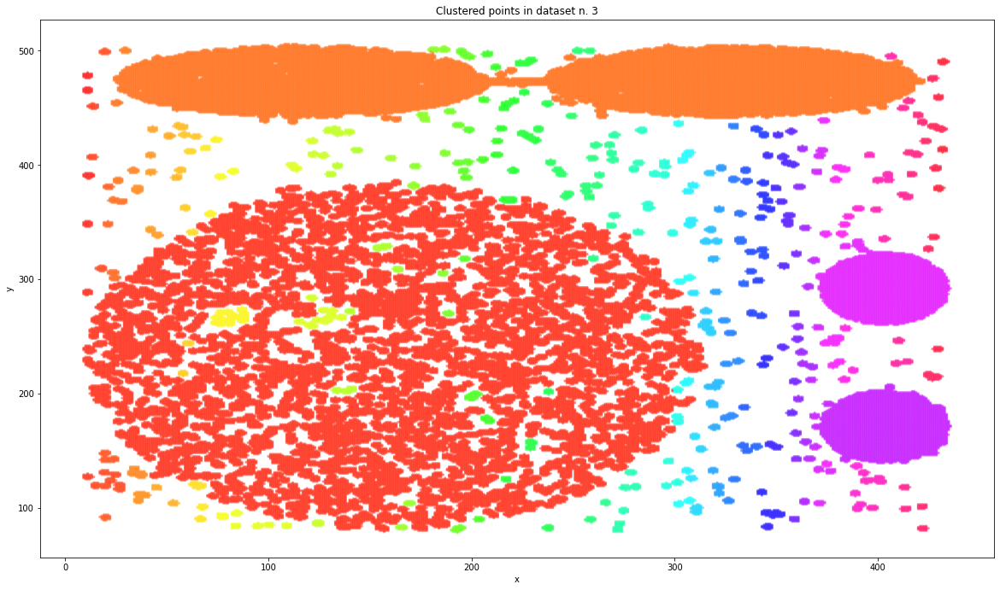

In [20]:
from itertools import cycle
fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Clustered points in dataset n. 3')

ax.set_xlabel('x')
ax.set_ylabel('y')

plt.scatter(data3[:,0], data3[:,1], s=10, edgecolors='none', c=dbscan2.labels_, alpha=0.5, cmap='hsv')

plt.show()

In the following cell I propose you to: 

1.   Set *Minpts* to a number (say **10**).
2.   Compute the **reachability distance** of the **10-th nearest neighbour ** for each data-point.
3. Sort the set of reachability distances you obtained in an increasing way.
4. Plot the sorted reachability distances
5. Find the **elbow** of the diagram => it gives the eps value combined with Minpts=10.
6. Try this combined pair of parameters on the dataset you chose, with DBSCAN.

# Test sul dataset 2

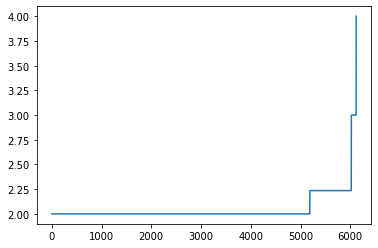

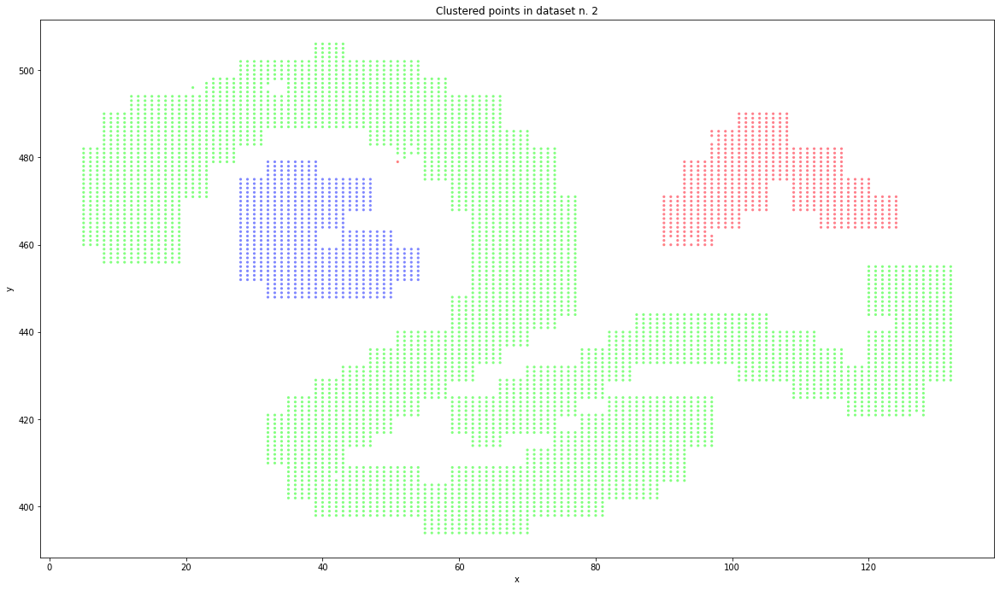

In [21]:
from sklearn.neighbors import NearestNeighbors

ns = 10
nbrs = NearestNeighbors(n_neighbors=ns).fit(data2)
distances, indices = nbrs.kneighbors(data2)
distanceDec = sorted(distances[:,ns-1], reverse=False)
plt.plot(list(range(1,len(distanceDec)+1)), distanceDec)

np.random.seed(5)

dbscan = DBSCAN(eps=2, min_samples=10).fit(data2)

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Clustered points in dataset n. 2')

ax.set_xlabel('x')
ax.set_ylabel('y')

plt.scatter(data2[:,0], data2[:,1], s=10, edgecolors='none', c=dbscan.labels_, alpha=0.5, cmap='hsv')

plt.show()

# Test sul dataset 3

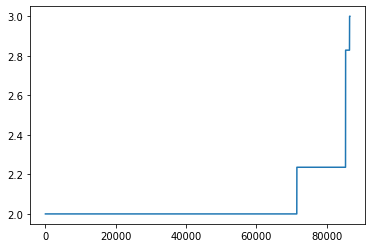

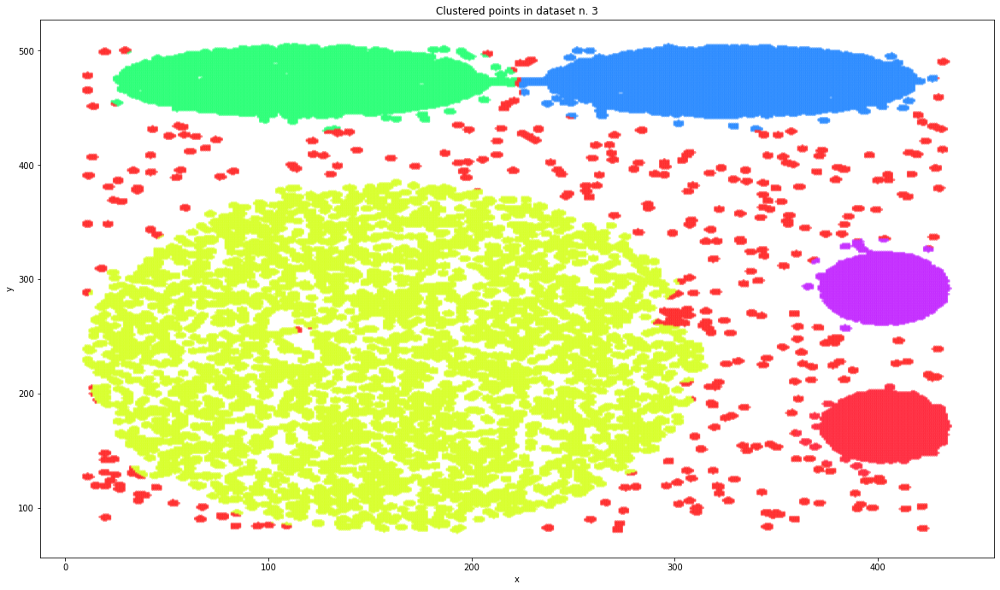

In [27]:
from sklearn.neighbors import NearestNeighbors

ns = 10
nbrs = NearestNeighbors(n_neighbors=ns).fit(data3)
distances, indices = nbrs.kneighbors(data3)
distanceDec = sorted(distances[:,ns-1], reverse=False)
plt.plot(indices[:,0], distanceDec)

np.random.seed(5)

dbscan = DBSCAN(eps=14, min_samples=400).fit(data3)

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111)
fig.subplots_adjust(top=1)
ax.set_title('Clustered points in dataset n. 3')

ax.set_xlabel('x')
ax.set_ylabel('y')

plt.scatter(data3[:,0], data3[:,1], s=10, edgecolors='none', c=dbscan.labels_, alpha=0.5, cmap='hsv')
plt.show()